# GEEANNT version 0.6

Starting back creating an organized python package

In [1]:
# ==========================================================
# Imports
# ==========================================================
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"   # reduce TensorFlow log verbosity

import random
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import Image

import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing

import scipy.stats as st
from scipy.stats import chi2, norm, ks_2samp, wasserstein_distance
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
from scipy.constants import c, m_e

from astropy.stats import poisson_conf_interval

from brokenaxes import brokenaxes
from matplotlib.gridspec import GridSpec
from matplotlib.patches import FancyArrowPatch
from matplotlib import ticker
from mpl_toolkits.mplot3d.proj3d import proj_transform
from mpl_toolkits.mplot3d.axes3d import Axes3D

# Hyperparameter optimization
import optuna

# ==========================================================
# TensorFlow / Keras
# Force CPU for this project, since it is faster than tf-metal
# for this specific custom CVAE on the M1 MacBook Air
# ==========================================================
import tensorflow as tf
tf.config.set_visible_devices([], "GPU")

from tensorflow import keras
from tensorflow.keras import layers
from keras import regularizers

# ==========================================================
# Version / device checks
# ==========================================================
print("TensorFlow version:", tf.__version__)
print("Keras version     :", keras.__version__)

print("\nPhysical devices  :", tf.config.list_physical_devices())
print("Physical GPU(s)   :", tf.config.list_physical_devices("GPU"))

print("\nLogical devices   :", tf.config.list_logical_devices())
print("Logical GPU(s)    :", tf.config.list_logical_devices("GPU"))

TensorFlow version: 2.16.2
Keras version     : 3.12.1

Physical devices  : [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Physical GPU(s)   : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

Logical devices   : [LogicalDevice(name='/device:CPU:0', device_type='CPU')]
Logical GPU(s)    : []


In [2]:
import GEEANNT as ge
print(ge.__version__)
print(ge.CVAE_CatEnergy_CatUV)
print(ge.CVAE_CatEnergy_CatUV_TaskAdaptive)

ge.initialize_environment(seed=42)


0.6.1
<class 'GEEANNT.core.model.CVAE_CatEnergy_CatUV'>
<class 'GEEANNT.core.model.CVAE_CatEnergy_CatUV_TaskAdaptive'>


## Dataset Import and Checks

In [3]:
df = ge.load_detector_table(
    filepath="/Users/francesco/Desktop/Università/Magistrale/Tesi/Sim/S1GDMLSRON3Step/GEEANNT/alloutputDSCryoSphereSmall.dat"
)

center = (0.0, 0.0, -507.66)
R = 100.0

ge.report_basic_table_checks(df)

prep = ge.build_physical_features(
    df,
    center=(0.0, 0.0, -507.66),
    radius=100.0,
)

ge.print_physical_summary(prep)

feat = prep["features"]
raw = prep["raw"]
proj = prep["projected"]
normdir = prep["normalized_direction"]
derived = prep["derived"]

/Users/francesco/Desktop/Università/Dottorato/GEEANNT/GEEANNT_package/GEEANNT/data/io.py:47: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support sep=None with delim_whitespace=False; you can avoid this warning by specifying engine='python'.
  df = pd.read_table(


N rows: 1873609
  ParticleName    Energy        X         Y        Z        Vx        Vy  \
0        gamma  0.150271  19.6164  90.88580 -473.600  0.096896 -0.990521   
1        gamma  0.091620 -31.8887 -82.91700 -463.909  0.913246  0.194270   
2        gamma  0.113628  94.9088   9.60548 -481.123 -0.169791  0.894456   
3        gamma  0.305449 -47.4416 -25.87610 -424.650  0.697276 -0.601885   
4        gamma  0.258675  21.8070  91.71120 -537.841 -0.668961 -0.634526   

         Vz  
0 -0.097358  
1 -0.358107  
2 -0.413667  
3 -0.389283  
4 -0.387128  

NaN per column:
 ParticleName    0
Energy          0
X               0
Y               0
Z               0
Vx              0
Vy              0
Vz              0
dtype: int64

--- RAW sphere check ---
r: mean = 99.23411918434232 std = 0.40461867908293037 min = 98.93981564523723 max = 100.06006989051981
Mean absolute deviation from R: 0.7682885734999307

--- RAW direction norm check ---
||v||: mean = 0.9999999998903653 std = 2.8861366412906

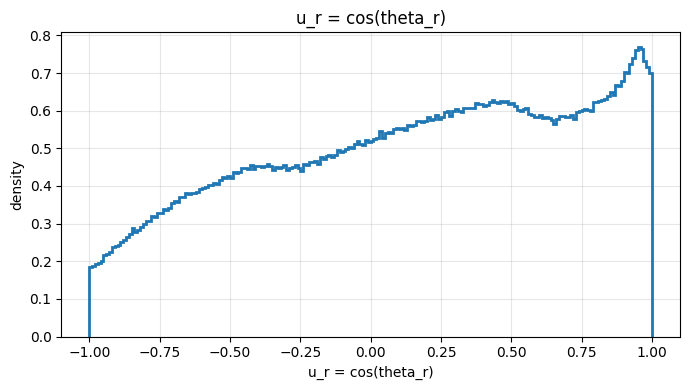

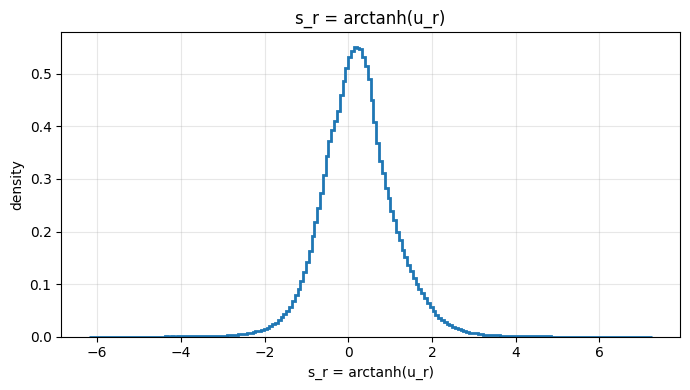

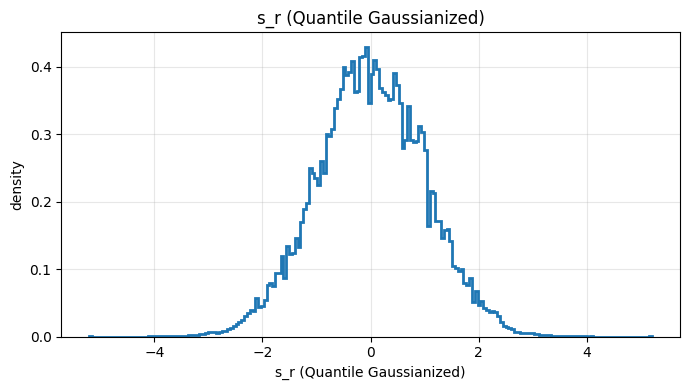

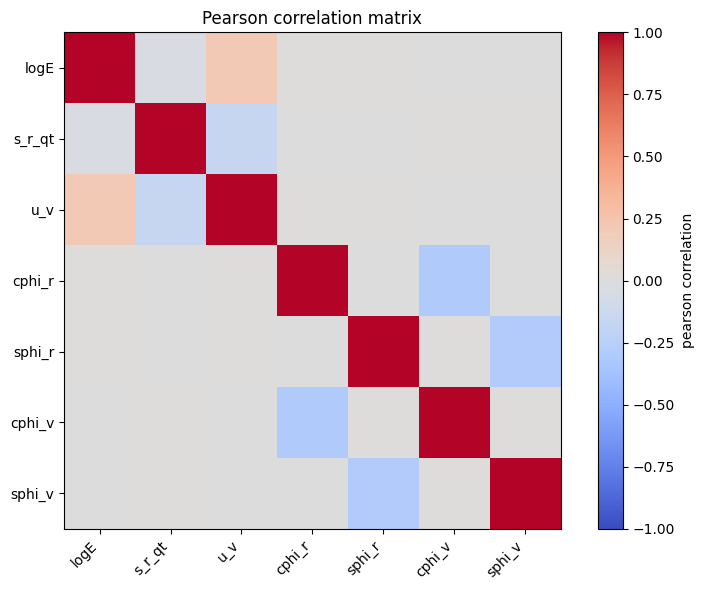

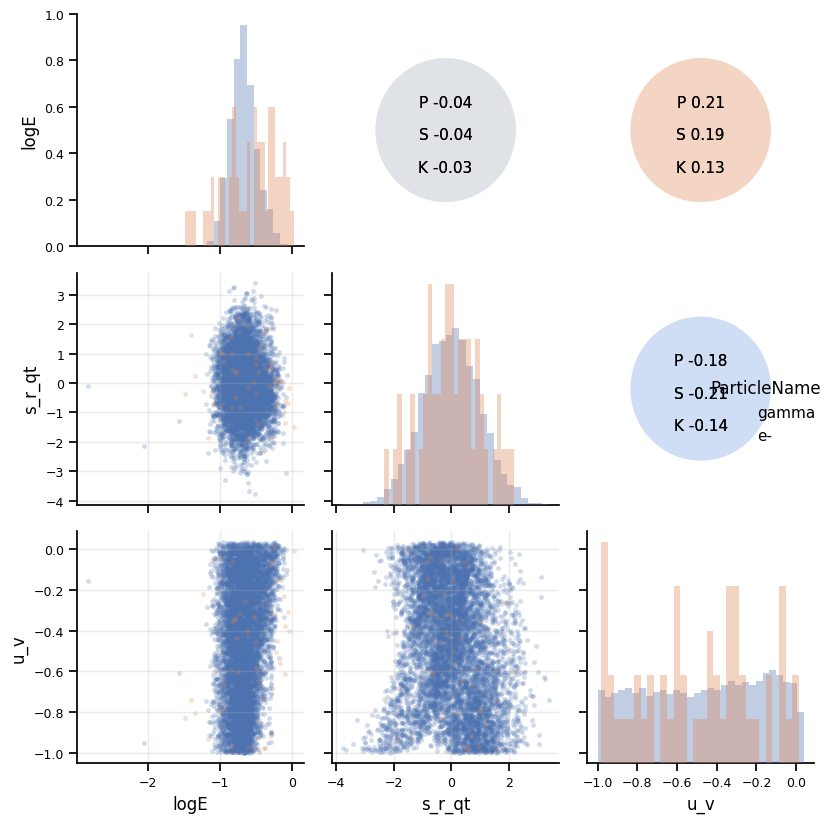

In [4]:
from sklearn.preprocessing import QuantileTransformer

# --------------------------------------------
# Experimental test: quantile Gaussianization of u_r
# --------------------------------------------

u_r = np.tanh(feat["s_r"].to_numpy())   # invert current arctanh transform

qt = QuantileTransformer(
    n_quantiles=min(500, len(u_r)),
    output_distribution="normal",
    random_state=42,
)

s_r_qt = qt.fit_transform(
    u_r.reshape(-1,1)
).flatten()

ge.plot_dist(
    u_r,
    "u_r = cos(theta_r)",
    range_=(-1,1)
)

ge.plot_dist(
    feat["s_r"],
    "s_r = arctanh(u_r)"
)

ge.plot_dist(
    s_r_qt,
    "s_r (Quantile Gaussianized)"
)

# Optional correlations test with transformed variable
feat_qt = feat.copy()
feat_qt["s_r_qt"] = s_r_qt

corr_cols_qt = [
    "logE",
    "s_r_qt",
    "u_v",
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_correlation_matrix(
    feat_qt,
    corr_cols_qt,
    method="pearson"
)

ge.plot_pairgrid_physics(
    feat_qt,
    cols=["logE","s_r_qt","u_v"],
    class_col="ParticleName",
    sample_size=8000,
    lower_mode="scatter",
    bins=30
)

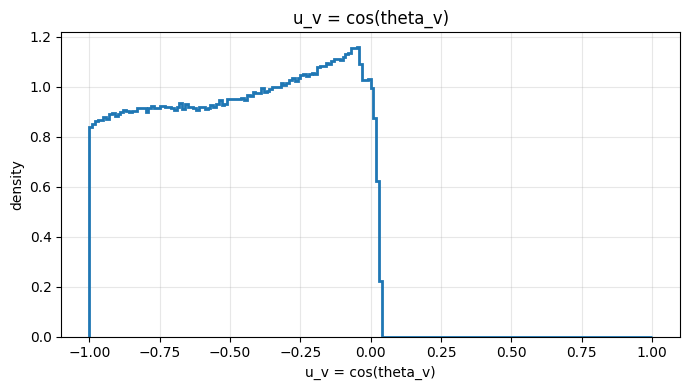

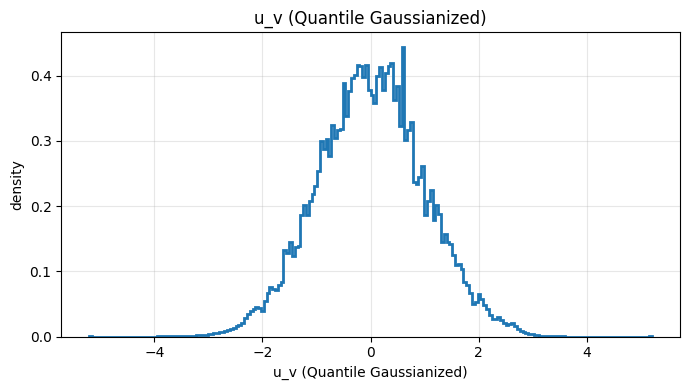

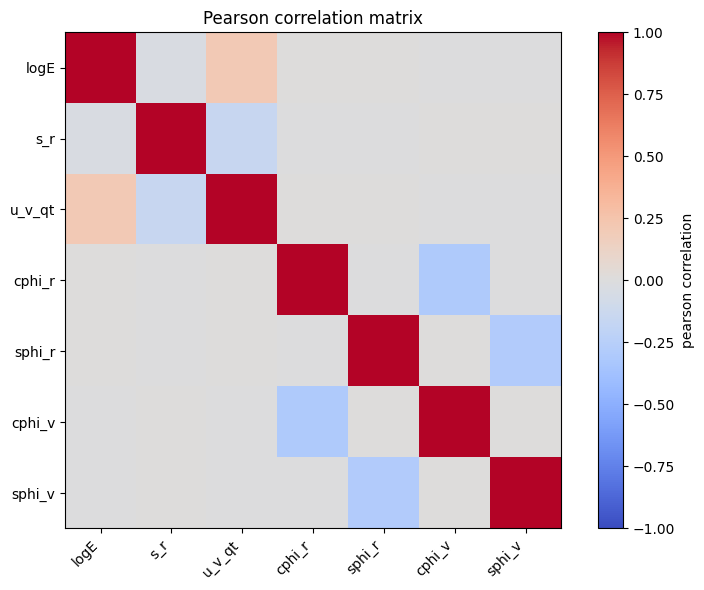

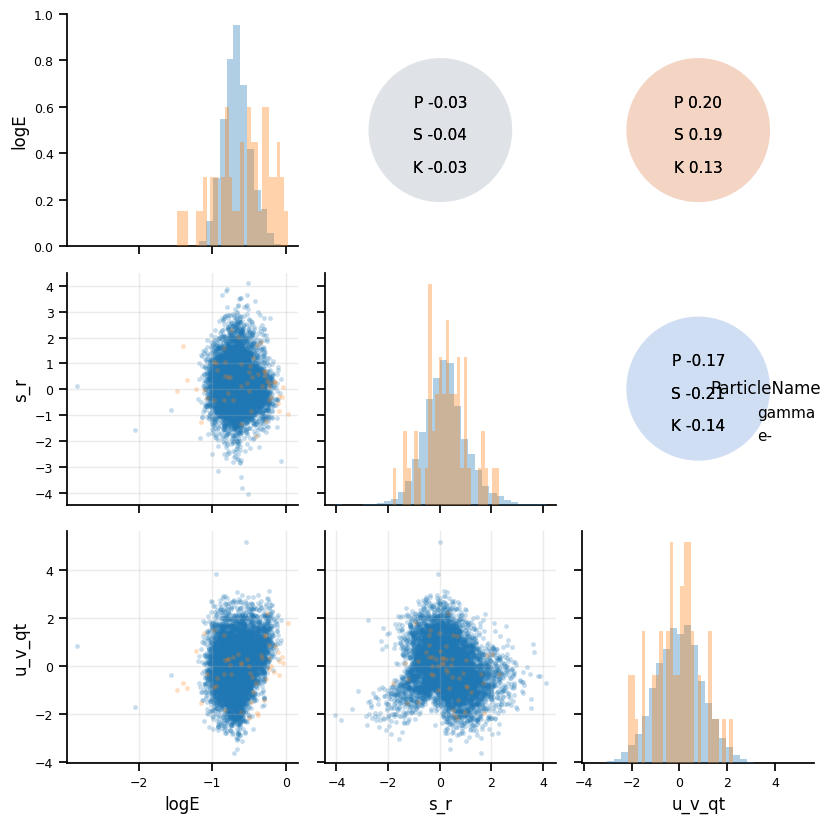

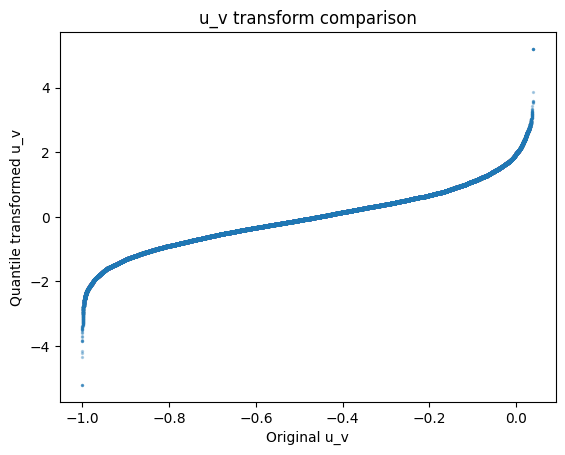

In [5]:
from sklearn.preprocessing import QuantileTransformer
import matplotlib.pyplot as plt

# --------------------------------------------
# Experimental test: quantile Gaussianization of u_v
# --------------------------------------------

u_v = feat["u_v"].to_numpy()

qt_uv = QuantileTransformer(
    n_quantiles=min(200, len(u_v)),
    output_distribution="normal",
    random_state=42,
)

u_v_qt = qt_uv.fit_transform(
    u_v.reshape(-1,1)
).flatten()

# Distribution comparison
ge.plot_dist(
    u_v,
    "u_v = cos(theta_v)",
    range_=(-1,1)
)

ge.plot_dist(
    u_v_qt,
    "u_v (Quantile Gaussianized)"
)

# Correlation comparison
feat_qt = feat.copy()
feat_qt["u_v_qt"] = u_v_qt

corr_cols_qt = [
    "logE",
    "s_r",
    "u_v_qt",
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_correlation_matrix(
    feat_qt,
    corr_cols_qt,
    method="pearson"
)

# Pairgrid diagnostic
ge.plot_pairgrid_physics(
    feat_qt,
    cols=["logE","s_r","u_v_qt"],
    class_col="ParticleName",
    sample_size=8000,
    lower_mode="scatter",
    bins=30, 
    theme="light",
    palette="tab10",
)
plt.show()

# Compare transform shape
plt.figure()
plt.scatter(
    u_v[::20],
    u_v_qt[::20],
    s=2,
    alpha=0.3
)
plt.xlabel("Original u_v")
plt.ylabel("Quantile transformed u_v")
plt.title("u_v transform comparison")
plt.show()

In [30]:
ge.set_plot_theme("light")

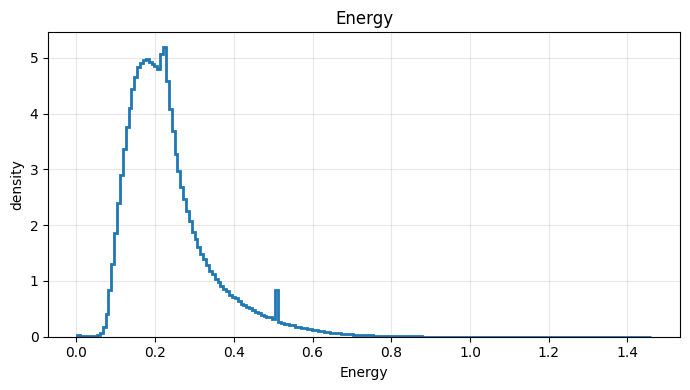

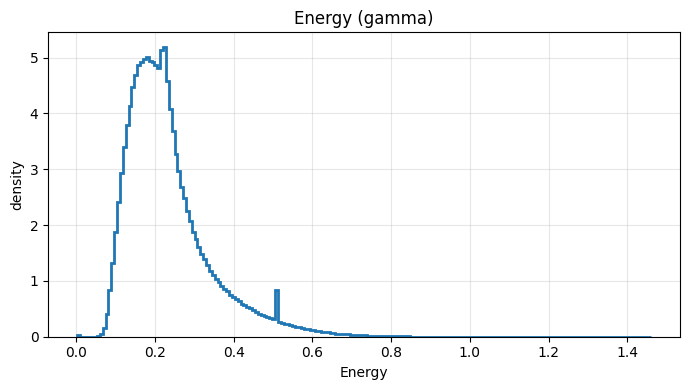

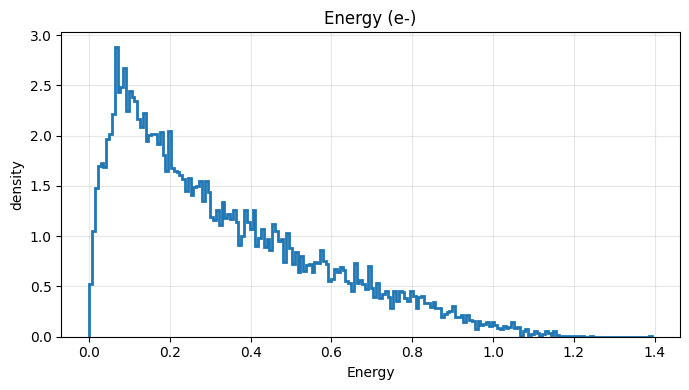

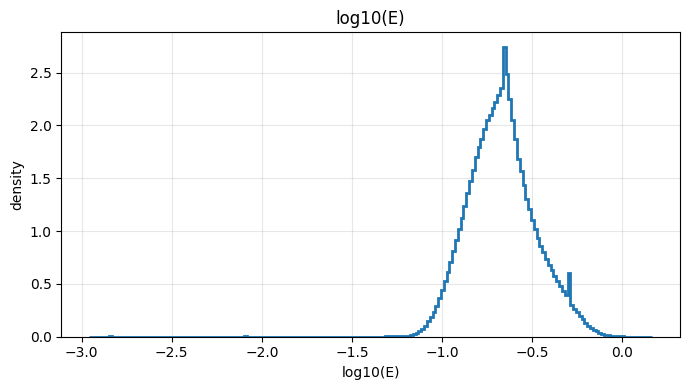

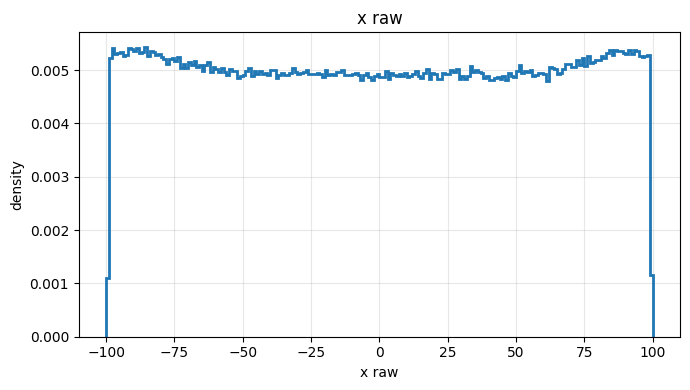

...

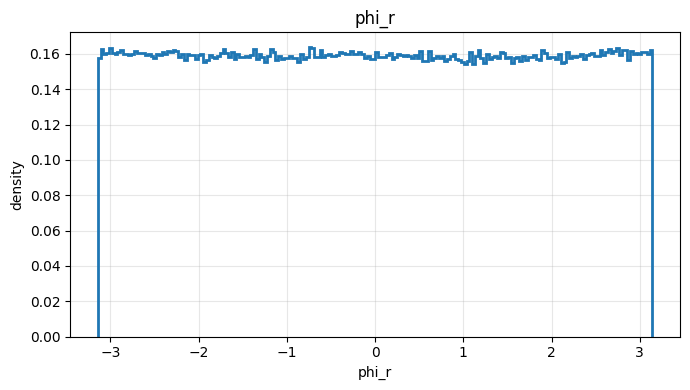

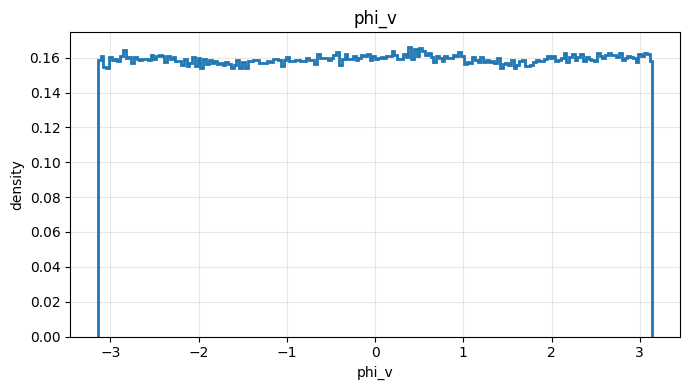

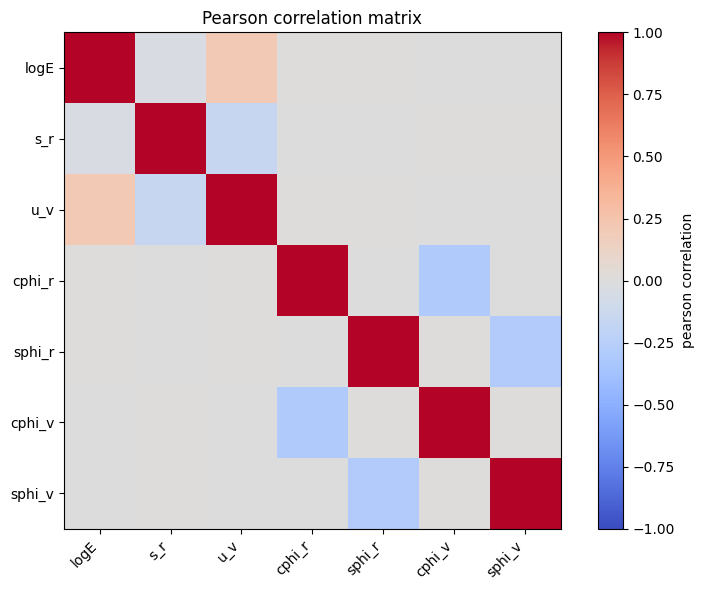

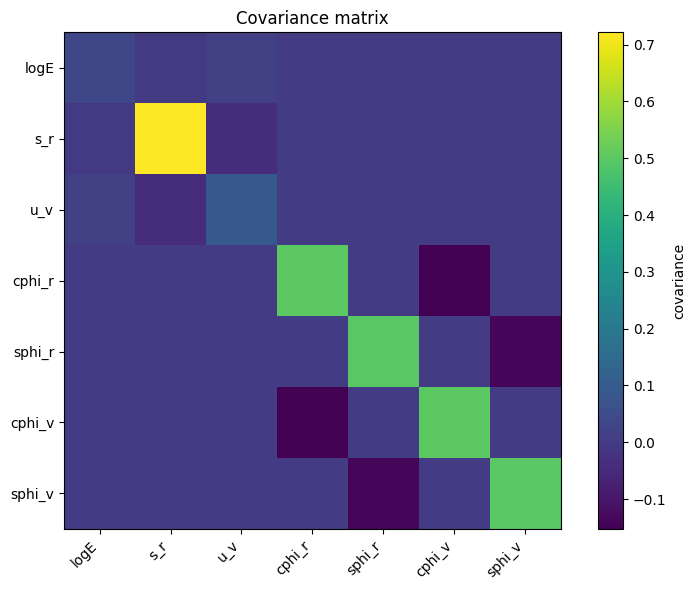

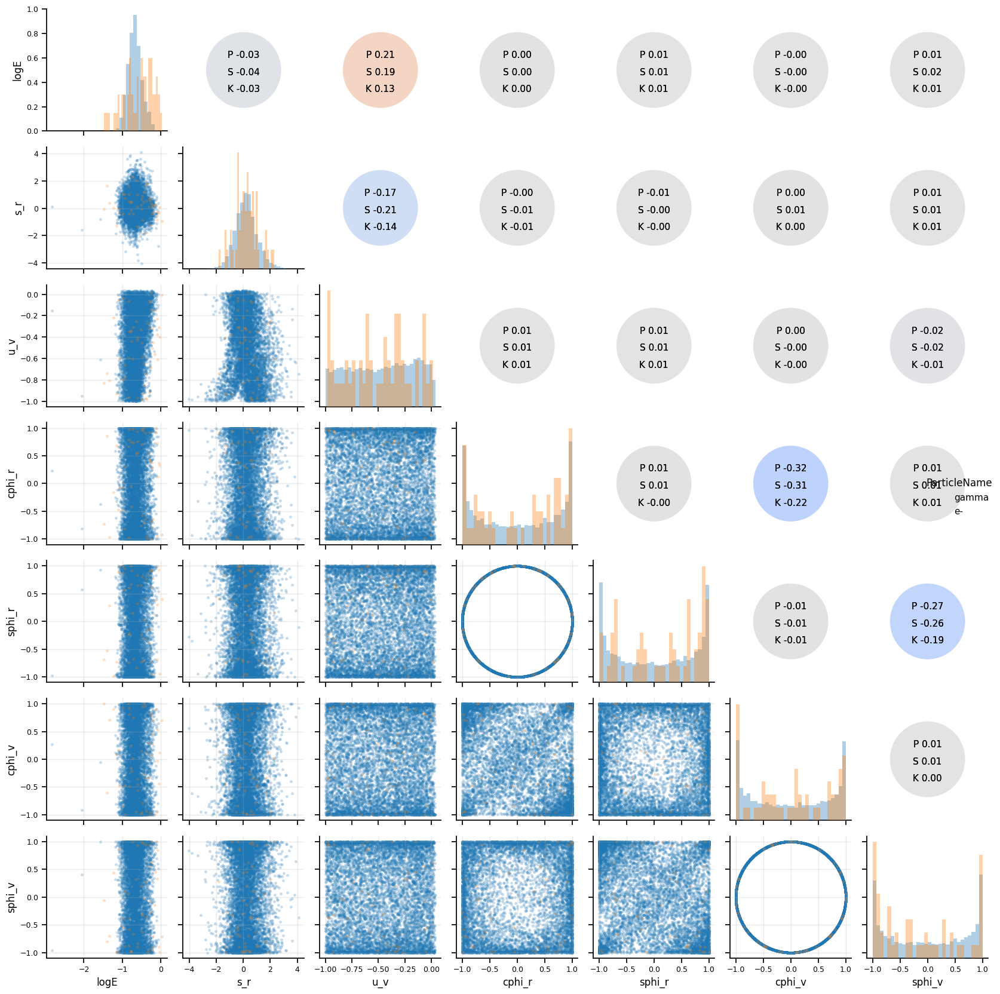

In [6]:
ge.plot_dist(feat["Energy"], "Energy")
ge.plot_dist_by_class(feat, "Energy", selected_class="gamma")
ge.plot_dist_by_class(feat, "Energy", selected_class="e-")
ge.plot_dist(feat["logE"], "log10(E)")

ge.plot_dist(raw["x"], "x raw")
ge.plot_dist(raw["y"], "y raw")
ge.plot_dist(raw["z"], "z raw")
ge.plot_dist(raw["r"], "r raw")

ge.plot_dist(proj["x"], "x projected")
ge.plot_dist(proj["y"], "y projected")
ge.plot_dist(proj["z"], "z projected")

ge.plot_dist(normdir["vx"], "vx")
ge.plot_dist(normdir["vy"], "vy")
ge.plot_dist(normdir["vz"], "vz")

ge.plot_dist(feat["s_r"], "s_r")
ge.plot_dist(feat["cphi_r"], "cos(phi_r)", range_=(-1, 1))
ge.plot_dist(feat["sphi_r"], "sin(phi_r)", range_=(-1, 1))
ge.plot_dist(feat["u_v"], "u_v = cos(theta_v)", range_=(-1, 1))
ge.plot_dist(feat["cphi_v"], "cos(phi_v)", range_=(-1, 1))
ge.plot_dist(feat["sphi_v"], "sin(phi_v)", range_=(-1, 1))
ge.plot_dist(derived["phi_r"], "phi_r", range_=(-np.pi, np.pi))
ge.plot_dist(derived["phi_v"], "phi_v", range_=(-np.pi, np.pi))


corr_cols = ["logE", "s_r", "u_v", "cphi_r", "sphi_r", "cphi_v", "sphi_v"]
corr = ge.plot_correlation_matrix(feat, corr_cols, method="pearson")
cov = ge.plot_covariance_matrix(feat, corr_cols)

corr_cols = [
    "logE",
    "s_r",
    "u_v",
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_pairgrid_physics(
    feat,
    cols=corr_cols,
    class_col="ParticleName",
    sample_size=8000,
    lower_mode="scatter",
    bins=30,
    contour_levels=8,
    figsize_scale=2.4,
    theme="light",
    palette="tab10"
)
plt.show()

In [7]:
feature_pack = ge.build_feature_dataframe(
    prep,
    energy_binning_mode="log_fixed_count",
    e_min_cut=0.05,
    e_max_cut=0.8,
    bin_width=0.500,
    n_bins=256,
    min_counts=20,
)

ge.report_feature_dataframe(feature_pack)

feat = feature_pack["feat"]
energy_bins = feature_pack["energy_bins"]
n_energy_bins = feature_pack["n_energy_bins"]

# optional: use filtered prep if needed downstream
prep = feature_pack["filtered_prep"]


feat shape: (1870448, 8)

First rows:
  ParticleName  E_idx       s_r    cphi_r    sphi_r       u_v    cphi_v  \
0        gamma    101  0.358586  0.210977  0.977491 -0.097358  0.097358   
1        gamma     55  0.474478 -0.358955 -0.933355 -0.358107  0.978114   
2        gamma     75  0.274716  0.994918  0.100693 -0.413667 -0.186496   
3        gamma    167  1.214620 -0.877904 -0.478836 -0.389283  0.756988   
4        gamma    151 -0.314929  0.231329  0.972875 -0.387128 -0.725534   

     sphi_v  
0 -0.995249  
1  0.208069  
2  0.982456  
3 -0.653428  
4 -0.688187  

--- Finite check ---
Rows with NaN/Inf: 0

--- Feature ranges ---
     s_r : -6.184892177581787  7.254328727722168
  cphi_r : -1.0  1.0
  sphi_r : -1.0  1.0
     u_v : -0.9999989867210388  0.0394543893635273
  cphi_v : -1.0  1.0
  sphi_v : -1.0  1.0

--- Unit circle checks ---
position: mean = 1.0 std = 2.5750332e-08 min = 0.99999994 max = 1.0
direction: mean = 1.0 std = 2.5731257e-08 min = 0.99999994 max = 1.0

--- u_v c

## Standardization and Preprocessing

Original particle types: 2
Kept particle types    : 2
Types: ['gamma', 'e-']

Empirical probabilities:
       gamma  p=9.936218e-01
          e-  p=6.378202e-03

--- u_v binning ---
Requested bins: 128
Effective bins: 128
u_v min/max in data: -0.9999989867210388 0.0394543893635273
u_v bin edges min/max: -0.9999999867210388 0.0394553893635273
Min counts per bin: 14612
Max counts per bin: 14614
Mean counts per bin: 14612.7578125
Empty bins: 0

Shapes:
X_cont_raw: (1870433, 5)
E_idx     : (1870433,)
u_v_idx   : (1870433,)
y_type    : (1870433,)

--- Continuous feature ranges (RAW) ---
     s_r : -6.184892177581787  7.254328727722168
  cphi_r : -1.0  1.0
  sphi_r : -1.0  1.0
  cphi_v : -1.0  1.0
  sphi_v : -1.0  1.0

--- Continuous means/std ---
     s_r : mean= 0.225491  std= 0.849479
  cphi_r : mean=-0.002377  std= 0.708139
  sphi_r : mean=-0.001682  std= 0.706067
  cphi_v : mean= 0.001015  std= 0.709019
  sphi_v : mean= 0.002079  std= 0.705185

--- u_v reconstruction from bins ---
u_v r

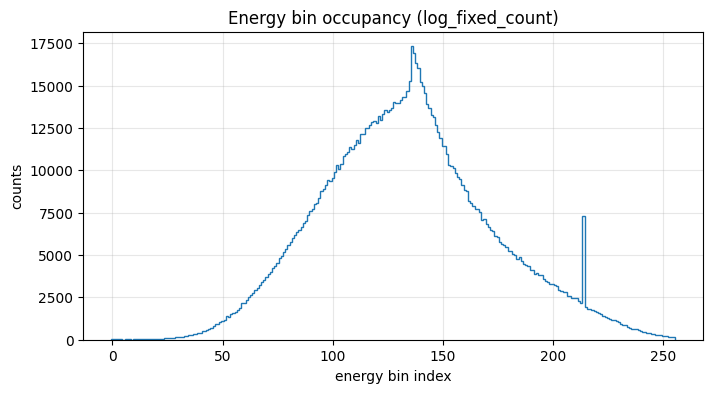

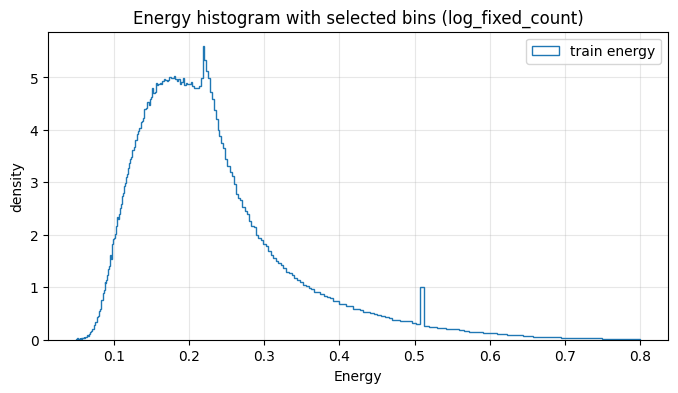

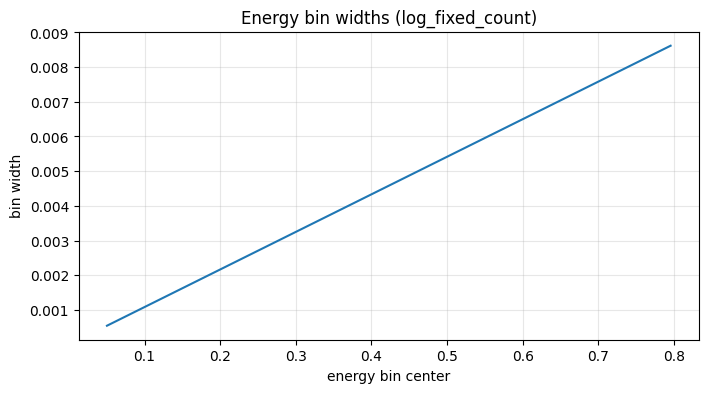

In [8]:
dataset_pack = ge.filter_particle_types_and_discretize_uv(
    feat=feature_pack["feat"],
    prob_threshold=1e-5,
    uv_nbins=128,
)

ge.report_discretized_features(dataset_pack)

split_pack = ge.split_feature_data(
    dataset_pack,
    test_size_total=0.30,
    val_size_from_temp=0.50,
    random_state=42,
)

ge.report_split_summary(split_pack, n_types=dataset_pack["n_types"])

scaled_pack = ge.scale_continuous_features(
    split_pack,
    scale_cols=(0,),
)

ge.report_scaled_features(scaled_pack)

condition_pack = ge.build_conditioning_and_weights(
    scaled_pack,
    n_types=dataset_pack["n_types"],
    idx_to_type=dataset_pack["idx_to_type"],
    alpha=0.5,
)

ge.report_conditioning(condition_pack, n_types=dataset_pack["n_types"])

tf_pack = ge.build_tf_datasets(
    condition_pack,
    batch_size=4096,
    shuffle_buffer_cap=200_000,
)

ge.report_tf_datasets(tf_pack)

ge.report_energy_binning_diagnostics(
    energy_bins=feature_pack["energy_bins"],
    E_idx=dataset_pack["E_idx"],
    E_values=feature_pack["filtered_prep"]["features"]["Energy"].to_numpy(),
    idx_train=split_pack["idx_train"],
    energy_binning_mode=feature_pack["energy_config"]["mode"],
    bin_width=feature_pack["energy_config"]["bin_width"],
    n_bins=feature_pack["energy_config"]["n_bins"],
    min_counts=feature_pack["energy_config"]["min_counts"],
)

In [9]:
feat = dataset_pack["feat"]

X_cont_train_s = tf_pack["X_cont_train_s"]
X_cont_val_s = tf_pack["X_cont_val_s"]
X_cont_test_s = tf_pack["X_cont_test_s"]

E_train = tf_pack["E_train"]
E_val = tf_pack["E_val"]
E_test = tf_pack["E_test"]

u_v_train = tf_pack["u_v_train"]
u_v_val = tf_pack["u_v_val"]
u_v_test = tf_pack["u_v_test"]

cond_train = tf_pack["cond_train"]
cond_val = tf_pack["cond_val"]
cond_test = tf_pack["cond_test"]

train_ds = tf_pack["train_ds"]
val_ds = tf_pack["val_ds"]
test_ds = tf_pack["test_ds"]

type_weights = tf_pack["type_weights"]

u_v_bins = dataset_pack["u_v_bins"]
u_v_centers = dataset_pack["u_v_centers"]
U_V_NBINS_EFF = dataset_pack["uv_nbins_eff"]
n_types = dataset_pack["n_types"]
idx_to_type = dataset_pack["idx_to_type"]

s_r_mean = scaled_pack["s_r_mean"]
s_r_std = scaled_pack["s_r_std"]

In [10]:
# ==========================================================
# Recover all main objects from package outputs
# ==========================================================

feat = dataset_pack["feat"]

# scaled / model-side
X_cont_train_s = tf_pack["X_cont_train_s"]
X_cont_val_s = tf_pack["X_cont_val_s"]
X_cont_test_s = tf_pack["X_cont_test_s"]

# unscaled / physics-side
X_cont_train = tf_pack["X_cont_train"]
X_cont_val = tf_pack["X_cont_val"]
X_cont_test = tf_pack["X_cont_test"]

# categorical indices
E_train = tf_pack["E_train"]
E_val = tf_pack["E_val"]
E_test = tf_pack["E_test"]

u_v_train = tf_pack["u_v_train"]
u_v_val = tf_pack["u_v_val"]
u_v_test = tf_pack["u_v_test"]

# raw physical references
u_v_train_raw = tf_pack["u_v_train_raw"]
u_v_val_raw = tf_pack["u_v_val_raw"]
u_v_test_raw = tf_pack["u_v_test_raw"]

E_all_filtered = feature_pack["filtered_prep"]["features"]["Energy"].to_numpy()
E_train_raw = E_all_filtered[split_pack["idx_train"]]
E_val_raw = E_all_filtered[split_pack["idx_val"]]
E_test_raw = E_all_filtered[split_pack["idx_test"]]

# conditioning
cond_train = tf_pack["cond_train"]
cond_val = tf_pack["cond_val"]
cond_test = tf_pack["cond_test"]

# datasets
train_ds = tf_pack["train_ds"]
val_ds = tf_pack["val_ds"]
test_ds = tf_pack["test_ds"]

# weights / probabilities
type_weights = tf_pack["type_weights"]
type_probs = dataset_pack["type_probs"]

# metadata
u_v_bins = dataset_pack["u_v_bins"]
u_v_centers = dataset_pack["u_v_centers"]
U_V_NBINS_EFF = dataset_pack["uv_nbins_eff"]
n_types = dataset_pack["n_types"]
idx_to_type = dataset_pack["idx_to_type"]

# scaling params
s_r_mean = scaled_pack["s_r_mean"]
s_r_std = scaled_pack["s_r_std"]

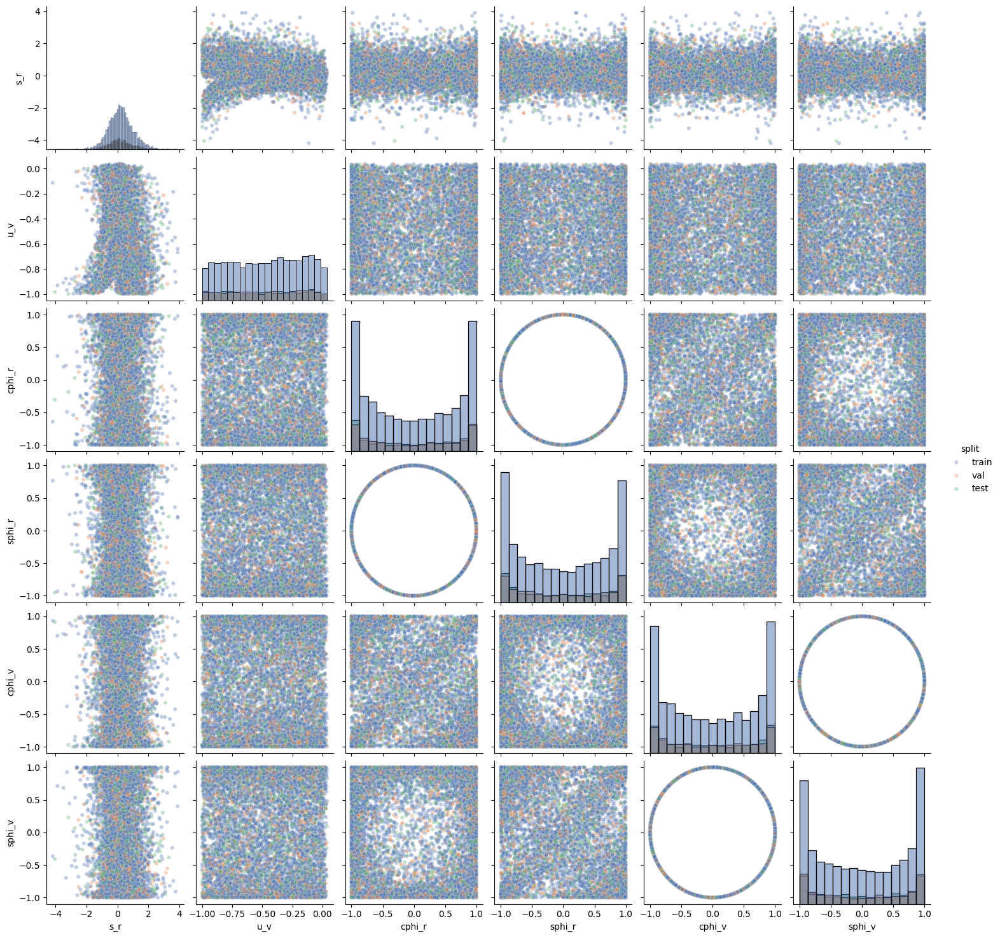

In [11]:
df_train_plot = dataset_pack["feat"].iloc[split_pack["idx_train"]].copy()
df_val_plot = dataset_pack["feat"].iloc[split_pack["idx_val"]].copy()
df_test_plot = dataset_pack["feat"].iloc[split_pack["idx_test"]].copy()

df_train_plot["split"] = "train"
df_val_plot["split"] = "val"
df_test_plot["split"] = "test"

df_all_splits = pd.concat(
    [df_train_plot, df_val_plot, df_test_plot],
    axis=0,
    ignore_index=True
)

ge.plot_pairwise_sample(
    df_all_splits,
    cols=["s_r", "u_v", "cphi_r", "sphi_r", "cphi_v", "sphi_v"],
    class_col="split",
    sample_size=8000,
)
plt.show()

## Model and Training

In [78]:
#### VERSION WITH IMPROVEMENTS TO U_V MODELING AND SAMPLING ####
# ==========================================================
# CVAE_CatEnergy_CatUV
# Improved version:
# - stronger sr / phi_r / phi_v heads
# - smoothed categorical loss for u_v
# - softer sampling for u_v
# - uniform sampling inside the selected u_v bin
# ==========================================================

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


class CVAE_CatEnergy_CatUV(keras.Model):
    """
    Conditional VAE with:
      - categorical energy head
      - Gaussian s_r head
      - categorical u_v head
      - 2D phi_r head
      - 2D phi_v head
    """

    def __init__(
        self,
        n_types,
        n_energy_bins,
        n_uv_bins,
        uv_bin_edges,
        latent_dim=8,
        hidden=(128, 128, 64),
        beta=0.1,
        type_weights=None,

        # Gaussian head control
        min_log_sigma=-6.0,
        max_log_sigma=1.5,

        # Regularization
        lambda_sigma=1e-3,
        sigma_target=-2.0,
        lambda_phi=1e-2,
        lambda_phi_r=1e-2,

        # Reconstruction weights
        w_energy=1.0,
        w_sr=1.0,
        w_uv=1.0,
        w_phi_r=1.0,
        w_phi_v=1.0,
        w_xy=0.0,

        # Geometry
        sphere_R=100.0,

        # New controls for u_v categorical modeling
        uv_label_smoothing=0.08,          # total smoothing mass
        uv_neighbor_smoothing=True,       # spread smoothing on adjacent bins
        uv_sampling_temperature=1.10,     # >1 softer sampling
        energy_sampling_temperature=1.00, # keep energy unchanged unless needed
        sample_uv_uniform_inside_bin=True,
    ):
        super().__init__()

        self.n_types = n_types
        self.n_energy_bins = int(n_energy_bins)
        self.n_uv_bins = int(n_uv_bins)
        self.latent_dim = latent_dim
        self.beta = beta
        self.type_weights = type_weights

        self.min_log_sigma = min_log_sigma
        self.max_log_sigma = max_log_sigma

        self.lambda_sigma = lambda_sigma
        self.sigma_target = sigma_target
        self.lambda_phi = lambda_phi
        self.lambda_phi_r = lambda_phi_r

        self.w_energy = w_energy
        self.w_sr = w_sr
        self.w_uv = w_uv
        self.w_phi_r = w_phi_r
        self.w_phi_v = w_phi_v
        self.w_xy = w_xy

        self.sphere_R = sphere_R

        self.uv_label_smoothing = uv_label_smoothing
        self.uv_neighbor_smoothing = uv_neighbor_smoothing
        self.uv_sampling_temperature = uv_sampling_temperature
        self.energy_sampling_temperature = energy_sampling_temperature
        self.sample_uv_uniform_inside_bin = sample_uv_uniform_inside_bin

        uv_bin_edges = tf.convert_to_tensor(uv_bin_edges, dtype=tf.float32)
        self.uv_bin_edges = uv_bin_edges
        self.uv_bin_centers = 0.5 * (uv_bin_edges[:-1] + uv_bin_edges[1:])

        # ======================================================
        # Encoder
        # Input:
        #   y_cont (5)
        #   energy one-hot (n_energy_bins)
        #   u_v one-hot (n_uv_bins)
        #   cond (n_types)
        # ======================================================
        enc_in = layers.Input(shape=(5 + n_energy_bins + n_uv_bins + n_types,))
        x = enc_in
        for h in hidden:
            x = layers.Dense(h)(x)
            x = layers.LeakyReLU(0.05)(x)

        z_mean = layers.Dense(latent_dim, name="z_mean")(x)
        z_logvar = layers.Dense(latent_dim, name="z_logvar")(x)

        self.encoder = keras.Model(enc_in, [z_mean, z_logvar], name="encoder")

        # ======================================================
        # Decoder backbone
        # Input: z + cond
        # ======================================================
        dec_in = layers.Input(shape=(latent_dim + n_types,))
        x = dec_in
        for h in hidden[::-1]:
            x = layers.Dense(h)(x)
            x = layers.LeakyReLU(0.02)(x)

        self.decoder_backbone = keras.Model(dec_in, x, name="decoder_backbone")

        # ======================================================
        # Decoder heads
        # ======================================================

        # 1) Energy categorical head
        self.energy_logits_head = layers.Dense(self.n_energy_bins, name="energy_logits")

        # 2) s_r Gaussian head (stronger)
        self.sr_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
        ], name="sr_head")

        self.sr_mu_head = layers.Dense(1, name="sr_mu")
        self.sr_logsigma_head = layers.Dense(1, name="sr_logsigma")

        # 3) u_v categorical head (stronger)
        self.uv_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
        ], name="uv_head")

        self.uv_logits_head = layers.Dense(self.n_uv_bins, name="uv_logits")

        # 4) phi_r expressive 2D head (stronger)
        self.phi_r_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(64),
            layers.LeakyReLU(0.03),
            layers.Dense(2)
        ], name="phi_r_head")

        # 5) phi_v expressive 2D head (much stronger)
        self.phi_v_head = keras.Sequential([
            layers.Dense(64),
            layers.LeakyReLU(0.01),     # Keep phi_v head relatively simple to avoid instability, but increase capacity a bit
            layers.Dense(2)             # Now the decoder learns using a phi_v_loss that combines MSE and angular loss, so it can benefit from a bit more capacity without becoming unstable
        ], name="phi_v_head")

        # ======================================================
        # Metrics
        # ======================================================
        self.loss_tracker = keras.metrics.Mean(name="loss")
        self.rec_tracker = keras.metrics.Mean(name="rec")
        self.kl_tracker = keras.metrics.Mean(name="kl")
        self.nll_tracker = keras.metrics.Mean(name="nll")

        self.sigma_reg_tracker = keras.metrics.Mean(name="sigma_reg")
        self.phi_reg_tracker = keras.metrics.Mean(name="phi_reg")
        self.phi_r_reg_tracker = keras.metrics.Mean(name="phi_r_reg")

        self.energy_ce_tracker = keras.metrics.Mean(name="energy_ce")
        self.sr_nll_tracker = keras.metrics.Mean(name="sr_nll")
        self.uv_ce_tracker = keras.metrics.Mean(name="uv_ce")
        self.phi_r_mse_tracker = keras.metrics.Mean(name="phi_r_mse")
        self.phi_v_mse_tracker = keras.metrics.Mean(name="phi_v_mse")
        self.xy_mse_tracker = keras.metrics.Mean(name="xy_mse")

        self.phi_v_ang_tracker = keras.metrics.Mean(name="phi_v_ang")
        self.phi_v_loss_tracker = keras.metrics.Mean(name="phi_v_loss")

    @property
    def metrics(self):
        return [
            self.loss_tracker,
            self.rec_tracker,
            self.kl_tracker,
            self.nll_tracker,
            self.sigma_reg_tracker,
            self.phi_reg_tracker,
            self.phi_r_reg_tracker,
            self.energy_ce_tracker,
            self.sr_nll_tracker,
            self.uv_ce_tracker,
            self.phi_r_mse_tracker,
            self.phi_v_mse_tracker,
            self.phi_v_ang_tracker,
            self.phi_v_loss_tracker,
            self.xy_mse_tracker,
        ]

    # ==========================================================
    # Utilities
    # ==========================================================
    def sample_z(self, z_mean, z_logvar):
        eps = tf.random.normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_logvar) * eps

    def _gaussian_nll(self, x, mu, log_sigma):
        sigma2 = tf.exp(2.0 * log_sigma)
        return 0.5 * ((tf.square(x - mu) / sigma2) + 2.0 * log_sigma)

    def _sigma_regularizer(self, params):
        if self.lambda_sigma <= 0:
            return tf.constant(0.0, dtype=tf.float32)

        logsigmas = params["sr_logsigma"]
        return self.lambda_sigma * tf.reduce_mean(
            tf.square(tf.nn.relu(logsigmas - self.sigma_target))
        )

    def _phi_regularizers(self, params):
        phi_r_reg = tf.constant(0.0, tf.float32)
        if self.lambda_phi_r > 0:
            c = params["phi_r"][:, 0]
            s = params["phi_r"][:, 1]
            r2 = c * c + s * s
            phi_r_reg = self.lambda_phi_r * tf.reduce_mean(tf.square(r2 - 1.0))

        phi_v_reg = tf.constant(0.0, tf.float32)
        if self.lambda_phi > 0:
            c = params["phi_v"][:, 0]
            s = params["phi_v"][:, 1]
            r2 = c * c + s * s
            phi_v_reg = self.lambda_phi * tf.reduce_mean(tf.square(r2 - 1.0))

        return phi_v_reg, phi_r_reg

    def _xy_from_sr_phi(self, s_r, phi_pair):
        u_r = tf.tanh(tf.squeeze(s_r, axis=1))

        c = phi_pair[:, 0]
        s = phi_pair[:, 1]

        norm = tf.sqrt(c * c + s * s + 1e-12)
        c = c / norm
        s = s / norm

        sin_theta = tf.sqrt(tf.maximum(0.0, 1.0 - u_r * u_r))

        x = self.sphere_R * sin_theta * c
        y = self.sphere_R * sin_theta * s
        return x, y
    
    def _angular_loss_2d(self, true_pair, pred_pair): # New function to compute angular loss for 2D pairs for phi_v
        ct = true_pair[:, 0]
        st = true_pair[:, 1]

        cp = pred_pair[:, 0]
        sp = pred_pair[:, 1]

        norm = tf.sqrt(cp * cp + sp * sp + 1e-12)
        cp = cp / norm
        sp = sp / norm

        cos_delta = ct * cp + st * sp
        cos_delta = tf.clip_by_value(cos_delta, -1.0, 1.0)

        return 1.0 - cos_delta

    def _decode_params(self, z, cond, training=False):
        x = self.decoder_backbone(tf.concat([z, cond], axis=1), training=training)

        energy_logits = self.energy_logits_head(x)

        sr_feat = self.sr_head(x)
        sr_mu = self.sr_mu_head(sr_feat)
        sr_logsigma = tf.clip_by_value(
            self.sr_logsigma_head(sr_feat),
            self.min_log_sigma,
            self.max_log_sigma
        )

        uv_feat = self.uv_head(x)
        uv_logits = self.uv_logits_head(uv_feat)

        phi_r = self.phi_r_head(x)
        phi_v = self.phi_v_head(x)

        return {
            "energy_logits": energy_logits,
            "sr_mu": sr_mu,
            "sr_logsigma": sr_logsigma,
            "uv_logits": uv_logits,
            "phi_r": phi_r,
            "phi_v": phi_v,
        }

    def _smoothed_categorical_ce(self, labels, logits, n_classes, smoothing=0.0, local_neighbors=False):
        """
        Smoothed categorical CE.
        If local_neighbors=True, smoothing mass is assigned to adjacent bins.
        """
        labels = tf.cast(labels, tf.int32)

        if smoothing <= 0.0:
            return tf.nn.sparse_softmax_cross_entropy_with_logits(labels=labels, logits=logits)

        onehot = tf.one_hot(labels, depth=n_classes, dtype=tf.float32)

        if not local_neighbors:
            target = onehot * (1.0 - smoothing) + smoothing / tf.cast(n_classes, tf.float32)
        else:
            left_idx = tf.maximum(labels - 1, 0)
            right_idx = tf.minimum(labels + 1, n_classes - 1)

            left = tf.one_hot(left_idx, depth=n_classes, dtype=tf.float32)
            right = tf.one_hot(right_idx, depth=n_classes, dtype=tf.float32)

            same_left = tf.cast(tf.equal(left_idx, labels), tf.float32)
            same_right = tf.cast(tf.equal(right_idx, labels), tf.float32)

            left_w = 0.5 * smoothing * (1.0 - same_left)
            right_w = 0.5 * smoothing * (1.0 - same_right)
            center_w = 1.0 - left_w - right_w

            target = (
                onehot * tf.expand_dims(center_w, 1) +
                left * tf.expand_dims(left_w, 1) +
                right * tf.expand_dims(right_w, 1)
            )

        log_probs = tf.nn.log_softmax(logits, axis=1)
        return -tf.reduce_sum(target * log_probs, axis=1)

    def _reconstruction_terms(self, y_cont_true, E_idx_true, uv_idx_true, params):
        """
        y_cont_true = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]
        """
        sr_true = y_cont_true[:, 0:1]
        phi_r_true = y_cont_true[:, 1:3]
        phi_v_true = y_cont_true[:, 3:5]

        # 1) Energy categorical CE
        energy_ce = tf.nn.sparse_softmax_cross_entropy_with_logits(
            labels=E_idx_true,
            logits=params["energy_logits"]
        )

        # 2) s_r Gaussian NLL
        sr_nll = tf.squeeze(
            self._gaussian_nll(sr_true, params["sr_mu"], params["sr_logsigma"]),
            axis=1
        )

        # 3) u_v categorical CE with smoothing
        uv_ce = self._smoothed_categorical_ce(
            labels=uv_idx_true,
            logits=params["uv_logits"],
            n_classes=self.n_uv_bins,
            smoothing=self.uv_label_smoothing,
            local_neighbors=self.uv_neighbor_smoothing
        )

        # 4) angular heads
        phi_r_mse = tf.reduce_sum(tf.square(phi_r_true - params["phi_r"]), axis=1)
        phi_v_mse = tf.reduce_sum(tf.square(phi_v_true - params["phi_v"]), axis=1)
        phi_v_ang = self._angular_loss_2d(phi_v_true, params["phi_v"])

        phi_v_loss = phi_v_mse + 0.5 * phi_v_ang # Combine MSE and angular loss for phi_v

        # 5) geometric xy-loss derived from sr + phi_r
        x_true, y_true_xy = self._xy_from_sr_phi(sr_true, phi_r_true)
        x_pred, y_pred_xy = self._xy_from_sr_phi(params["sr_mu"], params["phi_r"])

        xy_mse = tf.square(x_true - x_pred) + tf.square(y_true_xy - y_pred_xy)

        rec_per = (
            self.w_energy * energy_ce +
            self.w_sr     * sr_nll +
            self.w_uv     * uv_ce +
            self.w_phi_r  * phi_r_mse +
            self.w_phi_v  * phi_v_loss +    # Use combined loss for phi_v
            self.w_xy     * xy_mse
        )

        pieces = {
            "energy_ce": energy_ce,
            "sr_nll": sr_nll,
            "uv_ce": uv_ce,
            "phi_r_mse": phi_r_mse,
            "phi_v_mse": phi_v_mse,
            "phi_v_ang": phi_v_ang,
            "phi_v_loss": phi_v_loss,
            "xy_mse": xy_mse,
        }
        return rec_per, pieces

    # ==========================================================
    # Keras train/test
    # ==========================================================
    def train_step(self, data):
        (y_cont, E_idx_true, uv_idx_true, cond), _ = data

        E_onehot = tf.one_hot(E_idx_true, depth=self.n_energy_bins, dtype=tf.float32)
        uv_onehot = tf.one_hot(uv_idx_true, depth=self.n_uv_bins, dtype=tf.float32)

        x_in = tf.concat([y_cont, E_onehot, uv_onehot, cond], axis=1)

        with tf.GradientTape() as tape:
            z_mean, z_logvar = self.encoder(x_in, training=True)
            z = self.sample_z(z_mean, z_logvar)

            params = self._decode_params(z, cond, training=True)
            rec_per, pieces = self._reconstruction_terms(y_cont, E_idx_true, uv_idx_true, params)

            if self.type_weights is not None:
                t_idx = tf.argmax(cond, axis=1, output_type=tf.int32)
                w = tf.gather(self.type_weights, t_idx)
                rec_per_weighted = rec_per * w
            else:
                rec_per_weighted = rec_per

            rec = tf.reduce_mean(rec_per_weighted)
            nll = tf.reduce_mean(rec_per)

            kl_per = -0.5 * tf.reduce_sum(
                1.0 + z_logvar - tf.square(z_mean) - tf.exp(z_logvar),
                axis=1
            )
            kl = tf.reduce_mean(kl_per)

            sigma_reg = self._sigma_regularizer(params)
            phi_reg, phi_r_reg = self._phi_regularizers(params)

            loss = rec + self.beta * kl + sigma_reg + phi_reg + phi_r_reg

        grads = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(grads, self.trainable_variables))

        self.loss_tracker.update_state(loss)
        self.rec_tracker.update_state(rec)
        self.kl_tracker.update_state(kl)
        self.nll_tracker.update_state(nll)

        self.sigma_reg_tracker.update_state(sigma_reg)
        self.phi_reg_tracker.update_state(phi_reg)
        self.phi_r_reg_tracker.update_state(phi_r_reg)

        self.energy_ce_tracker.update_state(tf.reduce_mean(pieces["energy_ce"]))
        self.sr_nll_tracker.update_state(tf.reduce_mean(pieces["sr_nll"]))
        self.uv_ce_tracker.update_state(tf.reduce_mean(pieces["uv_ce"]))
        self.phi_r_mse_tracker.update_state(tf.reduce_mean(pieces["phi_r_mse"]))
        self.phi_v_mse_tracker.update_state(tf.reduce_mean(pieces["phi_v_mse"]))
        self.phi_v_ang_tracker.update_state(tf.reduce_mean(pieces["phi_v_ang"]))
        self.phi_v_loss_tracker.update_state(tf.reduce_mean(pieces["phi_v_loss"]))
        self.xy_mse_tracker.update_state(tf.reduce_mean(pieces["xy_mse"]))

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        (y_cont, E_idx_true, uv_idx_true, cond), _ = data

        E_onehot = tf.one_hot(E_idx_true, depth=self.n_energy_bins, dtype=tf.float32)
        uv_onehot = tf.one_hot(uv_idx_true, depth=self.n_uv_bins, dtype=tf.float32)

        x_in = tf.concat([y_cont, E_onehot, uv_onehot, cond], axis=1)

        z_mean, z_logvar = self.encoder(x_in, training=False)
        z = self.sample_z(z_mean, z_logvar)

        params = self._decode_params(z, cond, training=False)
        rec_per, pieces = self._reconstruction_terms(y_cont, E_idx_true, uv_idx_true, params)

        if self.type_weights is not None:
            t_idx = tf.argmax(cond, axis=1, output_type=tf.int32)
            w = tf.gather(self.type_weights, t_idx)
            rec_per_weighted = rec_per * w
        else:
            rec_per_weighted = rec_per

        rec = tf.reduce_mean(rec_per_weighted)
        nll = tf.reduce_mean(rec_per)

        kl_per = -0.5 * tf.reduce_sum(
            1.0 + z_logvar - tf.square(z_mean) - tf.exp(z_logvar),
            axis=1
        )
        kl = tf.reduce_mean(kl_per)

        sigma_reg = self._sigma_regularizer(params)
        phi_reg, phi_r_reg = self._phi_regularizers(params)

        loss = rec + self.beta * kl + sigma_reg + phi_reg + phi_r_reg

        self.loss_tracker.update_state(loss)
        self.rec_tracker.update_state(rec)
        self.kl_tracker.update_state(kl)
        self.nll_tracker.update_state(nll)

        self.sigma_reg_tracker.update_state(sigma_reg)
        self.phi_reg_tracker.update_state(phi_reg)
        self.phi_r_reg_tracker.update_state(phi_r_reg)

        self.energy_ce_tracker.update_state(tf.reduce_mean(pieces["energy_ce"]))
        self.sr_nll_tracker.update_state(tf.reduce_mean(pieces["sr_nll"]))
        self.uv_ce_tracker.update_state(tf.reduce_mean(pieces["uv_ce"]))
        self.phi_r_mse_tracker.update_state(tf.reduce_mean(pieces["phi_r_mse"]))
        self.phi_v_mse_tracker.update_state(tf.reduce_mean(pieces["phi_v_mse"]))
        self.phi_v_ang_tracker.update_state(tf.reduce_mean(pieces["phi_v_ang"]))
        self.phi_v_loss_tracker.update_state(tf.reduce_mean(pieces["phi_v_loss"]))
        self.xy_mse_tracker.update_state(tf.reduce_mean(pieces["xy_mse"]))

        return {m.name: m.result() for m in self.metrics}

    # ==========================================================
    # Sampling / generation
    # ==========================================================
    @tf.function(reduce_retracing=True)
    def decode(self, z, cond):
        return self._decode_params(z, cond, training=False)

    def _sample_energy_from_logits(self, logits):
        logits = logits / self.energy_sampling_temperature
        idx = tf.random.categorical(logits, num_samples=1)
        idx = tf.cast(tf.squeeze(idx, axis=1), tf.int32)
        return idx

    def _sample_uv_from_logits(self, logits):
        logits = logits / self.uv_sampling_temperature
        idx = tf.random.categorical(logits, num_samples=1)
        idx = tf.cast(tf.squeeze(idx, axis=1), tf.int32)
        return idx

    def _sample_uv_value_from_idx(self, uv_idx):
        left = tf.gather(self.uv_bin_edges[:-1], uv_idx)
        right = tf.gather(self.uv_bin_edges[1:], uv_idx)

        if self.sample_uv_uniform_inside_bin:
            u = tf.random.uniform(tf.shape(left), 0.0, 1.0, dtype=tf.float32)
            uv_value = left + u * (right - left)
        else:
            uv_value = 0.5 * (left + right)

        return tf.expand_dims(uv_value, axis=1)

    def generate(self, cond, n_samples):
        """
        Generate:
          - energy_idx
          - y_cont = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]
          - uv_idx
          - uv_value
        """
        z = tf.random.normal((n_samples, self.latent_dim))
        params = self.decode(z, cond)

        # 1) Energy categorical
        energy_idx = self._sample_energy_from_logits(params["energy_logits"])

        # 2) s_r Gaussian
        sr_eps = tf.random.normal(tf.shape(params["sr_mu"]))
        sr_s = params["sr_mu"] + tf.exp(params["sr_logsigma"]) * sr_eps

        # 3) u_v categorical
        uv_idx = self._sample_uv_from_logits(params["uv_logits"])
        uv_value = self._sample_uv_value_from_idx(uv_idx)

        # 4) angular heads
        phi_r = params["phi_r"]
        phi_v = params["phi_v"]

        y_cont = tf.concat([sr_s, phi_r, phi_v], axis=1)

        return {
            "energy_idx": energy_idx,
            "uv_idx": uv_idx,
            "uv_value": uv_value,
            "y_cont": y_cont,
            "params": params,
        }

In [85]:
#### VERSION WITH IMPROVEMENTS TO U_V MODELING, PHI_V LOSS, AND DIRECTION GEOMETRY ####
# ==========================================================
# CVAE_CatEnergy_CatUV
#
# Improved version:
# - stronger sr / phi_r heads
# - simple but stable phi_v head
# - smoothed categorical loss for u_v
# - softer categorical sampling for u_v
# - uniform sampling inside the selected u_v bin
# - phi_v loss computed on normalized vectors
# - additional angular loss for phi_v
# - NEW: small physical loss on reconstructed (vx, vy)
#        to help recover the horns in cos(phi_v) / sin(phi_v)
# ==========================================================

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


class CVAE_CatEnergy_CatUV(keras.Model):
    """
    Conditional VAE with:
      - categorical energy head
      - Gaussian s_r head
      - categorical u_v head
      - 2D phi_r head
      - 2D phi_v head

    Continuous training input/output:
      y_cont = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]

    Categorical targets:
      - energy_idx
      - uv_idx
    """

    def __init__(
        self,
        n_types,
        n_energy_bins,
        n_uv_bins,
        uv_bin_edges,
        latent_dim=8,
        hidden=(128, 128, 64),
        beta=0.1,
        type_weights=None,

        # Gaussian head control
        min_log_sigma=-6.0,
        max_log_sigma=1.5,

        # Regularization
        lambda_sigma=1e-3,
        sigma_target=-2.0,
        lambda_phi=1e-2,
        lambda_phi_r=1e-2,

        # Reconstruction weights
        w_energy=1.0,
        w_sr=1.0,
        w_uv=1.0,
        w_phi_r=1.0,
        w_phi_v=1.0,
        w_xy=0.0,

        # NEW: small physical loss on reconstructed vx, vy
        w_vxy=0.05,

        # Geometry
        sphere_R=100.0,

        # Controls for u_v categorical modeling
        uv_label_smoothing=0.08,
        uv_neighbor_smoothing=True,
        uv_sampling_temperature=1.10,
        energy_sampling_temperature=1.00,
        sample_uv_uniform_inside_bin=True,

        # NEW: relative weight of angular loss inside phi_v loss
        phi_v_ang_weight=0.8,
    ):
        super().__init__()

        self.n_types = n_types
        self.n_energy_bins = int(n_energy_bins)
        self.n_uv_bins = int(n_uv_bins)
        self.latent_dim = latent_dim
        self.beta = beta
        self.type_weights = type_weights

        self.min_log_sigma = min_log_sigma
        self.max_log_sigma = max_log_sigma

        self.lambda_sigma = lambda_sigma
        self.sigma_target = sigma_target
        self.lambda_phi = lambda_phi
        self.lambda_phi_r = lambda_phi_r

        self.w_energy = w_energy
        self.w_sr = w_sr
        self.w_uv = w_uv
        self.w_phi_r = w_phi_r
        self.w_phi_v = w_phi_v
        self.w_xy = w_xy
        self.w_vxy = w_vxy

        self.sphere_R = sphere_R

        self.uv_label_smoothing = uv_label_smoothing
        self.uv_neighbor_smoothing = uv_neighbor_smoothing
        self.uv_sampling_temperature = uv_sampling_temperature
        self.energy_sampling_temperature = energy_sampling_temperature
        self.sample_uv_uniform_inside_bin = sample_uv_uniform_inside_bin

        self.phi_v_ang_weight = phi_v_ang_weight

        uv_bin_edges = tf.convert_to_tensor(uv_bin_edges, dtype=tf.float32)
        self.uv_bin_edges = uv_bin_edges
        self.uv_bin_centers = 0.5 * (uv_bin_edges[:-1] + uv_bin_edges[1:])

        # ======================================================
        # Encoder
        # Input:
        #   y_cont (5)
        #   energy one-hot (n_energy_bins)
        #   u_v one-hot (n_uv_bins)
        #   cond (n_types)
        # ======================================================
        enc_in = layers.Input(shape=(5 + n_energy_bins + n_uv_bins + n_types,))
        x = enc_in
        for h in hidden:
            x = layers.Dense(h)(x)
            x = layers.LeakyReLU(0.05)(x)

        z_mean = layers.Dense(latent_dim, name="z_mean")(x)
        z_logvar = layers.Dense(latent_dim, name="z_logvar")(x)

        self.encoder = keras.Model(enc_in, [z_mean, z_logvar], name="encoder")

        # ======================================================
        # Decoder backbone
        # Input: z + cond
        # ======================================================
        dec_in = layers.Input(shape=(latent_dim + n_types,))
        x = dec_in
        for h in hidden[::-1]:
            x = layers.Dense(h)(x)
            x = layers.LeakyReLU(0.02)(x)

        self.decoder_backbone = keras.Model(dec_in, x, name="decoder_backbone")

        # ======================================================
        # Decoder heads
        # ======================================================

        # 1) Energy categorical head
        self.energy_logits_head = layers.Dense(self.n_energy_bins, name="energy_logits")

        # 2) s_r Gaussian head
        self.sr_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
        ], name="sr_head")

        self.sr_mu_head = layers.Dense(1, name="sr_mu")
        self.sr_logsigma_head = layers.Dense(1, name="sr_logsigma")

        # 3) u_v categorical head
        self.uv_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
        ], name="uv_head")

        self.uv_logits_head = layers.Dense(self.n_uv_bins, name="uv_logits")

        # 4) phi_r head
        self.phi_r_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(64),
            layers.LeakyReLU(0.03),
            layers.Dense(2)
        ], name="phi_r_head")

        # 5) phi_v head
        # Kept deliberately simple and stable.
        # The main improvement comes from a better loss, not from making the head huge.
        self.phi_v_head = keras.Sequential([
            layers.Dense(64),
            layers.LeakyReLU(0.01),
            layers.Dense(2)
        ], name="phi_v_head")

        # ======================================================
        # Metrics
        # ======================================================
        self.loss_tracker = keras.metrics.Mean(name="loss")
        self.rec_tracker = keras.metrics.Mean(name="rec")
        self.kl_tracker = keras.metrics.Mean(name="kl")
        self.nll_tracker = keras.metrics.Mean(name="nll")

        self.sigma_reg_tracker = keras.metrics.Mean(name="sigma_reg")
        self.phi_reg_tracker = keras.metrics.Mean(name="phi_reg")
        self.phi_r_reg_tracker = keras.metrics.Mean(name="phi_r_reg")

        self.energy_ce_tracker = keras.metrics.Mean(name="energy_ce")
        self.sr_nll_tracker = keras.metrics.Mean(name="sr_nll")
        self.uv_ce_tracker = keras.metrics.Mean(name="uv_ce")
        self.phi_r_mse_tracker = keras.metrics.Mean(name="phi_r_mse")
        self.phi_v_mse_tracker = keras.metrics.Mean(name="phi_v_mse")
        self.phi_v_ang_tracker = keras.metrics.Mean(name="phi_v_ang")
        self.phi_v_loss_tracker = keras.metrics.Mean(name="phi_v_loss")
        self.vxy_mse_tracker = keras.metrics.Mean(name="vxy_mse")
        self.xy_mse_tracker = keras.metrics.Mean(name="xy_mse")

    @property
    def metrics(self):
        return [
            self.loss_tracker,
            self.rec_tracker,
            self.kl_tracker,
            self.nll_tracker,
            self.sigma_reg_tracker,
            self.phi_reg_tracker,
            self.phi_r_reg_tracker,
            self.energy_ce_tracker,
            self.sr_nll_tracker,
            self.uv_ce_tracker,
            self.phi_r_mse_tracker,
            self.phi_v_mse_tracker,
            self.phi_v_ang_tracker,
            self.phi_v_loss_tracker,
            self.vxy_mse_tracker,
            self.xy_mse_tracker,
        ]

    # ==========================================================
    # Utilities
    # ==========================================================
    def sample_z(self, z_mean, z_logvar):
        eps = tf.random.normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_logvar) * eps

    def _gaussian_nll(self, x, mu, log_sigma):
        sigma2 = tf.exp(2.0 * log_sigma)
        return 0.5 * ((tf.square(x - mu) / sigma2) + 2.0 * log_sigma)

    def _sigma_regularizer(self, params):
        if self.lambda_sigma <= 0:
            return tf.constant(0.0, dtype=tf.float32)

        logsigmas = params["sr_logsigma"]
        return self.lambda_sigma * tf.reduce_mean(
            tf.square(tf.nn.relu(logsigmas - self.sigma_target))
        )

    def _phi_regularizers(self, params):
        """
        Unit-circle regularization for both angular heads.
        This keeps the raw predicted vectors close to the unit circle.
        """
        phi_r_reg = tf.constant(0.0, tf.float32)
        if self.lambda_phi_r > 0:
            c = params["phi_r"][:, 0]
            s = params["phi_r"][:, 1]
            r2 = c * c + s * s
            phi_r_reg = self.lambda_phi_r * tf.reduce_mean(tf.square(r2 - 1.0))

        phi_v_reg = tf.constant(0.0, tf.float32)
        if self.lambda_phi > 0:
            c = params["phi_v"][:, 0]
            s = params["phi_v"][:, 1]
            r2 = c * c + s * s
            phi_v_reg = self.lambda_phi * tf.reduce_mean(tf.square(r2 - 1.0))

        return phi_v_reg, phi_r_reg

    def _normalize_2d_pair(self, pair):
        """
        Normalize a 2D vector pair (c, s) to the unit circle.
        This is used in the phi losses so that the model is penalized
        on direction/orientation rather than raw amplitude.
        """
        norm = tf.sqrt(tf.reduce_sum(tf.square(pair), axis=1, keepdims=True) + 1e-12)
        return pair / norm

    def _xy_from_sr_phi(self, s_r, phi_pair):
        """
        Reconstruct x and y from s_r and a 2D angular pair.
        """
        u_r = tf.tanh(tf.squeeze(s_r, axis=1))

        phi_pair = self._normalize_2d_pair(phi_pair)
        c = phi_pair[:, 0]
        s = phi_pair[:, 1]

        sin_theta = tf.sqrt(tf.maximum(0.0, 1.0 - u_r * u_r))

        x = self.sphere_R * sin_theta * c
        y = self.sphere_R * sin_theta * s
        return x, y

    def _angular_loss_2d(self, true_pair, pred_pair):
        """
        Angular loss between two 2D direction pairs.
        The prediction is normalized before comparing angles.
        """
        true_pair = self._normalize_2d_pair(true_pair)
        pred_pair = self._normalize_2d_pair(pred_pair)

        cos_delta = tf.reduce_sum(true_pair * pred_pair, axis=1)
        cos_delta = tf.clip_by_value(cos_delta, -1.0, 1.0)

        return 1.0 - cos_delta

    def _expected_uv_from_logits(self, logits):
        """
        Compute the expected continuous u_v value under the predicted
        categorical distribution.

        This gives a smooth, differentiable estimate of u_v and is much
        better than sampling during training when building geometry-based losses.
        """
        probs = tf.nn.softmax(logits, axis=1)                    # (B, n_uv_bins)
        centers = tf.reshape(self.uv_bin_centers, [1, -1])      # (1, n_uv_bins)
        uv_exp = tf.reduce_sum(probs * centers, axis=1)         # (B,)
        return uv_exp

    def _vxvy_from_uv_phi(self, uv, phi_pair):
        """
        Reconstruct (vx, vy) from continuous u_v and normalized phi_v pair.
        """
        phi_pair = self._normalize_2d_pair(phi_pair)

        c = phi_pair[:, 0]
        s = phi_pair[:, 1]

        uv = tf.clip_by_value(uv, -1.0 + 1e-6, 1.0 - 1e-6)
        sin_theta = tf.sqrt(tf.maximum(0.0, 1.0 - tf.square(uv)))

        vx = sin_theta * c
        vy = sin_theta * s
        return vx, vy

    def _decode_params(self, z, cond, training=False):
        x = self.decoder_backbone(tf.concat([z, cond], axis=1), training=training)

        energy_logits = self.energy_logits_head(x)

        sr_feat = self.sr_head(x)
        sr_mu = self.sr_mu_head(sr_feat)
        sr_logsigma = tf.clip_by_value(
            self.sr_logsigma_head(sr_feat),
            self.min_log_sigma,
            self.max_log_sigma
        )

        uv_feat = self.uv_head(x)
        uv_logits = self.uv_logits_head(uv_feat)

        phi_r = self.phi_r_head(x)
        phi_v = self.phi_v_head(x)

        return {
            "energy_logits": energy_logits,
            "sr_mu": sr_mu,
            "sr_logsigma": sr_logsigma,
            "uv_logits": uv_logits,
            "phi_r": phi_r,
            "phi_v": phi_v,
        }

    def _smoothed_categorical_ce(self, labels, logits, n_classes, smoothing=0.0, local_neighbors=False):
        """
        Smoothed categorical cross-entropy.
        If local_neighbors=True, smoothing mass is assigned to adjacent bins.
        """
        labels = tf.cast(labels, tf.int32)

        if smoothing <= 0.0:
            return tf.nn.sparse_softmax_cross_entropy_with_logits(labels=labels, logits=logits)

        onehot = tf.one_hot(labels, depth=n_classes, dtype=tf.float32)

        if not local_neighbors:
            target = onehot * (1.0 - smoothing) + smoothing / tf.cast(n_classes, tf.float32)
        else:
            left_idx = tf.maximum(labels - 1, 0)
            right_idx = tf.minimum(labels + 1, n_classes - 1)

            left = tf.one_hot(left_idx, depth=n_classes, dtype=tf.float32)
            right = tf.one_hot(right_idx, depth=n_classes, dtype=tf.float32)

            same_left = tf.cast(tf.equal(left_idx, labels), tf.float32)
            same_right = tf.cast(tf.equal(right_idx, labels), tf.float32)

            left_w = 0.5 * smoothing * (1.0 - same_left)
            right_w = 0.5 * smoothing * (1.0 - same_right)
            center_w = 1.0 - left_w - right_w

            target = (
                onehot * tf.expand_dims(center_w, 1) +
                left * tf.expand_dims(left_w, 1) +
                right * tf.expand_dims(right_w, 1)
            )

        log_probs = tf.nn.log_softmax(logits, axis=1)
        return -tf.reduce_sum(target * log_probs, axis=1)

    def _reconstruction_terms(self, y_cont_true, E_idx_true, uv_idx_true, params):
        """
        y_cont_true = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]
        """
        sr_true = y_cont_true[:, 0:1]
        phi_r_true = y_cont_true[:, 1:3]
        phi_v_true = y_cont_true[:, 3:5]

        # ------------------------------------------------------
        # 1) Energy categorical CE
        # ------------------------------------------------------
        energy_ce = tf.nn.sparse_softmax_cross_entropy_with_logits(
            labels=E_idx_true,
            logits=params["energy_logits"]
        )

        # ------------------------------------------------------
        # 2) s_r Gaussian NLL
        # ------------------------------------------------------
        sr_nll = tf.squeeze(
            self._gaussian_nll(sr_true, params["sr_mu"], params["sr_logsigma"]),
            axis=1
        )

        # ------------------------------------------------------
        # 3) u_v categorical CE with local smoothing
        # ------------------------------------------------------
        uv_ce = self._smoothed_categorical_ce(
            labels=uv_idx_true,
            logits=params["uv_logits"],
            n_classes=self.n_uv_bins,
            smoothing=self.uv_label_smoothing,
            local_neighbors=self.uv_neighbor_smoothing
        )

        # ------------------------------------------------------
        # 4) Angular heads
        # ------------------------------------------------------

        # phi_r is still trained with standard MSE on its raw pair
        phi_r_mse = tf.reduce_sum(tf.square(phi_r_true - params["phi_r"]), axis=1)

        # For phi_v, normalize the predicted pair before comparing it.
        # This makes the loss focus on orientation instead of vector norm.
        phi_v_pred_unit = self._normalize_2d_pair(params["phi_v"])

        # MSE on normalized angular vector
        phi_v_mse = tf.reduce_sum(tf.square(phi_v_true - phi_v_pred_unit), axis=1)

        # Angular loss directly on orientation
        phi_v_ang = self._angular_loss_2d(phi_v_true, params["phi_v"])

        # Combined phi_v loss:
        # - normalized MSE keeps the vector close in Cartesian angular space
        # - angular loss improves directional alignment and helps recover extremes
        phi_v_loss = phi_v_mse + self.phi_v_ang_weight * phi_v_ang

        # ------------------------------------------------------
        # 5) Geometric xy-loss derived from sr + phi_r
        # ------------------------------------------------------
        x_true, y_true_xy = self._xy_from_sr_phi(sr_true, phi_r_true)
        x_pred, y_pred_xy = self._xy_from_sr_phi(params["sr_mu"], params["phi_r"])

        xy_mse = tf.square(x_true - x_pred) + tf.square(y_true_xy - y_pred_xy)

        # ------------------------------------------------------
        # 6) NEW physical loss on reconstructed vx, vy
        # ------------------------------------------------------
        # Use true continuous u_v from the center of the target bin
        uv_true = tf.gather(self.uv_bin_centers, uv_idx_true)

        # Use smooth expected u_v from predicted categorical probabilities
        uv_pred = self._expected_uv_from_logits(params["uv_logits"])

        vx_true, vy_true = self._vxvy_from_uv_phi(uv_true, phi_v_true)
        vx_pred, vy_pred = self._vxvy_from_uv_phi(uv_pred, params["phi_v"])

        vxy_mse = tf.square(vx_true - vx_pred) + tf.square(vy_true - vy_pred)

        # ------------------------------------------------------
        # Total reconstruction loss
        # ------------------------------------------------------
        rec_per = (
            self.w_energy * energy_ce +
            self.w_sr     * sr_nll +
            self.w_uv     * uv_ce +
            self.w_phi_r  * phi_r_mse +
            self.w_phi_v  * phi_v_loss +
            self.w_xy     * xy_mse +
            self.w_vxy    * vxy_mse
        )

        pieces = {
            "energy_ce": energy_ce,
            "sr_nll": sr_nll,
            "uv_ce": uv_ce,
            "phi_r_mse": phi_r_mse,
            "phi_v_mse": phi_v_mse,
            "phi_v_ang": phi_v_ang,
            "phi_v_loss": phi_v_loss,
            "vxy_mse": vxy_mse,
            "xy_mse": xy_mse,
        }
        return rec_per, pieces

    # ==========================================================
    # Keras train/test
    # ==========================================================
    def train_step(self, data):
        (y_cont, E_idx_true, uv_idx_true, cond), _ = data

        E_onehot = tf.one_hot(E_idx_true, depth=self.n_energy_bins, dtype=tf.float32)
        uv_onehot = tf.one_hot(uv_idx_true, depth=self.n_uv_bins, dtype=tf.float32)

        x_in = tf.concat([y_cont, E_onehot, uv_onehot, cond], axis=1)

        with tf.GradientTape() as tape:
            z_mean, z_logvar = self.encoder(x_in, training=True)
            z = self.sample_z(z_mean, z_logvar)

            params = self._decode_params(z, cond, training=True)
            rec_per, pieces = self._reconstruction_terms(y_cont, E_idx_true, uv_idx_true, params)

            if self.type_weights is not None:
                t_idx = tf.argmax(cond, axis=1, output_type=tf.int32)
                w = tf.gather(self.type_weights, t_idx)
                rec_per_weighted = rec_per * w
            else:
                rec_per_weighted = rec_per

            rec = tf.reduce_mean(rec_per_weighted)
            nll = tf.reduce_mean(rec_per)

            kl_per = -0.5 * tf.reduce_sum(
                1.0 + z_logvar - tf.square(z_mean) - tf.exp(z_logvar),
                axis=1
            )
            kl = tf.reduce_mean(kl_per)

            sigma_reg = self._sigma_regularizer(params)
            phi_reg, phi_r_reg = self._phi_regularizers(params)

            loss = rec + self.beta * kl + sigma_reg + phi_reg + phi_r_reg

        grads = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(grads, self.trainable_variables))

        self.loss_tracker.update_state(loss)
        self.rec_tracker.update_state(rec)
        self.kl_tracker.update_state(kl)
        self.nll_tracker.update_state(nll)

        self.sigma_reg_tracker.update_state(sigma_reg)
        self.phi_reg_tracker.update_state(phi_reg)
        self.phi_r_reg_tracker.update_state(phi_r_reg)

        self.energy_ce_tracker.update_state(tf.reduce_mean(pieces["energy_ce"]))
        self.sr_nll_tracker.update_state(tf.reduce_mean(pieces["sr_nll"]))
        self.uv_ce_tracker.update_state(tf.reduce_mean(pieces["uv_ce"]))
        self.phi_r_mse_tracker.update_state(tf.reduce_mean(pieces["phi_r_mse"]))
        self.phi_v_mse_tracker.update_state(tf.reduce_mean(pieces["phi_v_mse"]))
        self.phi_v_ang_tracker.update_state(tf.reduce_mean(pieces["phi_v_ang"]))
        self.phi_v_loss_tracker.update_state(tf.reduce_mean(pieces["phi_v_loss"]))
        self.vxy_mse_tracker.update_state(tf.reduce_mean(pieces["vxy_mse"]))
        self.xy_mse_tracker.update_state(tf.reduce_mean(pieces["xy_mse"]))

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        (y_cont, E_idx_true, uv_idx_true, cond), _ = data

        E_onehot = tf.one_hot(E_idx_true, depth=self.n_energy_bins, dtype=tf.float32)
        uv_onehot = tf.one_hot(uv_idx_true, depth=self.n_uv_bins, dtype=tf.float32)

        x_in = tf.concat([y_cont, E_onehot, uv_onehot, cond], axis=1)

        z_mean, z_logvar = self.encoder(x_in, training=False)
        z = self.sample_z(z_mean, z_logvar)

        params = self._decode_params(z, cond, training=False)
        rec_per, pieces = self._reconstruction_terms(y_cont, E_idx_true, uv_idx_true, params)

        if self.type_weights is not None:
            t_idx = tf.argmax(cond, axis=1, output_type=tf.int32)
            w = tf.gather(self.type_weights, t_idx)
            rec_per_weighted = rec_per * w
        else:
            rec_per_weighted = rec_per

        rec = tf.reduce_mean(rec_per_weighted)
        nll = tf.reduce_mean(rec_per)

        kl_per = -0.5 * tf.reduce_sum(
            1.0 + z_logvar - tf.square(z_mean) - tf.exp(z_logvar),
            axis=1
        )
        kl = tf.reduce_mean(kl_per)

        sigma_reg = self._sigma_regularizer(params)
        phi_reg, phi_r_reg = self._phi_regularizers(params)

        loss = rec + self.beta * kl + sigma_reg + phi_reg + phi_r_reg

        self.loss_tracker.update_state(loss)
        self.rec_tracker.update_state(rec)
        self.kl_tracker.update_state(kl)
        self.nll_tracker.update_state(nll)

        self.sigma_reg_tracker.update_state(sigma_reg)
        self.phi_reg_tracker.update_state(phi_reg)
        self.phi_r_reg_tracker.update_state(phi_r_reg)

        self.energy_ce_tracker.update_state(tf.reduce_mean(pieces["energy_ce"]))
        self.sr_nll_tracker.update_state(tf.reduce_mean(pieces["sr_nll"]))
        self.uv_ce_tracker.update_state(tf.reduce_mean(pieces["uv_ce"]))
        self.phi_r_mse_tracker.update_state(tf.reduce_mean(pieces["phi_r_mse"]))
        self.phi_v_mse_tracker.update_state(tf.reduce_mean(pieces["phi_v_mse"]))
        self.phi_v_ang_tracker.update_state(tf.reduce_mean(pieces["phi_v_ang"]))
        self.phi_v_loss_tracker.update_state(tf.reduce_mean(pieces["phi_v_loss"]))
        self.vxy_mse_tracker.update_state(tf.reduce_mean(pieces["vxy_mse"]))
        self.xy_mse_tracker.update_state(tf.reduce_mean(pieces["xy_mse"]))

        return {m.name: m.result() for m in self.metrics}

    # ==========================================================
    # Sampling / generation
    # ==========================================================
    @tf.function(reduce_retracing=True)
    def decode(self, z, cond):
        return self._decode_params(z, cond, training=False)

    def _sample_energy_from_logits(self, logits):
        logits = logits / self.energy_sampling_temperature
        idx = tf.random.categorical(logits, num_samples=1)
        idx = tf.cast(tf.squeeze(idx, axis=1), tf.int32)
        return idx

    def _sample_uv_from_logits(self, logits):
        logits = logits / self.uv_sampling_temperature
        idx = tf.random.categorical(logits, num_samples=1)
        idx = tf.cast(tf.squeeze(idx, axis=1), tf.int32)
        return idx

    def _sample_uv_value_from_idx(self, uv_idx):
        """
        Convert sampled u_v bin index to a continuous value.

        Using uniform sampling inside the selected bin avoids artificial spikes
        at the bin centers during generation.
        """
        left = tf.gather(self.uv_bin_edges[:-1], uv_idx)
        right = tf.gather(self.uv_bin_edges[1:], uv_idx)

        if self.sample_uv_uniform_inside_bin:
            u = tf.random.uniform(tf.shape(left), 0.0, 1.0, dtype=tf.float32)
            uv_value = left + u * (right - left)
        else:
            uv_value = 0.5 * (left + right)

        return tf.expand_dims(uv_value, axis=1)

    def generate(self, cond, n_samples):
        """
        Generate:
          - energy_idx
          - uv_idx
          - uv_value
          - y_cont = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]
        """
        z = tf.random.normal((n_samples, self.latent_dim))
        params = self.decode(z, cond)

        # 1) Energy categorical
        energy_idx = self._sample_energy_from_logits(params["energy_logits"])

        # 2) s_r Gaussian
        sr_eps = tf.random.normal(tf.shape(params["sr_mu"]))
        sr_s = params["sr_mu"] + tf.exp(params["sr_logsigma"]) * sr_eps

        # 3) u_v categorical
        uv_idx = self._sample_uv_from_logits(params["uv_logits"])
        uv_value = self._sample_uv_value_from_idx(uv_idx)

        # 4) Angular heads
        phi_r = params["phi_r"]
        phi_v = params["phi_v"]

        y_cont = tf.concat([sr_s, phi_r, phi_v], axis=1)

        return {
            "energy_idx": energy_idx,
            "uv_idx": uv_idx,
            "uv_value": uv_value,
            "y_cont": y_cont,
            "params": params,
        }

In [162]:
#### VERSION WITH DECODER SPLIT BETWEEN POSITION AND DIRECTION ####
# ==========================================================
# CVAE_CatEnergy_CatUV
#
# Decoder split version:
# - shared decoder backbone
# - dedicated position branch for s_r and phi_r
# - dedicated direction branch for u_v and phi_v
# - dedicated energy branch for energy logits
#
# This is meant to reduce task interference between:
#   - position reconstruction: s_r, phi_r -> x, y, z
#   - direction reconstruction: u_v, phi_v -> vx, vy, vz
#
# The rest of the improvements are preserved:
# - smoothed categorical loss for u_v
# - softer categorical sampling for u_v
# - uniform sampling inside the selected u_v bin
# - phi_v loss computed on normalized vectors
# - additional angular loss for phi_v
# - small physical loss on reconstructed (vx, vy)
# ==========================================================

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


class CVAE_CatEnergy_CatUV(keras.Model):
    """
    Conditional VAE with:
      - categorical energy head
      - Gaussian s_r head
      - categorical u_v head
      - 2D phi_r head
      - 2D phi_v head

    Continuous training input/output:
      y_cont = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]

    Categorical targets:
      - energy_idx
      - uv_idx
    """

    def __init__(
        self,
        n_types,
        n_energy_bins,
        n_uv_bins,
        uv_bin_edges,
        latent_dim=8,
        hidden=(128, 128, 64),
        beta=0.1,
        type_weights=None,

        # Gaussian head control
        min_log_sigma=-6.0,
        max_log_sigma=1.5,

        # Regularization
        lambda_sigma=1e-3,
        sigma_target=-2.0,
        lambda_phi=1e-2,
        lambda_phi_r=1e-2,

        # Reconstruction weights
        w_energy=1.0,
        w_sr=1.0,
        w_uv=1.0,
        w_phi_r=1.0,
        w_phi_v=1.0,
        w_xy=0.0,
        w_vxy=0.05,
        w_ur = 0.01,

        # Geometry
        sphere_R=100.0,

        # Controls for u_v categorical modeling
        uv_label_smoothing=0.08,
        uv_neighbor_smoothing=True,
        uv_sampling_temperature=1.10,
        energy_sampling_temperature=1.00,
        sample_uv_uniform_inside_bin=True,

        # Relative weights inside phi_v loss
        phi_v_mse_weight=0.5,
        phi_v_ang_weight=1.2,
    ):
        super().__init__()

        self.n_types = n_types
        self.n_energy_bins = int(n_energy_bins)
        self.n_uv_bins = int(n_uv_bins)
        self.latent_dim = latent_dim
        self.beta = beta
        self.type_weights = type_weights

        self.min_log_sigma = min_log_sigma
        self.max_log_sigma = max_log_sigma

        self.lambda_sigma = lambda_sigma
        self.sigma_target = sigma_target
        self.lambda_phi = lambda_phi
        self.lambda_phi_r = lambda_phi_r

        self.w_energy = w_energy
        self.w_sr = w_sr
        self.w_uv = w_uv
        self.w_phi_r = w_phi_r
        self.w_phi_v = w_phi_v
        self.w_xy = w_xy
        self.w_vxy = w_vxy
        self.w_ur = w_ur

        self.sphere_R = sphere_R

        self.uv_label_smoothing = uv_label_smoothing
        self.uv_neighbor_smoothing = uv_neighbor_smoothing
        self.uv_sampling_temperature = uv_sampling_temperature
        self.energy_sampling_temperature = energy_sampling_temperature
        self.sample_uv_uniform_inside_bin = sample_uv_uniform_inside_bin

        self.phi_v_mse_weight = phi_v_mse_weight
        self.phi_v_ang_weight = phi_v_ang_weight

        uv_bin_edges = tf.convert_to_tensor(uv_bin_edges, dtype=tf.float32)
        self.uv_bin_edges = uv_bin_edges
        self.uv_bin_centers = 0.5 * (uv_bin_edges[:-1] + uv_bin_edges[1:])

        # ======================================================
        # Encoder
        # Input:
        #   y_cont (5)
        #   energy one-hot (n_energy_bins)
        #   u_v one-hot (n_uv_bins)
        #   cond (n_types)
        # ======================================================
        enc_in = layers.Input(shape=(5 + n_energy_bins + n_uv_bins + n_types,))
        x = enc_in
        for h in hidden:
            x = layers.Dense(h)(x)
            x = layers.LeakyReLU(0.05)(x)

        z_mean = layers.Dense(latent_dim, name="z_mean")(x)
        z_logvar = layers.Dense(latent_dim, name="z_logvar")(x)

        self.encoder = keras.Model(enc_in, [z_mean, z_logvar], name="encoder")

        # ======================================================
        # Shared decoder backbone
        # Input: z + cond
        # ======================================================
        dec_in = layers.Input(shape=(latent_dim + n_types,))
        x = dec_in
        for h in hidden[::-1]:
            x = layers.Dense(h)(x)
            x = layers.LeakyReLU(0.02)(x)

        self.decoder_backbone = keras.Model(dec_in, x, name="decoder_backbone")

        # ======================================================
        # Split decoder branches
        # ======================================================

        # Energy branch:
        # kept lightweight, because energy does not need to compete
        # directly with position/direction subspaces anymore
        self.energy_branch = keras.Sequential([
            layers.Dense(64),
            layers.LeakyReLU(0.03),
            layers.Dense(64),
            layers.LeakyReLU(0.03),
        ], name="energy_branch")

        # Position branch:
        # specialized for s_r and phi_r
        self.position_branch = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(64),
            layers.LeakyReLU(0.03),
        ], name="position_branch")

        # Direction branch:
        # specialized for u_v and phi_v
        self.direction_branch = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(128),
            layers.LeakyReLU(0.03),
            layers.Dense(64),
            layers.LeakyReLU(0.03),
        ], name="direction_branch")

        # ======================================================
        # Decoder heads
        # ======================================================

        # 1) Energy categorical head
        self.energy_logits_head = layers.Dense(self.n_energy_bins, name="energy_logits")

        # 2) s_r Gaussian head
        self.sr_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
        ], name="sr_head")

        self.sr_mu_head = layers.Dense(1, name="sr_mu")
        self.sr_logsigma_head = layers.Dense(1, name="sr_logsigma")

        # 3) u_v categorical head
        self.uv_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
        ], name="uv_head")

        self.uv_logits_head = layers.Dense(self.n_uv_bins, name="uv_logits")

        # 4) phi_r head
        self.phi_r_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
            layers.Dense(2)
        ], name="phi_r_head")

        # 5) phi_v head
        self.phi_v_head = keras.Sequential([
            layers.Dense(128),
            layers.LeakyReLU(0.05),
            layers.Dense(64),
            layers.LeakyReLU(0.05),
            layers.Dense(2)
        ], name="phi_v_head")

        # ======================================================
        # Metrics
        # ======================================================
        self.loss_tracker = keras.metrics.Mean(name="loss")
        self.rec_tracker = keras.metrics.Mean(name="rec")
        self.kl_tracker = keras.metrics.Mean(name="kl")
        self.nll_tracker = keras.metrics.Mean(name="nll")

        self.sigma_reg_tracker = keras.metrics.Mean(name="sigma_reg")
        self.phi_reg_tracker = keras.metrics.Mean(name="phi_reg")
        self.phi_r_reg_tracker = keras.metrics.Mean(name="phi_r_reg")

        self.energy_ce_tracker = keras.metrics.Mean(name="energy_ce")
        self.sr_nll_tracker = keras.metrics.Mean(name="sr_nll")
        self.uv_ce_tracker = keras.metrics.Mean(name="uv_ce")
        self.phi_r_mse_tracker = keras.metrics.Mean(name="phi_r_mse")
        self.phi_v_mse_tracker = keras.metrics.Mean(name="phi_v_mse")
        self.phi_v_ang_tracker = keras.metrics.Mean(name="phi_v_ang")
        self.phi_v_loss_tracker = keras.metrics.Mean(name="phi_v_loss")
        self.vxy_mse_tracker = keras.metrics.Mean(name="vxy_mse")
        self.xy_mse_tracker = keras.metrics.Mean(name="xy_mse")
        self.u_r_mse_tracker = keras.metrics.Mean(name="u_r_mse")

    @property
    def metrics(self):
        return [
            self.loss_tracker,
            self.rec_tracker,
            self.kl_tracker,
            self.nll_tracker,
            self.sigma_reg_tracker,
            self.phi_reg_tracker,
            self.phi_r_reg_tracker,
            self.energy_ce_tracker,
            self.sr_nll_tracker,
            self.uv_ce_tracker,
            self.phi_r_mse_tracker,
            self.phi_v_mse_tracker,
            self.phi_v_ang_tracker,
            self.phi_v_loss_tracker,
            self.vxy_mse_tracker,
            self.xy_mse_tracker,
            self.u_r_mse_tracker,
        ]

    # ==========================================================
    # Utilities
    # ==========================================================
    def sample_z(self, z_mean, z_logvar):
        eps = tf.random.normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_logvar) * eps

    def _gaussian_nll(self, x, mu, log_sigma):
        sigma2 = tf.exp(2.0 * log_sigma)
        return 0.5 * ((tf.square(x - mu) / sigma2) + 2.0 * log_sigma)

    def _sigma_regularizer(self, params):
        if self.lambda_sigma <= 0:
            return tf.constant(0.0, dtype=tf.float32)

        logsigmas = params["sr_logsigma"]
        return self.lambda_sigma * tf.reduce_mean(
            tf.square(tf.nn.relu(logsigmas - self.sigma_target))
        )

    def _phi_regularizers(self, params):
        """
        Unit-circle regularization for both angular heads.
        This keeps the raw predicted vectors close to the unit circle.
        """
        phi_r_reg = tf.constant(0.0, tf.float32)
        if self.lambda_phi_r > 0:
            c = params["phi_r"][:, 0]
            s = params["phi_r"][:, 1]
            r2 = c * c + s * s
            phi_r_reg = self.lambda_phi_r * tf.reduce_mean(tf.square(r2 - 1.0))

        phi_v_reg = tf.constant(0.0, tf.float32)
        if self.lambda_phi > 0:
            c = params["phi_v"][:, 0]
            s = params["phi_v"][:, 1]
            r2 = c * c + s * s
            phi_v_reg = self.lambda_phi * tf.reduce_mean(tf.square(r2 - 1.0))

        return phi_v_reg, phi_r_reg

    def _normalize_2d_pair(self, pair):
        """
        Normalize a 2D vector pair (c, s) to the unit circle.
        """
        norm = tf.sqrt(tf.reduce_sum(tf.square(pair), axis=1, keepdims=True) + 1e-12)
        return pair / norm

    def _xy_from_sr_phi(self, s_r, phi_pair):
        """
        Reconstruct x and y from s_r and a 2D angular pair.
        """
        u_r = tf.tanh(tf.squeeze(s_r, axis=1))

        phi_pair = self._normalize_2d_pair(phi_pair)
        c = phi_pair[:, 0]
        s = phi_pair[:, 1]

        sin_theta = tf.sqrt(tf.maximum(0.0, 1.0 - u_r * u_r))

        x = self.sphere_R * sin_theta * c
        y = self.sphere_R * sin_theta * s
        return x, y

    def _angular_loss_2d(self, true_pair, pred_pair):
        """
        Angular loss between two 2D direction pairs.
        The prediction is normalized before comparing angles.
        """
        true_pair = self._normalize_2d_pair(true_pair)
        pred_pair = self._normalize_2d_pair(pred_pair)

        cos_delta = tf.reduce_sum(true_pair * pred_pair, axis=1)
        cos_delta = tf.clip_by_value(cos_delta, -1.0, 1.0)

        return 1.0 - cos_delta

    def _expected_uv_from_logits(self, logits):
        """
        Compute the expected continuous u_v value under the predicted
        categorical distribution.
        """
        probs = tf.nn.softmax(logits, axis=1)
        centers = tf.reshape(self.uv_bin_centers, [1, -1])
        uv_exp = tf.reduce_sum(probs * centers, axis=1)
        return uv_exp

    def _vxvy_from_uv_phi(self, uv, phi_pair):
        """
        Reconstruct (vx, vy) from continuous u_v and normalized phi_v pair.
        """
        phi_pair = self._normalize_2d_pair(phi_pair)

        c = phi_pair[:, 0]
        s = phi_pair[:, 1]

        uv = tf.clip_by_value(uv, -1.0 + 1e-6, 1.0 - 1e-6)
        sin_theta = tf.sqrt(tf.maximum(0.0, 1.0 - tf.square(uv)))

        vx = sin_theta * c
        vy = sin_theta * s
        return vx, vy
    
    def _u_r_from_sr(self, s_r):
        """
        Reconstruct u_r = cos(theta_r) from s_r.
        This is a softer radial constraint than a direct z-space loss.
        """
        u_r = tf.tanh(tf.squeeze(s_r, axis=1))
        return u_r

    # ==========================================================
    # Decoder
    # ==========================================================
    def _decode_params(self, z, cond, training=False):
        """
        Decode all head parameters using:
          - shared decoder backbone
          - separate energy / position / direction branches
        """
        shared = self.decoder_backbone(
            tf.concat([z, cond], axis=1),
            training=training
        )

        energy_feat = self.energy_branch(shared, training=training)
        pos_feat = self.position_branch(shared, training=training)
        dir_feat = self.direction_branch(shared, training=training)

        # Energy
        energy_logits = self.energy_logits_head(energy_feat)

        # Position heads
        sr_feat = self.sr_head(pos_feat, training=training)
        sr_mu = self.sr_mu_head(sr_feat)
        sr_logsigma = tf.clip_by_value(
            self.sr_logsigma_head(sr_feat),
            self.min_log_sigma,
            self.max_log_sigma
        )

        phi_r = self.phi_r_head(pos_feat, training=training)

        # Direction heads
        uv_feat = self.uv_head(dir_feat, training=training)
        uv_logits = self.uv_logits_head(uv_feat)

        phi_v = self.phi_v_head(dir_feat, training=training)

        return {
            "energy_logits": energy_logits,
            "sr_mu": sr_mu,
            "sr_logsigma": sr_logsigma,
            "uv_logits": uv_logits,
            "phi_r": phi_r,
            "phi_v": phi_v,
        }

    def _smoothed_categorical_ce(self, labels, logits, n_classes, smoothing=0.0, local_neighbors=False):
        """
        Smoothed categorical cross-entropy.
        If local_neighbors=True, smoothing mass is assigned to adjacent bins.
        """
        labels = tf.cast(labels, tf.int32)

        if smoothing <= 0.0:
            return tf.nn.sparse_softmax_cross_entropy_with_logits(labels=labels, logits=logits)

        onehot = tf.one_hot(labels, depth=n_classes, dtype=tf.float32)

        if not local_neighbors:
            target = onehot * (1.0 - smoothing) + smoothing / tf.cast(n_classes, tf.float32)
        else:
            left_idx = tf.maximum(labels - 1, 0)
            right_idx = tf.minimum(labels + 1, n_classes - 1)

            left = tf.one_hot(left_idx, depth=n_classes, dtype=tf.float32)
            right = tf.one_hot(right_idx, depth=n_classes, dtype=tf.float32)

            same_left = tf.cast(tf.equal(left_idx, labels), tf.float32)
            same_right = tf.cast(tf.equal(right_idx, labels), tf.float32)

            left_w = 0.5 * smoothing * (1.0 - same_left)
            right_w = 0.5 * smoothing * (1.0 - same_right)
            center_w = 1.0 - left_w - right_w

            target = (
                onehot * tf.expand_dims(center_w, 1) +
                left * tf.expand_dims(left_w, 1) +
                right * tf.expand_dims(right_w, 1)
            )

        log_probs = tf.nn.log_softmax(logits, axis=1)
        return -tf.reduce_sum(target * log_probs, axis=1)

    def _reconstruction_terms(self, y_cont_true, E_idx_true, uv_idx_true, params):
        """
        y_cont_true = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]
        """
        sr_true = y_cont_true[:, 0:1]
        phi_r_true = y_cont_true[:, 1:3]
        phi_v_true = y_cont_true[:, 3:5]

        # ------------------------------------------------------
        # 1) Energy categorical CE
        # ------------------------------------------------------
        energy_ce = tf.nn.sparse_softmax_cross_entropy_with_logits(
            labels=E_idx_true,
            logits=params["energy_logits"]
        )

        # ------------------------------------------------------
        # 2) s_r Gaussian NLL
        # ------------------------------------------------------
        sr_nll = tf.squeeze(
            self._gaussian_nll(sr_true, params["sr_mu"], params["sr_logsigma"]),
            axis=1
        )

        # ------------------------------------------------------
        # 3) u_v categorical CE with local smoothing
        # ------------------------------------------------------
        uv_ce = self._smoothed_categorical_ce(
            labels=uv_idx_true,
            logits=params["uv_logits"],
            n_classes=self.n_uv_bins,
            smoothing=self.uv_label_smoothing,
            local_neighbors=self.uv_neighbor_smoothing
        )

        # ------------------------------------------------------
        # 4) Angular heads
        # ------------------------------------------------------

        # Position angular head
        phi_r_mse = tf.reduce_sum(tf.square(phi_r_true - params["phi_r"]), axis=1)

        # Direction angular head
        phi_v_pred_unit = self._normalize_2d_pair(params["phi_v"])

        # MSE on normalized 2D angular vector
        phi_v_mse = tf.reduce_sum(tf.square(phi_v_true - phi_v_pred_unit), axis=1)

        # Pure angular mismatch
        phi_v_ang = self._angular_loss_2d(phi_v_true, params["phi_v"])

        # Combined phi_v loss:
        # give less weight to quadratic smoothing and more weight to angular alignment
        phi_v_loss = (
            self.phi_v_mse_weight * phi_v_mse +
            self.phi_v_ang_weight * phi_v_ang
        )

        # ------------------------------------------------------
        # 5) Geometric xy-loss derived from sr + phi_r
        # ------------------------------------------------------
        x_true, y_true_xy = self._xy_from_sr_phi(sr_true, phi_r_true)
        x_pred, y_pred_xy = self._xy_from_sr_phi(params["sr_mu"], params["phi_r"])

        xy_mse = tf.square(x_true - x_pred) + tf.square(y_true_xy - y_pred_xy)

        # ------------------------------------------------------
        # 6) Soft radial loss on u_r reconstructed from s_r
        # ------------------------------------------------------
        u_r_true = self._u_r_from_sr(sr_true)
        u_r_pred = self._u_r_from_sr(params["sr_mu"])

        u_r_mse = tf.square(u_r_true - u_r_pred)

        # ------------------------------------------------------
        # 7) Physical loss on reconstructed vx, vy
        # ------------------------------------------------------
        uv_true = tf.gather(self.uv_bin_centers, uv_idx_true)
        uv_pred = self._expected_uv_from_logits(params["uv_logits"])

        vx_true, vy_true = self._vxvy_from_uv_phi(uv_true, phi_v_true)
        vx_pred, vy_pred = self._vxvy_from_uv_phi(uv_pred, params["phi_v"])

        vxy_mse = tf.square(vx_true - vx_pred) + tf.square(vy_true - vy_pred)

        # ------------------------------------------------------
        # Total reconstruction loss
        # ------------------------------------------------------
        rec_per = (
            self.w_energy * energy_ce +
            self.w_sr     * sr_nll +
            self.w_uv     * uv_ce +
            self.w_phi_r  * phi_r_mse +
            self.w_phi_v  * phi_v_loss +
            self.w_xy     * xy_mse +
            self.w_ur     * u_r_mse +
            self.w_vxy    * vxy_mse
        )

        pieces = {
            "energy_ce": energy_ce,
            "sr_nll": sr_nll,
            "uv_ce": uv_ce,
            "phi_r_mse": phi_r_mse,
            "phi_v_mse": phi_v_mse,
            "phi_v_ang": phi_v_ang,
            "phi_v_loss": phi_v_loss,
            "xy_mse": xy_mse,
            "u_r_mse": u_r_mse,
            "vxy_mse": vxy_mse,
        }
        return rec_per, pieces

    # ==========================================================
    # Keras train/test
    # ==========================================================
    def train_step(self, data):
        (y_cont, E_idx_true, uv_idx_true, cond), _ = data

        E_onehot = tf.one_hot(E_idx_true, depth=self.n_energy_bins, dtype=tf.float32)
        uv_onehot = tf.one_hot(uv_idx_true, depth=self.n_uv_bins, dtype=tf.float32)

        x_in = tf.concat([y_cont, E_onehot, uv_onehot, cond], axis=1)

        with tf.GradientTape() as tape:
            z_mean, z_logvar = self.encoder(x_in, training=True)
            z = self.sample_z(z_mean, z_logvar)

            params = self._decode_params(z, cond, training=True)
            rec_per, pieces = self._reconstruction_terms(y_cont, E_idx_true, uv_idx_true, params)

            if self.type_weights is not None:
                t_idx = tf.argmax(cond, axis=1, output_type=tf.int32)
                w = tf.gather(self.type_weights, t_idx)
                rec_per_weighted = rec_per * w
            else:
                rec_per_weighted = rec_per

            rec = tf.reduce_mean(rec_per_weighted)
            nll = tf.reduce_mean(rec_per)

            kl_per = -0.5 * tf.reduce_sum(
                1.0 + z_logvar - tf.square(z_mean) - tf.exp(z_logvar),
                axis=1
            )
            kl = tf.reduce_mean(kl_per)

            sigma_reg = self._sigma_regularizer(params)
            phi_reg, phi_r_reg = self._phi_regularizers(params)

            loss = rec + self.beta * kl + sigma_reg + phi_reg + phi_r_reg

        grads = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(grads, self.trainable_variables))

        self.loss_tracker.update_state(loss)
        self.rec_tracker.update_state(rec)
        self.kl_tracker.update_state(kl)
        self.nll_tracker.update_state(nll)

        self.sigma_reg_tracker.update_state(sigma_reg)
        self.phi_reg_tracker.update_state(phi_reg)
        self.phi_r_reg_tracker.update_state(phi_r_reg)

        self.energy_ce_tracker.update_state(tf.reduce_mean(pieces["energy_ce"]))
        self.sr_nll_tracker.update_state(tf.reduce_mean(pieces["sr_nll"]))
        self.uv_ce_tracker.update_state(tf.reduce_mean(pieces["uv_ce"]))
        self.phi_r_mse_tracker.update_state(tf.reduce_mean(pieces["phi_r_mse"]))
        self.phi_v_mse_tracker.update_state(tf.reduce_mean(pieces["phi_v_mse"]))
        self.phi_v_ang_tracker.update_state(tf.reduce_mean(pieces["phi_v_ang"]))
        self.phi_v_loss_tracker.update_state(tf.reduce_mean(pieces["phi_v_loss"]))
        self.vxy_mse_tracker.update_state(tf.reduce_mean(pieces["vxy_mse"]))
        self.xy_mse_tracker.update_state(tf.reduce_mean(pieces["xy_mse"]))
        self.u_r_mse_tracker.update_state(tf.reduce_mean(pieces["u_r_mse"]))

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        (y_cont, E_idx_true, uv_idx_true, cond), _ = data

        E_onehot = tf.one_hot(E_idx_true, depth=self.n_energy_bins, dtype=tf.float32)
        uv_onehot = tf.one_hot(uv_idx_true, depth=self.n_uv_bins, dtype=tf.float32)

        x_in = tf.concat([y_cont, E_onehot, uv_onehot, cond], axis=1)

        z_mean, z_logvar = self.encoder(x_in, training=False)
        z = self.sample_z(z_mean, z_logvar)

        params = self._decode_params(z, cond, training=False)
        rec_per, pieces = self._reconstruction_terms(y_cont, E_idx_true, uv_idx_true, params)

        if self.type_weights is not None:
            t_idx = tf.argmax(cond, axis=1, output_type=tf.int32)
            w = tf.gather(self.type_weights, t_idx)
            rec_per_weighted = rec_per * w
        else:
            rec_per_weighted = rec_per

        rec = tf.reduce_mean(rec_per_weighted)
        nll = tf.reduce_mean(rec_per)

        kl_per = -0.5 * tf.reduce_sum(
            1.0 + z_logvar - tf.square(z_mean) - tf.exp(z_logvar),
            axis=1
        )
        kl = tf.reduce_mean(kl_per)

        sigma_reg = self._sigma_regularizer(params)
        phi_reg, phi_r_reg = self._phi_regularizers(params)

        loss = rec + self.beta * kl + sigma_reg + phi_reg + phi_r_reg

        self.loss_tracker.update_state(loss)
        self.rec_tracker.update_state(rec)
        self.kl_tracker.update_state(kl)
        self.nll_tracker.update_state(nll)

        self.sigma_reg_tracker.update_state(sigma_reg)
        self.phi_reg_tracker.update_state(phi_reg)
        self.phi_r_reg_tracker.update_state(phi_r_reg)

        self.energy_ce_tracker.update_state(tf.reduce_mean(pieces["energy_ce"]))
        self.sr_nll_tracker.update_state(tf.reduce_mean(pieces["sr_nll"]))
        self.uv_ce_tracker.update_state(tf.reduce_mean(pieces["uv_ce"]))
        self.phi_r_mse_tracker.update_state(tf.reduce_mean(pieces["phi_r_mse"]))
        self.phi_v_mse_tracker.update_state(tf.reduce_mean(pieces["phi_v_mse"]))
        self.phi_v_ang_tracker.update_state(tf.reduce_mean(pieces["phi_v_ang"]))
        self.phi_v_loss_tracker.update_state(tf.reduce_mean(pieces["phi_v_loss"]))
        self.vxy_mse_tracker.update_state(tf.reduce_mean(pieces["vxy_mse"]))
        self.xy_mse_tracker.update_state(tf.reduce_mean(pieces["xy_mse"]))
        self.u_r_mse_tracker.update_state(tf.reduce_mean(pieces["u_r_mse"]))

        return {m.name: m.result() for m in self.metrics}

    # ==========================================================
    # Sampling / generation
    # ==========================================================
    @tf.function(reduce_retracing=True)
    def decode(self, z, cond):
        return self._decode_params(z, cond, training=False)

    def _sample_energy_from_logits(self, logits):
        logits = logits / self.energy_sampling_temperature
        idx = tf.random.categorical(logits, num_samples=1)
        idx = tf.cast(tf.squeeze(idx, axis=1), tf.int32)
        return idx

    def _sample_uv_from_logits(self, logits):
        logits = logits / self.uv_sampling_temperature
        idx = tf.random.categorical(logits, num_samples=1)
        idx = tf.cast(tf.squeeze(idx, axis=1), tf.int32)
        return idx

    def _sample_uv_value_from_idx(self, uv_idx):
        """
        Convert sampled u_v bin index to a continuous value.
        """
        left = tf.gather(self.uv_bin_edges[:-1], uv_idx)
        right = tf.gather(self.uv_bin_edges[1:], uv_idx)

        if self.sample_uv_uniform_inside_bin:
            u = tf.random.uniform(tf.shape(left), 0.0, 1.0, dtype=tf.float32)
            uv_value = left + u * (right - left)
        else:
            uv_value = 0.5 * (left + right)

        return tf.expand_dims(uv_value, axis=1)

    def generate(self, cond, n_samples):
        """
        Generate:
          - energy_idx
          - uv_idx
          - uv_value
          - y_cont = [s_r_s, cphi_r, sphi_r, cphi_v, sphi_v]
        """
        z = tf.random.normal((n_samples, self.latent_dim))
        params = self.decode(z, cond)

        # 1) Energy categorical
        energy_idx = self._sample_energy_from_logits(params["energy_logits"])

        # 2) s_r Gaussian
        sr_eps = tf.random.normal(tf.shape(params["sr_mu"]))
        sr_s = params["sr_mu"] + tf.exp(params["sr_logsigma"]) * sr_eps

        # 3) u_v categorical
        uv_idx = self._sample_uv_from_logits(params["uv_logits"])
        uv_value = self._sample_uv_value_from_idx(uv_idx)

        # 4) Angular heads
        phi_r = params["phi_r"]
        phi_v = params["phi_v"]

        y_cont = tf.concat([sr_s, phi_r, phi_v], axis=1)

        return {
            "energy_idx": energy_idx,
            "uv_idx": uv_idx,
            "uv_value": uv_value,
            "y_cont": y_cont,
            "params": params,
        }

#### Build Model Function for Optimization

We add here the model build function, such as we can then iteratively change the hyperparameter for each trial.

In [163]:
n_types = int(cond_train.shape[1])

# ==========================================================
# Hyperparameter tuning with Optuna - Phase 1
# For the new CVAE_CatEnergy_CatUV model
# ==========================================================

def build_model(trial):

    # ------------------------------------------------------
    # Reconstruction weights
    # ------------------------------------------------------
    w_uv = trial.suggest_float("w_uv", 1.0, 1.2)
    w_phi_r = trial.suggest_float("w_phi_r", 1.2, 1.5)
    w_phi_v = trial.suggest_float("w_phi_v", 1.0, 1.25)

    w_xy = trial.suggest_float("w_xy", 0.003, 0.007)
    w_vxy = trial.suggest_float("w_vxy", 0.015, 0.035)
    w_ur = trial.suggest_float("w_ur", 0.005, 0.02)

    # ------------------------------------------------------
    # Internal phi_v loss balance
    # ------------------------------------------------------
    phi_v_mse_weight = trial.suggest_float("phi_v_mse_weight", 0.4, 0.8)
    phi_v_ang_weight = trial.suggest_float("phi_v_ang_weight", 0.8, 1.4)

    # ------------------------------------------------------
    # Regularization
    # Keep ranges narrow around the current working point
    # ------------------------------------------------------
    lambda_phi = trial.suggest_float("lambda_phi", 1.5e-2, 2.5e-2)
    lambda_phi_r = trial.suggest_float("lambda_phi_r", 1.5e-2, 2.5e-2)

    lambda_sigma = trial.suggest_float("lambda_sigma", 1e-3, 3e-3)
    sigma_target = trial.suggest_float("sigma_target", -2.7, -2.3)

    # ------------------------------------------------------
    # Optimizer
    # ------------------------------------------------------
    lr = trial.suggest_float("lr", 1e-4, 3e-4, log=True)

    # ------------------------------------------------------
    # Build model
    # Keep architecture fixed in Phase 1
    # ------------------------------------------------------
    model = CVAE_CatEnergy_CatUV(
        n_types=n_types,
        n_energy_bins=n_energy_bins,
        n_uv_bins=U_V_NBINS_EFF,
        uv_bin_edges=u_v_bins,

        latent_dim=8,
        hidden=(128, 128, 64, 64, 64),
        beta=0.1,
        type_weights=type_weights,

        min_log_sigma=-6.0,
        max_log_sigma=1.5,

        lambda_sigma=lambda_sigma,
        sigma_target=sigma_target,
        lambda_phi=lambda_phi,
        lambda_phi_r=lambda_phi_r,

        w_energy=0.8,
        w_sr=1.1,
        w_uv=w_uv,
        w_phi_r=w_phi_r,
        w_phi_v=w_phi_v,
        w_xy=w_xy,
        w_vxy=w_vxy,
        w_ur=w_ur,

        phi_v_mse_weight=phi_v_mse_weight,
        phi_v_ang_weight=phi_v_ang_weight,

        sphere_R=R,

        sample_uv_uniform_inside_bin=True,
    )

    model.compile(
        optimizer=keras.optimizers.Adam(lr)
    )

    return model

We then build the objective function with the iteration of the model fit. At the beginning we can start by optimazing the validation loss, then, when we have found the 5-10 best set, we can perform a finer tuning with KS and Wasserstein metrics.

In [164]:
def objective(trial):

    model = build_model(trial)

    callbacks_tuning = [
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=5,
            restore_best_weights=True,
            verbose=0
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=3,
            min_lr=1e-5,
            verbose=0
        ),
    ]

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=20,   # fast but more informative than 15
        verbose=0,
        callbacks=callbacks_tuning
    )

    h = history.history

    # ------------------------------------------------------
    # Best epoch according to validation loss
    # ------------------------------------------------------
    best_idx = int(np.argmin(h["val_loss"]))

    # ------------------------------------------------------
    # Extract relevant validation metrics
    # ------------------------------------------------------
    val_phi_v_loss = h["val_phi_v_loss"][best_idx]
    val_vxy_mse    = h["val_vxy_mse"][best_idx]
    val_xy_mse     = h["val_xy_mse"][best_idx]
    val_u_r_mse    = h["val_u_r_mse"][best_idx]
    val_phi_r_mse  = h["val_phi_r_mse"][best_idx]

    # ------------------------------------------------------
    # Composite score
    # Normalization constants chosen from current metric scales
    # to avoid domination by xy_mse
    # ------------------------------------------------------
    score = (
        1.0 * val_phi_v_loss +
        1.2 * val_vxy_mse +
        0.08 * val_xy_mse +
        2.0 * val_u_r_mse +
        0.5 * val_phi_r_mse
    )

    # Save extra info inside Optuna
    trial.set_user_attr("best_epoch", best_idx + 1)
    trial.set_user_attr("val_loss", float(h["val_loss"][best_idx]))
    trial.set_user_attr("val_phi_v_loss", float(val_phi_v_loss))
    trial.set_user_attr("val_vxy_mse", float(val_vxy_mse))
    trial.set_user_attr("val_xy_mse", float(val_xy_mse))
    trial.set_user_attr("val_u_r_mse", float(val_u_r_mse))
    trial.set_user_attr("val_phi_r_mse", float(val_phi_r_mse))
    trial.set_user_attr("score", float(score))

    return score

In [165]:
# ==========================================================
# Run Optuna study - Phase 1 random search
# ==========================================================

sampler = optuna.samplers.RandomSampler(seed=42)

study = optuna.create_study(
    direction="minimize",
    sampler=sampler
)

study.optimize(
    objective,
    n_trials=30
)

print("Best score:", study.best_value)
print("Best hyperparameters:")
print(study.best_params)

[I 2026-03-23 20:13:10,310] A new study created in memory with name: no-name-d943fc74-c25e-47dd-b6b1-8a184a6fca06
[I 2026-03-23 20:20:04,209] Trial 0 finished with value: 5.312309212647379 and parameters: {'w_uv': 1.0749080237694724, 'w_phi_r': 1.4852142919229747, 'w_phi_v': 1.1829984854528512, 'w_xy': 0.005394633936788146, 'w_vxy': 0.01812037280884873, 'w_ur': 0.00733991780504304, 'phi_v_mse_weight': 0.4232334448672798, 'phi_v_ang_weight': 1.319705687464961, 'lambda_phi': 0.021011150117432088, 'lambda_phi_r': 0.022080725777960455, 'lambda_sigma': 0.001041168988591605, 'sigma_target': -2.312036059135202, 'lr': 0.00024956063227108875}. Best is trial 0 with value: 5.312309212647379.
[I 2026-03-23 20:27:32,582] Trial 1 finished with value: 5.6828242225386205 and parameters: {'w_uv': 1.0424678221356551, 'w_phi_r': 1.25454749016213, 'w_phi_v': 1.0458511274633584, 'w_xy': 0.004216968971838151, 'w_vxy': 0.02549512863264476, 'w_ur': 0.011479175279631736, 'phi_v_mse_weight': 0.5164916560792168,

Best score: 4.732565480675548
Best hyperparameters:
{'w_uv': 1.0050701486830915, 'w_phi_r': 1.4887945244033776, 'w_phi_v': 1.2089950301280514, 'w_xy': 0.0057838968243747926, 'w_vxy': 0.0231790588882854, 'w_ur': 0.007599414801062687, 'phi_v_mse_weight': 0.46257481706843445, 'phi_v_ang_weight': 0.9501457388987572, 'lambda_phi': 0.020492266647061205, 'lambda_phi_r': 0.022145959227000623, 'lambda_sigma': 0.0023203947534354624, 'sigma_target': -2.588026441221623, 'lr': 0.000285487120886201}


In [169]:
# ==========================================================
# Save top-k Optuna trials - v1.5 Phase 1
# ==========================================================
import json

TOPK = 3

# Clear naming for this experiment version
save_dir = "optuna_v1p5_phase1_results"
os.makedirs(save_dir, exist_ok=True)

# ----------------------------------------------------------
# Collect completed trials
# ----------------------------------------------------------
completed_trials = [
    t for t in study.trials
    if t.state == optuna.trial.TrialState.COMPLETE and t.value is not None
]

# Sort by score
top_trials = sorted(completed_trials, key=lambda t: t.value)[:TOPK]

top_trials_summary = []

# ----------------------------------------------------------
# Build summary
# ----------------------------------------------------------
for rank, t in enumerate(top_trials, start=1):

    entry = {
        "rank": rank,
        "trial_number": t.number,
        "score": float(t.value),
        "params": t.params,

        # Extra metrics (if available)
        "metrics": {
            "val_loss": t.user_attrs.get("val_loss"),
            "val_phi_v_loss": t.user_attrs.get("val_phi_v_loss"),
            "val_vxy_mse": t.user_attrs.get("val_vxy_mse"),
            "val_xy_mse": t.user_attrs.get("val_xy_mse"),
            "val_u_r_mse": t.user_attrs.get("val_u_r_mse"),
            "val_phi_r_mse": t.user_attrs.get("val_phi_r_mse"),
            "best_epoch": t.user_attrs.get("best_epoch"),
        }
    }

    top_trials_summary.append(entry)

    # ------------------------------------------------------
    # Save individual trial (very useful for retraining)
    # ------------------------------------------------------
    trial_path = os.path.join(save_dir, f"trial_rank{rank}.json")
    with open(trial_path, "w") as f:
        json.dump(entry, f, indent=2)

# ----------------------------------------------------------
# Save global summary
# ----------------------------------------------------------
json_path = os.path.join(save_dir, "top_trials_summary.json")
with open(json_path, "w") as f:
    json.dump(top_trials_summary, f, indent=2)

# ----------------------------------------------------------
# Print summary
# ----------------------------------------------------------
print(f"Saved top {TOPK} trials to: {save_dir}\n")

for entry in top_trials_summary:
    print(f"Rank {entry['rank']} | trial {entry['trial_number']} | score = {entry['score']:.6f}")
    print("params:", entry["params"])
    print("metrics:", entry["metrics"])
    print()

Saved top 3 trials to: optuna_v1p5_phase1_results

Rank 1 | trial 24 | score = 4.732565
params: {'w_uv': 1.0050701486830915, 'w_phi_r': 1.4887945244033776, 'w_phi_v': 1.2089950301280514, 'w_xy': 0.0057838968243747926, 'w_vxy': 0.0231790588882854, 'w_ur': 0.007599414801062687, 'phi_v_mse_weight': 0.46257481706843445, 'phi_v_ang_weight': 0.9501457388987572, 'lambda_phi': 0.020492266647061205, 'lambda_phi_r': 0.022145959227000623, 'lambda_sigma': 0.0023203947534354624, 'sigma_target': -2.588026441221623, 'lr': 0.000285487120886201}
metrics: {'val_loss': 1.912773847579956, 'val_phi_v_loss': 0.5361120104789734, 'val_vxy_mse': 0.43083199858665466, 'val_xy_mse': 45.285430908203125, 'val_u_r_mse': 0.024919211864471436, 'val_phi_r_mse': 0.01356435101479292, 'best_epoch': 20}

Rank 2 | trial 20 | score = 5.250224
params: {'w_uv': 1.1230014453398338, 'w_phi_r': 1.497016155031279, 'w_phi_v': 1.035021003809131, 'w_xy': 0.005073318609454947, 'w_vxy': 0.03254746143855911, 'w_ur': 0.016111529266313065

#### Phase 2 

Now we save the best N parameters (5-10) to reduce the intervals for the fine tuning.

The next cells will:

1. Save the N trials in a json file. (***MOVED TO PHASE 1***)

2. Extract the range for phase 2 tuning.

3. Define a new score function which takes into account generated values and physical resemblance of real distributions.

4. Initialize the model with the new ranges.

5. Define the new objective functions increasing the epochs of training.

6. Run Phase 2 with K trials (K=20).

7. Save the best 2-3 results.

8. Perform a full training.

In [170]:
# ==========================================================
# Build narrowed search ranges from top-k trials - v1.5 Phase 2
# ==========================================================
def build_narrow_search_space(top_trials_summary):
    params_list = [entry["params"] for entry in top_trials_summary]

    def get_values(name):
        return [p[name] for p in params_list]

    narrow_space = {
        # --------------------------------------------------
        # Reconstruction weights
        # --------------------------------------------------
        "w_uv_min": max(0.95, min(get_values("w_uv")) - 0.02),
        "w_uv_max": min(1.20, max(get_values("w_uv")) + 0.02),

        "w_phi_r_min": max(1.20, min(get_values("w_phi_r")) - 0.03),
        "w_phi_r_max": min(1.55, max(get_values("w_phi_r")) + 0.03),

        "w_phi_v_min": max(0.95, min(get_values("w_phi_v")) - 0.03),
        "w_phi_v_max": min(1.25, max(get_values("w_phi_v")) + 0.03),

        "w_xy_min": max(0.003, min(get_values("w_xy")) - 0.0005),
        "w_xy_max": min(0.007, max(get_values("w_xy")) + 0.0005),

        "w_vxy_min": max(0.015, min(get_values("w_vxy")) - 0.003),
        "w_vxy_max": min(0.035, max(get_values("w_vxy")) + 0.003),

        "w_ur_min": max(0.005, min(get_values("w_ur")) - 0.002),
        "w_ur_max": min(0.020, max(get_values("w_ur")) + 0.002),

        # --------------------------------------------------
        # Internal phi_v loss balance
        # --------------------------------------------------
        "phi_v_mse_weight_min": max(0.35, min(get_values("phi_v_mse_weight")) - 0.05),
        "phi_v_mse_weight_max": min(0.80, max(get_values("phi_v_mse_weight")) + 0.05),

        "phi_v_ang_weight_min": max(0.85, min(get_values("phi_v_ang_weight")) - 0.08),
        "phi_v_ang_weight_max": min(1.30, max(get_values("phi_v_ang_weight")) + 0.08),

        # --------------------------------------------------
        # Regularization
        # --------------------------------------------------
        "lambda_phi_min": max(1.5e-2, min(get_values("lambda_phi")) - 0.0015),
        "lambda_phi_max": min(2.5e-2, max(get_values("lambda_phi")) + 0.0015),

        "lambda_phi_r_min": max(1.5e-2, min(get_values("lambda_phi_r")) - 0.0015),
        "lambda_phi_r_max": min(2.5e-2, max(get_values("lambda_phi_r")) + 0.0015),

        "lambda_sigma_min": max(1e-3, min(get_values("lambda_sigma")) - 2e-4),
        "lambda_sigma_max": min(3e-3, max(get_values("lambda_sigma")) + 2e-4),

        "sigma_target_min": max(-2.70, min(get_values("sigma_target")) - 0.03),
        "sigma_target_max": min(-2.30, max(get_values("sigma_target")) + 0.03),

        # --------------------------------------------------
        # Optimizer
        # --------------------------------------------------
        "lr_min": max(1e-4, min(get_values("lr")) * 0.85),
        "lr_max": min(3e-4, max(get_values("lr")) * 1.15),
    }

    return narrow_space


narrow_space = build_narrow_search_space(top_trials_summary)

print("Narrow search space:")
for k, v in narrow_space.items():
    print(f"{k}: {v}")

Narrow search space:
w_uv_min: 0.9850701486830915
w_uv_max: 1.1430014453398338
w_phi_r_min: 1.4552142919229747
w_phi_r_max: 1.527016155031279
w_phi_v_min: 1.005021003809131
w_phi_v_max: 1.2389950301280515
w_xy_min: 0.004573318609454946
w_xy_max: 0.006283896824374793
w_vxy_min: 0.015120372808848731
w_vxy_max: 0.035
w_ur_min: 0.00533991780504304
w_ur_max: 0.018111529266313063
phi_v_mse_weight_min: 0.37323344486727983
phi_v_mse_weight_max: 0.7288062963981072
phi_v_ang_weight_min: 0.8701457388987572
phi_v_ang_weight_max: 1.3
lambda_phi_min: 0.01709491151219755
lambda_phi_max: 0.02251115011743209
lambda_phi_r_min: 0.016435918442644932
lambda_phi_r_max: 0.023645959227000624
lambda_sigma_min: 0.001
lambda_sigma_max: 0.002818722310957027
sigma_target_min: -2.6180264412216228
sigma_target_max: -2.3
lr_min: 0.00021212653743042542
lr_max: 0.0003


In [171]:
# ==========================================================
# Utilities for stage-2 physical evaluation - v1.5
# Compatible with CVAE_CatEnergy_CatUV
# ==========================================================

def sample_types(n_samples, type_probs, rng=None):
    rng = np.random.default_rng() if rng is None else rng
    idx = rng.choice(len(type_probs), size=n_samples, p=type_probs)
    return idx.astype(np.int32)

def one_hot_from_idx(idx, n_types):
    return tf.one_hot(idx, depth=n_types, dtype=tf.float32)

def renorm_cos_sin(c, s, eps=1e-12):
    r = np.sqrt(c * c + s * s) + eps
    return c / r, s / r

def energy_from_idx(idx, energy_bins, mode="uniform", rng=None):
    """
    Reconstruct physical energy from sampled categorical bin index.

    Parameters
    ----------
    idx : array-like
        Energy bin indices.
    energy_bins : np.ndarray
        Bin edges in physical energy space.
    mode : str
        "uniform" or "bin_center".
    """
    idx = np.asarray(idx, dtype=np.int32)

    left = energy_bins[idx]
    right = energy_bins[idx + 1]

    if mode == "uniform":
        rng = np.random.default_rng() if rng is None else rng
        u = rng.uniform(0.0, 1.0, size=len(idx))
        return (left + u * (right - left)).astype(np.float32)

    return (0.5 * (left + right)).astype(np.float32)


def reconstruct_physical_from_generated(
    E_gen,
    y_cont_gen,
    u_v_gen,
    C,
    R,
    eps=1e-6
):
    """
    Reconstruct physical variables from generated outputs of the v1.5 model.

    Inputs
    ------
    E_gen      : physical energy in MeV
    y_cont_gen : continuous generated features with layout
                 [s_r, cphi_r, sphi_r, cphi_v, sphi_v]
    u_v_gen    : continuous generated u_v
    """

    y_cont_gen = np.asarray(y_cont_gen)
    E_gen = np.asarray(E_gen)
    u_v_gen = np.asarray(u_v_gen).reshape(-1)

    logE = np.log10(E_gen)

    # ------------------------------------------------------
    # Position
    # ------------------------------------------------------
    s_r = y_cont_gen[:, 0]
    u_r = np.tanh(s_r)

    cphi_r = y_cont_gen[:, 1].copy()
    sphi_r = y_cont_gen[:, 2].copy()
    cphi_r, sphi_r = renorm_cos_sin(cphi_r, sphi_r)

    sin_tr = np.sqrt(np.maximum(0.0, 1.0 - u_r**2))
    x = C[0] + R * sin_tr * cphi_r
    y = C[1] + R * sin_tr * sphi_r
    z = C[2] + R * u_r

    # ------------------------------------------------------
    # Direction
    # ------------------------------------------------------
    u_v = np.clip(u_v_gen, -1.0 + eps, 1.0 - eps)

    cphi_v = y_cont_gen[:, 3].copy()
    sphi_v = y_cont_gen[:, 4].copy()
    cphi_v, sphi_v = renorm_cos_sin(cphi_v, sphi_v)

    sin_tv = np.sqrt(np.maximum(0.0, 1.0 - u_v**2))
    vx = sin_tv * cphi_v
    vy = sin_tv * sphi_v
    vz = u_v

    vnorm = np.sqrt(vx**2 + vy**2 + vz**2) + 1e-12
    vx /= vnorm
    vy /= vnorm
    vz /= vnorm

    return {
        "E": E_gen,
        "logE": logE,
        "u_v": u_v,
        "x": x,
        "y": y,
        "z": z,
        "vx": vx,
        "vy": vy,
        "vz": vz,
        "s_r": s_r,
        "cphi_r": cphi_r,
        "sphi_r": sphi_r,
        "cphi_v": cphi_v,
        "sphi_v": sphi_v,
    }


def reconstruct_physical_from_real(
    X_cont,
    E_raw,
    u_v_raw,
    C,
    R,
    eps=1e-6
):
    """
    Reconstruct physical variables from real validation/test data.

    Inputs
    ------
    X_cont : continuous features with layout
             [s_r, cphi_r, sphi_r, cphi_v, sphi_v]
    E_raw  : physical energy in MeV
    u_v_raw: continuous physical u_v
    """

    X = np.asarray(X_cont)
    E_raw = np.asarray(E_raw)
    u_v_raw = np.asarray(u_v_raw).reshape(-1)

    logE = np.log10(E_raw)

    # ------------------------------------------------------
    # Position
    # ------------------------------------------------------
    s_r = X[:, 0]
    u_r = np.tanh(s_r)

    cphi_r = X[:, 1].copy()
    sphi_r = X[:, 2].copy()
    cphi_r, sphi_r = renorm_cos_sin(cphi_r, sphi_r)

    sin_tr = np.sqrt(np.maximum(0.0, 1.0 - u_r**2))
    x = C[0] + R * sin_tr * cphi_r
    y = C[1] + R * sin_tr * sphi_r
    z = C[2] + R * u_r

    # ------------------------------------------------------
    # Direction
    # ------------------------------------------------------
    u_v = np.clip(u_v_raw, -1.0 + eps, 1.0 - eps)

    cphi_v = X[:, 3].copy()
    sphi_v = X[:, 4].copy()
    cphi_v, sphi_v = renorm_cos_sin(cphi_v, sphi_v)

    sin_tv = np.sqrt(np.maximum(0.0, 1.0 - u_v**2))
    vx = sin_tv * cphi_v
    vy = sin_tv * sphi_v
    vz = u_v

    vnorm = np.sqrt(vx**2 + vy**2 + vz**2) + 1e-12
    vx /= vnorm
    vy /= vnorm
    vz /= vnorm

    return {
        "E": E_raw,
        "logE": logE,
        "u_v": u_v,
        "x": x,
        "y": y,
        "z": z,
        "vx": vx,
        "vy": vy,
        "vz": vz,
        "s_r": s_r,
        "cphi_r": cphi_r,
        "sphi_r": sphi_r,
        "cphi_v": cphi_v,
        "sphi_v": sphi_v,
    }


def generate_outputs_v15(
    model,
    ngen,
    type_probs,
    n_types,
    energy_bins,
    s_r_mean,
    s_r_std,
    rng=None
):
    """
    Generate outputs from CVAE_CatEnergy_CatUV and convert them to
    unscaled physical quantities where needed.
    """
    rng = np.random.default_rng() if rng is None else rng

    gen_type_idx = sample_types(ngen, type_probs, rng=rng)
    gen_cond = one_hot_from_idx(gen_type_idx, n_types)

    gen_out = model.generate(gen_cond, ngen)

    # categorical outputs
    energy_idx_gen = gen_out["energy_idx"].numpy().astype(np.int32)
    uv_idx_gen = gen_out["uv_idx"].numpy().astype(np.int32)

    # continuous outputs
    uv_value_gen = gen_out["uv_value"].numpy().astype(np.float32).reshape(-1)
    y_cont_gen_s = gen_out["y_cont"].numpy().astype(np.float32)

    # unscale only s_r
    y_cont_gen = y_cont_gen_s.copy()
    y_cont_gen[:, 0] = y_cont_gen_s[:, 0] * s_r_std + s_r_mean

    # reconstruct physical energy
    E_gen = energy_from_idx(
        energy_idx_gen,
        energy_bins=energy_bins,
        mode="uniform",
        rng=rng
    )

    return {
        "energy_idx": energy_idx_gen,
        "uv_idx": uv_idx_gen,
        "u_v": uv_value_gen,
        "E": E_gen,
        "y_cont": y_cont_gen,
        "type_idx": gen_type_idx,
    }

In [172]:
# ==========================================================
# Prepare real validation reference for stage-2 scoring - v1.5
# ==========================================================
C_eval = np.array([0.0, 0.0, -507.66], dtype=np.float64)
R_eval = R

# Build physical validation reference from the new data structure
real_ref = reconstruct_physical_from_real(
    X_cont=X_cont_val,
    E_raw=E_val_raw,
    u_v_raw=u_v_val_raw,
    C=C_eval,
    R=R_eval
)

# Number of generated samples used during stage-2 evaluation
NGEN_STAGE2 = min(len(X_cont_val), 120_000)

print("Validation reference ready.")
for k in ["E", "logE", "u_v", "x", "y", "z", "vx", "vy", "vz"]:
    print(k, real_ref[k].shape)

Validation reference ready.
E (280565,)
logE (280565,)
u_v (280565,)
x (280565,)
y (280565,)
z (280565,)
vx (280565,)
vy (280565,)
vz (280565,)


In [ ]:
# ==========================================================
# Stage-2 physical score - v1.5
# ==========================================================
def histogram_spike_penalty(real, gen, bins=200, range_=None, spike_weight=1.0):
    real_hist, edges = np.histogram(real, bins=bins, range=range_, density=True)
    gen_hist, _ = np.histogram(gen, bins=edges, density=True)

    # Penalize bins where generated density strongly overshoots the real one
    excess = np.maximum(0.0, gen_hist - 1.25 * real_hist)
    return float(spike_weight * np.mean(excess))


def physical_score_from_generated(real_ref, gen_ref):
    # ------------------------------------------------------
    # Wasserstein distances
    # ------------------------------------------------------
    d_logE = wasserstein_distance(real_ref["logE"], gen_ref["logE"])
    d_u_v  = wasserstein_distance(real_ref["u_v"],  gen_ref["u_v"])

    d_x = wasserstein_distance(real_ref["x"], gen_ref["x"])
    d_y = wasserstein_distance(real_ref["y"], gen_ref["y"])
    d_z = wasserstein_distance(real_ref["z"], gen_ref["z"])

    d_vx = wasserstein_distance(real_ref["vx"], gen_ref["vx"])
    d_vy = wasserstein_distance(real_ref["vy"], gen_ref["vy"])
    d_vz = wasserstein_distance(real_ref["vz"], gen_ref["vz"])

    # ------------------------------------------------------
    # Spike penalties
    # ------------------------------------------------------
    p_uv = histogram_spike_penalty(
        real_ref["u_v"], gen_ref["u_v"],
        bins=200, range_=(-1, 1),
        spike_weight=3.0
    )

    p_x = histogram_spike_penalty(
        real_ref["x"], gen_ref["x"],
        bins=200, spike_weight=1.5
    )

    p_y = histogram_spike_penalty(
        real_ref["y"], gen_ref["y"],
        bins=200, spike_weight=1.5
    )

    p_z = histogram_spike_penalty(
        real_ref["z"], gen_ref["z"],
        bins=200, spike_weight=1.5
    )

    # ------------------------------------------------------
    # Composite physical score
    # v1.5 priorities:
    # - keep strong control on u_v
    # - give more relevance to vx, vy than before
    # - preserve balance on x, y, z
    # ------------------------------------------------------
    score = (
        0.8 * d_logE +
        1.0 * d_u_v +
        1.6 * d_x +
        1.6 * d_y +
        2.5 * d_z +
        0.9 * d_vx +
        0.9 * d_vy +
        p_uv + p_x + p_y + p_z
    )

    details = {
        "d_logE": float(d_logE),
        "d_u_v": float(d_u_v),
        "d_x": float(d_x),
        "d_y": float(d_y),
        "d_z": float(d_z),
        "d_vx": float(d_vx),
        "d_vy": float(d_vy),
        "d_vz": float(d_vz),
        "p_uv": float(p_uv),
        "p_x": float(p_x),
        "p_y": float(p_y),
        "p_z": float(p_z),
        "score": float(score),
    }

    return score, details

In [178]:
# ==========================================================
# Build model for stage-2 narrowed search - v1.5
# ==========================================================
def build_model_stage2(trial, narrow_space):

    # ------------------------------------------------------
    # Reconstruction weights
    # ------------------------------------------------------
    w_uv = trial.suggest_float("w_uv", narrow_space["w_uv_min"], narrow_space["w_uv_max"])
    w_phi_r = trial.suggest_float("w_phi_r", narrow_space["w_phi_r_min"], narrow_space["w_phi_r_max"])
    w_phi_v = trial.suggest_float("w_phi_v", narrow_space["w_phi_v_min"], narrow_space["w_phi_v_max"])

    w_xy = trial.suggest_float("w_xy", narrow_space["w_xy_min"], narrow_space["w_xy_max"])
    w_vxy = trial.suggest_float("w_vxy", narrow_space["w_vxy_min"], narrow_space["w_vxy_max"])
    w_ur = trial.suggest_float("w_ur", narrow_space["w_ur_min"], narrow_space["w_ur_max"])

    # ------------------------------------------------------
    # Internal phi_v loss balance
    # ------------------------------------------------------
    phi_v_mse_weight = trial.suggest_float(
        "phi_v_mse_weight",
        narrow_space["phi_v_mse_weight_min"],
        narrow_space["phi_v_mse_weight_max"]
    )

    phi_v_ang_weight = trial.suggest_float(
        "phi_v_ang_weight",
        narrow_space["phi_v_ang_weight_min"],
        narrow_space["phi_v_ang_weight_max"]
    )

    # ------------------------------------------------------
    # Regularization
    # ------------------------------------------------------
    lambda_phi = trial.suggest_float(
        "lambda_phi",
        narrow_space["lambda_phi_min"],
        narrow_space["lambda_phi_max"]
    )

    lambda_phi_r = trial.suggest_float(
        "lambda_phi_r",
        narrow_space["lambda_phi_r_min"],
        narrow_space["lambda_phi_r_max"]
    )

    lambda_sigma = trial.suggest_float(
        "lambda_sigma",
        narrow_space["lambda_sigma_min"],
        narrow_space["lambda_sigma_max"]
    )

    sigma_target = trial.suggest_float(
        "sigma_target",
        narrow_space["sigma_target_min"],
        narrow_space["sigma_target_max"]
    )

    # ------------------------------------------------------
    # Optimizer
    # ------------------------------------------------------
    lr = trial.suggest_float(
        "lr",
        narrow_space["lr_min"],
        narrow_space["lr_max"],
        log=True
    )

    # ------------------------------------------------------
    # Build model
    # Keep the working architecture fixed in stage 2
    # ------------------------------------------------------
    model = CVAE_CatEnergy_CatUV(
        n_types=n_types,
        n_energy_bins=n_energy_bins,
        n_uv_bins=U_V_NBINS_EFF,
        uv_bin_edges=u_v_bins,

        latent_dim=8,
        hidden=(128, 128, 64, 64, 64),
        beta=0.1,
        type_weights=type_weights,

        min_log_sigma=-6.0,
        max_log_sigma=1.5,

        lambda_sigma=lambda_sigma,
        sigma_target=sigma_target,
        lambda_phi=lambda_phi,
        lambda_phi_r=lambda_phi_r,

        # fixed weights kept from the current best configuration
        w_energy=0.8,
        w_sr=1.1,

        # tuned in stage 2
        w_uv=w_uv,
        w_phi_r=w_phi_r,
        w_phi_v=w_phi_v,
        w_xy=w_xy,
        w_vxy=w_vxy,
        w_ur=w_ur,

        phi_v_mse_weight=phi_v_mse_weight,
        phi_v_ang_weight=phi_v_ang_weight,

        sphere_R=R,

        sample_uv_uniform_inside_bin=True,
    )

    model.compile(
        optimizer=keras.optimizers.Adam(lr)
    )

    return model

In [181]:
# ==========================================================
# Stage-2 objective - v1.5
# ==========================================================
def objective_stage2(trial):

    model = build_model_stage2(trial, narrow_space)

    callbacks_tuning = [
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=5,
            restore_best_weights=True,
            verbose=0
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=3,
            min_lr=1e-5,
            verbose=0
        ),
    ]

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=30,
        callbacks=callbacks_tuning,
        verbose=0
    )

    # ------------------------------------------------------
    # Generate validation-sized sample with the new v1.5 model
    # ------------------------------------------------------
    gen_out = generate_outputs_v15(
        model=model,
        ngen=NGEN_STAGE2,
        type_probs=type_probs,
        n_types=n_types,
        energy_bins=energy_bins,
        s_r_mean=s_r_mean,
        s_r_std=s_r_std,
        rng=np.random.default_rng(42)
    )

    gen_ref = reconstruct_physical_from_generated(
        E_gen=gen_out["E"],
        y_cont_gen=gen_out["y_cont"],
        u_v_gen=gen_out["u_v"],
        C=C_eval,
        R=R_eval
    )

    real_ref_stage2 = {k: v[:NGEN_STAGE2] for k, v in real_ref.items()}

    phys_score, details = physical_score_from_generated(
        real_ref=real_ref_stage2,
        gen_ref=gen_ref
    )

    # Save useful diagnostics inside the Optuna trial
    best_idx = int(np.argmin(history.history["val_loss"]))

    trial.set_user_attr("best_epoch", best_idx + 1)
    trial.set_user_attr("best_val_loss", float(history.history["val_loss"][best_idx]))
    trial.set_user_attr("details", details)

    return phys_score

In [182]:
# ==========================================================
# Run stage-2 Optuna study - v1.5
# ==========================================================
sampler_stage2 = optuna.samplers.TPESampler(seed=42)

study_stage2 = optuna.create_study(
    direction="minimize",
    sampler=sampler_stage2
)

study_stage2.optimize(
    objective_stage2,
    n_trials=25,   # 20 is fine, 25 gives a bit more refinement
    show_progress_bar=True
)

print("Best stage-2 score:", study_stage2.best_value)
print("Best stage-2 hyperparameters:")
print(study_stage2.best_params)

[I 2026-03-24 16:02:18,526] A new study created in memory with name: no-name-60ea2ee3-87cf-48ae-82a0-714c7768cb45


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-03-24 16:13:17,001] Trial 0 finished with value: 12.807304210544439 and parameters: {'w_uv': 1.0442217553026258, 'w_phi_r': 1.5234773504069261, 'w_phi_v': 1.176288573615803, 'w_xy': 0.005597370770699334, 'w_vxy': 0.018221965215714647, 'w_ur': 0.007332219208864205, 'phi_v_mse_weight': 0.39388640047313717, 'phi_v_ang_weight': 1.2424752460243644, 'lambda_phi': 0.020350693844987132, 'lambda_phi_r': 0.02154115060683829, 'lambda_sigma': 0.0010374374790355436, 'sigma_target': -2.309569462632753, 'lr': 0.00028307366869329085}. Best is trial 0 with value: 12.807304210544439.
[I 2026-03-24 16:24:34,513] Trial 1 finished with value: 13.723801082983014 and parameters: {'w_uv': 1.0186051397634512, 'w_phi_r': 1.4682696633280508, 'w_phi_v': 1.047932895424587, 'w_xy': 0.005093748762319883, 'w_vxy': 0.02555233503585648, 'w_ur': 0.01085655175577118, 'phi_v_mse_weight': 0.4767866206963687, 'phi_v_ang_weight': 1.1331533128623021, 'lambda_phi': 0.017850443545454345, 'lambda_phi_r': 0.01854229327351

In [183]:
# ==========================================================
# Save top-k trials from stage 2 - v1.5
# ==========================================================
import json
import os

TOPK2 = 3
save_dir_stage2 = "optuna_v1p5_phase2_results"
os.makedirs(save_dir_stage2, exist_ok=True)

completed_trials_stage2 = [
    t for t in study_stage2.trials
    if t.state == optuna.trial.TrialState.COMPLETE and t.value is not None
]

top_trials_stage2 = sorted(completed_trials_stage2, key=lambda t: t.value)[:TOPK2]

top_trials_stage2_summary = []
for rank, t in enumerate(top_trials_stage2, start=1):

    details = t.user_attrs.get("details", {})
    best_epoch = t.user_attrs.get("best_epoch", None)
    best_val_loss = t.user_attrs.get("best_val_loss", None)

    entry = {
        "rank": rank,
        "trial_number": t.number,
        "score": float(t.value),
        "params": t.params,
        "metrics": {
            "best_epoch": best_epoch,
            "best_val_loss": best_val_loss,
            **details
        }
    }

    top_trials_stage2_summary.append(entry)

# Save JSON summary
json_path_stage2 = os.path.join(save_dir_stage2, "top_trials_stage2.json")
with open(json_path_stage2, "w") as f:
    json.dump(top_trials_stage2_summary, f, indent=2)

print(f"Saved top {TOPK2} stage-2 trials to: {json_path_stage2}\n")

# Pretty print
for entry in top_trials_stage2_summary:
    print(f"Rank {entry['rank']} | trial {entry['trial_number']} | score = {entry['score']:.6f}")
    print("params:", entry["params"])
    print("metrics:", entry["metrics"])
    print()

Saved top 3 stage-2 trials to: optuna_v1p5_phase2_results/top_trials_stage2.json

Rank 1 | trial 9 | score = 8.242554
params: {'w_uv': 1.014535400000288, 'w_phi_r': 1.5193016909486374, 'w_phi_v': 1.131213079714009, 'w_xy': 0.005954508148730092, 'w_vxy': 0.032934333780561896, 'w_ur': 0.009401334630717392, 'phi_v_mse_weight': 0.41236492148804127, 'phi_v_ang_weight': 0.9681246397722153, 'lambda_phi': 0.019408229205551433, 'lambda_phi_r': 0.022333838267151282, 'lambda_sigma': 0.002565429915491367, 'sigma_target': -2.61581547988988, 'lr': 0.0002532071004444883}
metrics: {'best_epoch': 28, 'best_val_loss': 1.934643030166626, 'd_logE': 0.0013855739094526262, 'd_u_v': 0.011883592410831431, 'd_x': 2.2945406716276135, 'd_y': 1.017096096231269, 'd_z': 3.4739208958943673, 'd_vx': 0.014477833028549412, 'd_vy': 0.04313599436000211, 'd_vz': 0.011883592410831431, 'p_uv': 0.0021687500484753406, 'p_x': 0.0, 'p_y': 2.3437857633325318e-07, 'p_z': 5.437592987829955e-06, 'score': 8.242553556890742}

Rank 2 

#### Phase 3

Next phase will train the best 3 trials from Phase 2 over 60 epochs and will compare the resulting plots to find the best one.

If the results will be not satisfactory, from these trials we will narrow the ranges and perform 10 more trials as in Phase 2 to optimize the score.

In [184]:
# ==========================================================
# Stage-3 final training on the top-3 Optuna trials - v1.5
# Load automatically from in-memory summary or saved JSON
# ==========================================================
import copy
import json
import os
import time

# ----------------------------------------------------------
# Output directory
# ----------------------------------------------------------
stage3_dir = "optuna_v1p5_phase3_results"
os.makedirs(stage3_dir, exist_ok=True)

# ----------------------------------------------------------
# Locate stage-2 summary
# Priority:
#   1) top_trials_stage2_summary already in memory
#   2) JSON file saved on disk
# ----------------------------------------------------------
stage2_json_candidates = [
    "optuna_v1p5_phase2_results/top_trials_stage2.json",
    "optuna_v1p5_phase2_results/top_trials_summary.json",
]

stage2_data = None

if "top_trials_stage2_summary" in globals():
    print("Using top_trials_stage2_summary from memory.")
    stage2_data = copy.deepcopy(top_trials_stage2_summary)
else:
    for path in stage2_json_candidates:
        if os.path.exists(path):
            print(f"Loading stage-2 top trials from: {path}")
            with open(path, "r") as f:
                stage2_data = json.load(f)
            break

if stage2_data is None:
    raise FileNotFoundError(
        "Could not find stage-2 top trials.\n"
        "Expected either:\n"
        "  - variable `top_trials_stage2_summary` in memory\n"
        "  - file `optuna_v1p5_phase2_results/top_trials_stage2.json`\n"
        "  - file `optuna_v1p5_phase2_results/top_trials_summary.json`"
    )

# ----------------------------------------------------------
# Normalize the loaded structure
# Expected final internal format:
# TOP3_TRIALS = {
#   'trial_XX': {
#       'trial_number': int,
#       'score_stage2': float,
#       'params': {...},
#       'metrics': {...}   # optional
#   },
#   ...
# }
# ----------------------------------------------------------
TOP3_TRIALS = {}

if isinstance(stage2_data, dict):
    if all(str(k).startswith("trial_") for k in stage2_data.keys()):
        for name, item in stage2_data.items():
            TOP3_TRIALS[name] = {
                "trial_number": int(item.get("trial_number", name.split("_")[1])),
                "score_stage2": float(
                    item.get("score_stage2",
                             item.get("score",
                                      item.get("final_score",
                                               item.get("value", np.nan))))
                ),
                "params": copy.deepcopy(item["params"]),
                "metrics": copy.deepcopy(
                    item.get("metrics",
                             item.get("details",
                                      item.get("user_attrs", {})))
                ),
            }

    elif "top_trials" in stage2_data:
        for item in stage2_data["top_trials"][:3]:
            trial_number = int(item["trial_number"])
            name = f"trial_{trial_number}"
            TOP3_TRIALS[name] = {
                "trial_number": trial_number,
                "score_stage2": float(
                    item.get("score_stage2",
                             item.get("score",
                                      item.get("final_score",
                                               item.get("value", np.nan))))
                ),
                "params": copy.deepcopy(item["params"]),
                "metrics": copy.deepcopy(
                    item.get("metrics",
                             item.get("details",
                                      item.get("user_attrs", {})))
                ),
            }

    else:
        raise ValueError(
            "Unsupported dict structure for stage-2 summary. "
            "Expected keys like 'trial_19' or a top-level 'top_trials' list."
        )

elif isinstance(stage2_data, list):
    for item in stage2_data[:3]:
        trial_number = int(item["trial_number"])
        name = f"trial_{trial_number}"
        TOP3_TRIALS[name] = {
            "trial_number": trial_number,
            "score_stage2": float(
                item.get("score_stage2",
                         item.get("score",
                                  item.get("final_score",
                                           item.get("value", np.nan))))
            ),
            "params": copy.deepcopy(item["params"]),
            "metrics": copy.deepcopy(
                item.get("metrics",
                         item.get("details",
                                  item.get("user_attrs", {})))
            ),
        }

else:
    raise TypeError("Unsupported type for stage-2 summary data.")

# Keep only top 3 by score if more were loaded
TOP3_TRIALS = dict(
    sorted(TOP3_TRIALS.items(), key=lambda kv: kv[1]["score_stage2"])[:3]
)

# ----------------------------------------------------------
# Reproducibility
# ----------------------------------------------------------
GLOBAL_SEED = 42

def reset_seeds(seed=GLOBAL_SEED):
    np.random.seed(seed)
    tf.random.set_seed(seed)

# ----------------------------------------------------------
# Build model from a parameter dictionary
# ----------------------------------------------------------
def build_model_from_params(params):
    model = CVAE_CatEnergy_CatUV(
        n_types=n_types,
        n_energy_bins=n_energy_bins,
        n_uv_bins=U_V_NBINS_EFF,
        uv_bin_edges=u_v_bins,

        latent_dim=8,
        hidden=(128, 128, 64, 64, 64),
        beta=0.1,
        type_weights=type_weights,

        min_log_sigma=-6.0,
        max_log_sigma=1.5,

        lambda_sigma=float(params["lambda_sigma"]),
        sigma_target=float(params["sigma_target"]),
        lambda_phi=float(params["lambda_phi"]),
        lambda_phi_r=float(params["lambda_phi_r"]),

        # fixed weights from v1.5 working configuration
        w_energy=0.8,
        w_sr=1.1,

        # tuned weights
        w_uv=float(params["w_uv"]),
        w_phi_r=float(params["w_phi_r"]),
        w_phi_v=float(params["w_phi_v"]),
        w_xy=float(params["w_xy"]),
        w_vxy=float(params["w_vxy"]),
        w_ur=float(params["w_ur"]),

        phi_v_mse_weight=float(params["phi_v_mse_weight"]),
        phi_v_ang_weight=float(params["phi_v_ang_weight"]),

        sphere_R=R,
        sample_uv_uniform_inside_bin=True,
    )

    model.compile(
        optimizer=keras.optimizers.Adam(float(params["lr"]))
    )
    return model

# ----------------------------------------------------------
# Final-training helper
# ----------------------------------------------------------
def train_final_model(model_name, params, epochs=60):
    reset_seeds(GLOBAL_SEED)

    model = build_model_from_params(params)

    callbacks = [
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=12,
            restore_best_weights=True,
            verbose=1
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=6,
            min_lr=1e-5,
            verbose=1
        ),
    ]

    t0 = time.time()

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )

    elapsed = time.time() - t0

    # Save weights only if possible
    weights_path = os.path.join(stage3_dir, f"{model_name}_weights.weights.h5")
    weights_saved = False

    try:
        model.save_weights(weights_path)
        weights_saved = True
    except ValueError as e:
        print(f"Warning: could not save weights for {model_name}: {e}")
        weights_path = None

    # Save history
    history_path = os.path.join(stage3_dir, f"{model_name}_history.json")
    with open(history_path, "w") as f:
        json.dump(history.history, f, indent=2)

    return {
        "name": model_name,
        "model": model,
        "params": copy.deepcopy(params),
        "history": history,
        "weights_path": weights_path,
        "weights_saved": weights_saved,
        "history_path": history_path,
        "train_time_sec": elapsed,
        "best_val_loss": float(np.min(history.history["val_loss"])),
        "n_epochs_ran": len(history.history["loss"]),
    }

# ----------------------------------------------------------
# Train all 3 models
# ----------------------------------------------------------
final_runs = {}

for model_name, trial_info in TOP3_TRIALS.items():
    print("\n" + "=" * 70)
    print(f"Training {model_name} | stage-2 score = {trial_info['score_stage2']:.6f}")
    print("=" * 70)

    final_runs[model_name] = train_final_model(
        model_name=model_name,
        params=trial_info["params"],
        epochs=60
    )

# ----------------------------------------------------------
# Save final run summary
# ----------------------------------------------------------
final_summary = {}
for model_name, run in final_runs.items():
    final_summary[model_name] = {
        "trial_number": TOP3_TRIALS[model_name]["trial_number"],
        "stage2_score": float(TOP3_TRIALS[model_name]["score_stage2"]),
        "stage2_metrics": copy.deepcopy(TOP3_TRIALS[model_name]["metrics"]),
        "best_val_loss": run["best_val_loss"],
        "n_epochs_ran": run["n_epochs_ran"],
        "train_time_sec": run["train_time_sec"],
        "params": run["params"],
        "weights_path": run["weights_path"],
        "history_path": run["history_path"],
    }

summary_path = os.path.join(stage3_dir, "stage3_training_summary.json")
with open(summary_path, "w") as f:
    json.dump(final_summary, f, indent=2)

print("\nSaved stage-3 training summary to:", summary_path)

print("\nFinal runs:")
for model_name, run in final_runs.items():
    print(
        f"{model_name:>10s} | epochs={run['n_epochs_ran']:>3d} "
        f"| best val_loss={run['best_val_loss']:.6f} "
        f"| time={run['train_time_sec']:.1f} s"
    )

Using top_trials_stage2_summary from memory.

Training trial_9 | stage-2 score = 8.242554
Epoch 1/60
320/320 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - energy_ce: 5.8792 - kl: 2.7607 - loss: 6.6354 - nll: 39.4496 - phi_r_mse: 0.9024 - phi_r_reg: 0.0214 - phi_reg: 0.0190 - phi_v_ang: 0.8119 - phi_v_loss: 1.4556 - phi_v_mse: 1.6237 - rec: 6.2927 - sigma_reg: 0.0262 - sr_nll: 1.2928 - u_r_mse: 0.9836 - uv_ce: 4.8521 - vxy_mse: 1.1737 - xy_mse: 4254.9429 - val_energy_ce: 5.7652 - val_kl: 4.1611 - val_loss: 3.2473 - val_nll: 17.3190 - val_phi_r_mse: 0.6699 - val_phi_r_reg: 0.0208 - val_phi_reg: 0.0181 - val_phi_v_ang: 0.7028 - val_phi_v_loss: 1.2601 - val_phi_v_mse: 1.4057 - val_rec: 2.7711 - val_sigma_reg: 0.0212 - val_sr_nll: 0.7323 - val_u_r_mse: 0.7999 - val_uv_ce: 4.8521 - val_vxy_mse: 0.9899 - val_xy_mse: 754.9739 - learning_rate: 2.5321e-04
Epoch 2/60
320/320 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - energy_ce: 5.7609 - kl: 4.0748 - loss: 2.8181 - nll: 14.8718 - phi_r_mse: 0.1806 - phi_r_reg: 0

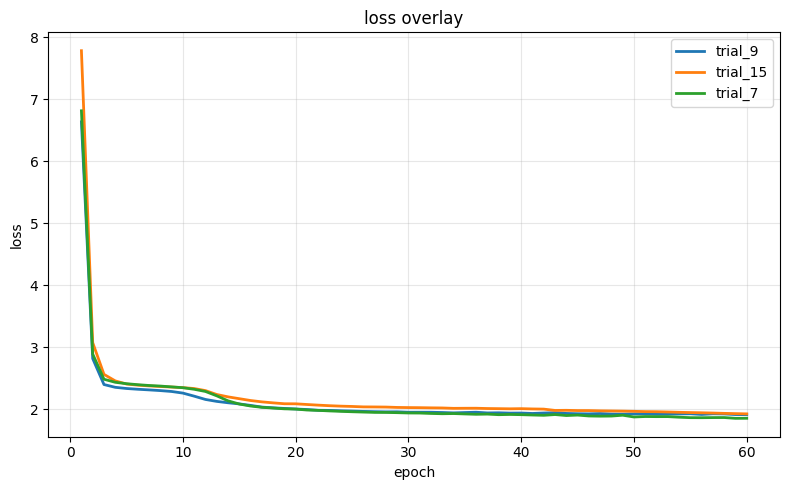

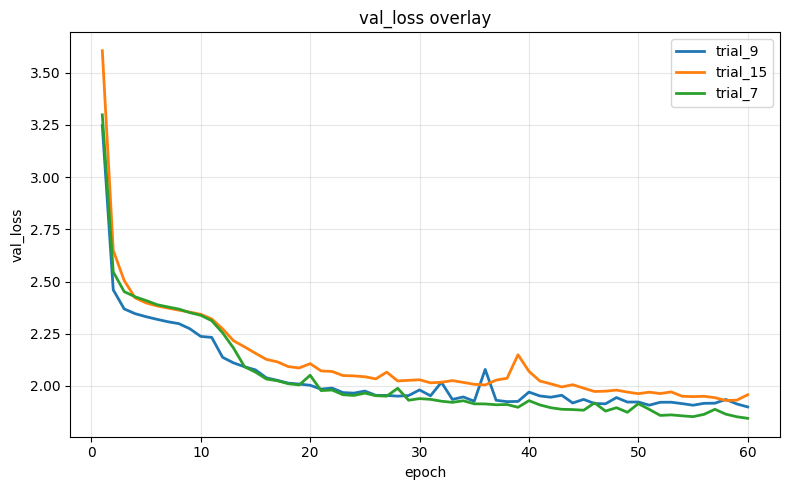

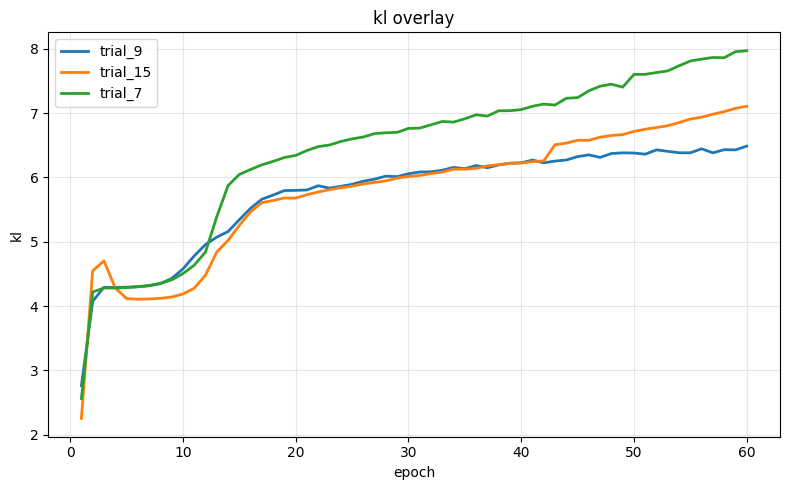

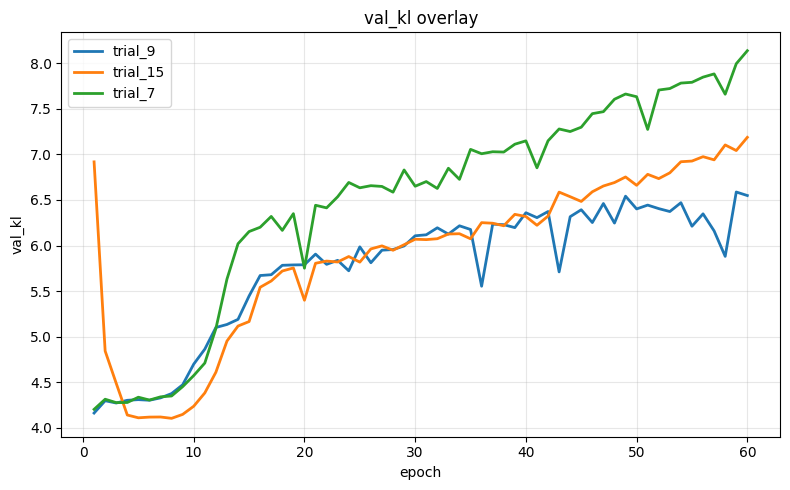

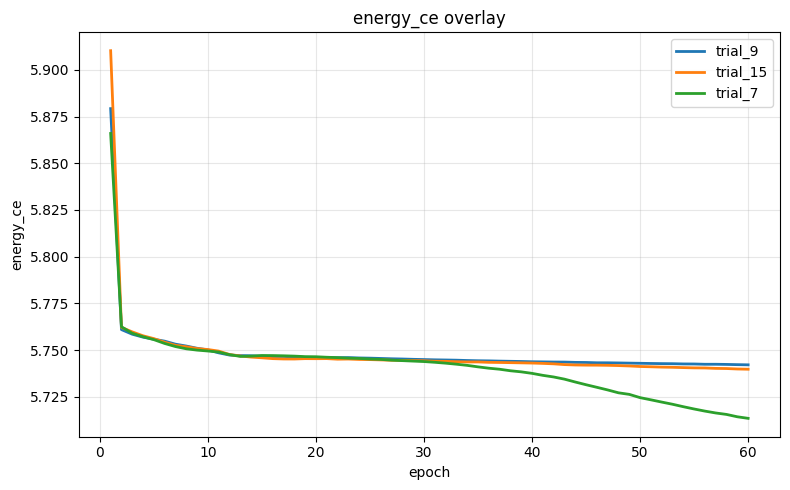

...

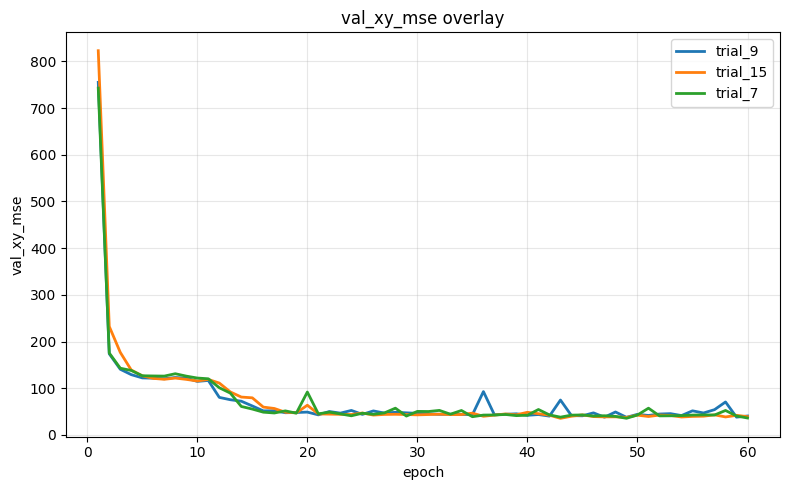

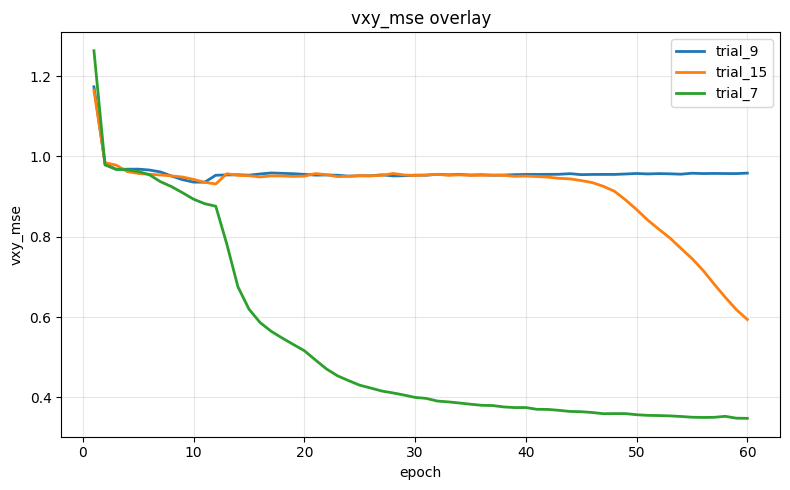

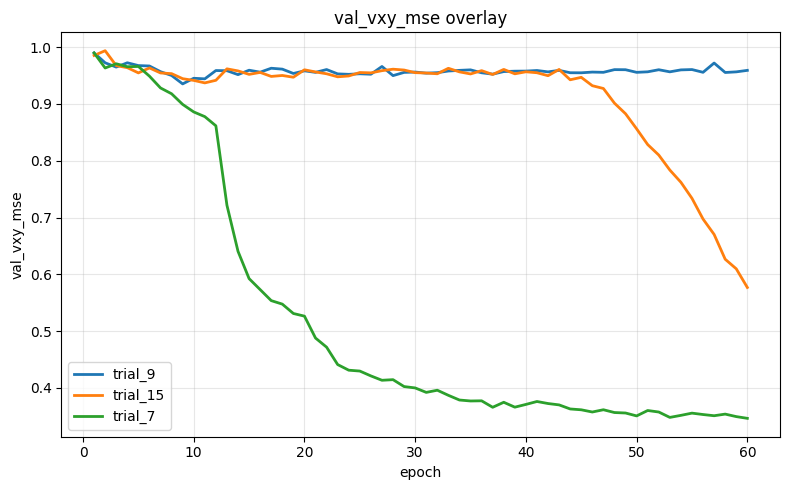

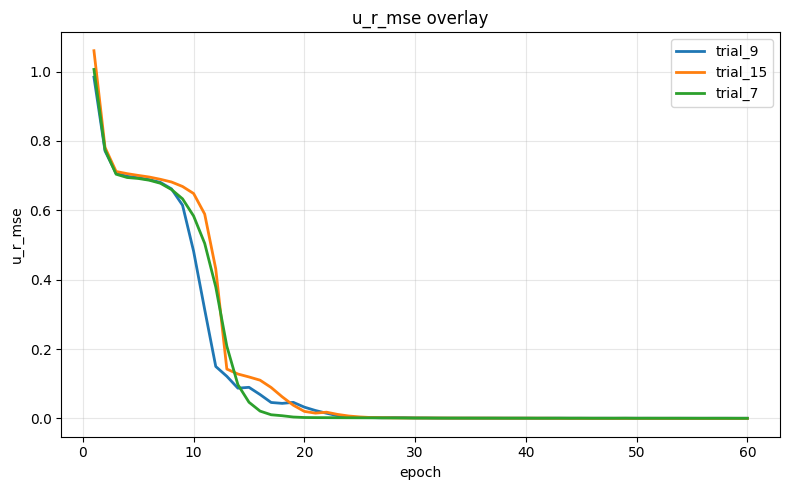

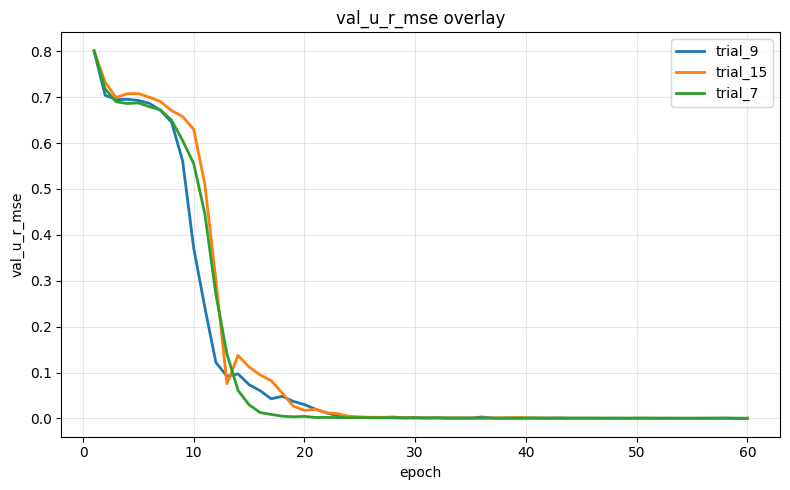

In [185]:
# ==========================================================
# Overlay training histories of the 3 final models - v1.5
# ==========================================================
import matplotlib.pyplot as plt
import numpy as np

def plot_histories_overlay(final_runs, keys=None):

    # ------------------------------------------------------
    # Default keys for v1.5 model
    # ------------------------------------------------------
    if keys is None:
        keys = [
            # Global
            "loss",
            "val_loss",

            # VAE core
            "kl",
            "val_kl",

            # Energy (categorical)
            "energy_ce",
            "val_energy_ce",

            # Radial (Gaussian)
            "sr_nll",
            "val_sr_nll",

            # u_v categorical
            "uv_ce",
            "val_uv_ce",

            # Angular position
            "phi_r_mse",
            "val_phi_r_mse",

            # Angular direction
            "phi_v_mse",
            "val_phi_v_mse",

            # Optional combined angular loss (if present)
            "phi_v_loss",
            "val_phi_v_loss",

            # Geometry
            "xy_mse",
            "val_xy_mse",

            "vxy_mse",
            "val_vxy_mse",

            # Radial auxiliary
            "u_r_mse",
            "val_u_r_mse",
        ]

    model_names = list(final_runs.keys())

    for k in keys:
        found = False
        plt.figure(figsize=(8, 5))

        for model_name in model_names:
            h = final_runs[model_name]["history"].history

            if k in h:
                found = True
                epochs = np.arange(1, len(h[k]) + 1)

                plt.plot(
                    epochs,
                    h[k],
                    linewidth=2,
                    label=model_name
                )

        if not found:
            plt.close()
            continue

        plt.xlabel("epoch")
        plt.ylabel(k)
        plt.title(f"{k} overlay")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()


# Run
plot_histories_overlay(final_runs)

In [186]:
# ==========================================================
# Final evaluation: generate, reconstruct, compute full score - v1.5
# ==========================================================

# ----------------------------------------------------------
# Utility transforms
# ----------------------------------------------------------
def sample_types(n_samples, type_probs, rng=None):
    rng = np.random.default_rng(GLOBAL_SEED) if rng is None else rng
    idx = rng.choice(len(type_probs), size=n_samples, p=type_probs)
    return idx.astype(np.int32)

def one_hot_from_idx(idx, n_types):
    return tf.one_hot(idx, depth=n_types, dtype=tf.float32)

def renorm_cos_sin(c, s, eps=1e-12):
    r = np.sqrt(c * c + s * s) + eps
    return c / r, s / r

# ----------------------------------------------------------
# Reconstruct real test-set physical variables
# ----------------------------------------------------------
def get_real_test_physical():
    return reconstruct_physical_from_real(
        X_cont=X_cont_test,
        E_raw=E_test_raw,
        u_v_raw=u_v_test_raw,
        C=C,
        R=R
    )

REAL_TEST = get_real_test_physical()

# ----------------------------------------------------------
# Generate and reconstruct physical variables for one model
# ----------------------------------------------------------
def generate_physical_from_model(model, ngen, rng=None):
    rng = np.random.default_rng(GLOBAL_SEED) if rng is None else rng

    gen_out = generate_outputs_v15(
        model=model,
        ngen=ngen,
        type_probs=type_probs,
        n_types=n_types,
        energy_bins=energy_bins,
        s_r_mean=s_r_mean,
        s_r_std=s_r_std,
        rng=rng
    )

    gen_phys = reconstruct_physical_from_generated(
        E_gen=gen_out["E"],
        y_cont_gen=gen_out["y_cont"],
        u_v_gen=gen_out["u_v"],
        C=C,
        R=R
    )

    # Attach useful raw generated outputs for later inspection
    gen_phys["type_idx"] = gen_out["type_idx"]
    gen_phys["energy_idx"] = gen_out["energy_idx"]
    gen_phys["uv_idx"] = gen_out["uv_idx"]
    gen_phys["y_cont"] = gen_out["y_cont"]
    gen_phys["E"] = gen_out["E"]

    return gen_phys

# ----------------------------------------------------------
# Spike penalties
# ----------------------------------------------------------
def edge_spike_penalty(real, gen, bins=250, range_=None, edge="left", frac=0.03):
    real_hist, edges = np.histogram(real, bins=bins, range=range_, density=True)
    gen_hist, _ = np.histogram(gen, bins=edges, density=True)

    n_edge = max(1, int(frac * len(real_hist)))

    if edge == "left":
        return float(np.mean(np.maximum(0.0, gen_hist[:n_edge] - real_hist[:n_edge])))
    elif edge == "right":
        return float(np.mean(np.maximum(0.0, gen_hist[-n_edge:] - real_hist[-n_edge:])))
    elif edge == "center":
        mid = len(real_hist) // 2
        half = max(1, n_edge // 2)
        sl = slice(max(0, mid - half), min(len(real_hist), mid + half + 1))
        return float(np.mean(np.maximum(0.0, gen_hist[sl] - real_hist[sl])))
    else:
        raise ValueError("edge must be 'left', 'right', or 'center'")

# ----------------------------------------------------------
# Final score
# ----------------------------------------------------------
def compute_final_score(real_phys, gen_phys, aux_history):
    # Wasserstein distances
    d_logE = wasserstein_distance(real_phys["logE"], gen_phys["logE"])
    d_u_v  = wasserstein_distance(real_phys["u_v"],  gen_phys["u_v"])

    d_x = wasserstein_distance(real_phys["x"], gen_phys["x"])
    d_y = wasserstein_distance(real_phys["y"], gen_phys["y"])
    d_z = wasserstein_distance(real_phys["z"], gen_phys["z"])

    d_vx = wasserstein_distance(real_phys["vx"], gen_phys["vx"])
    d_vy = wasserstein_distance(real_phys["vy"], gen_phys["vy"])
    d_vz = wasserstein_distance(real_phys["vz"], gen_phys["vz"])

    # Spike penalties
    p_uv = edge_spike_penalty(
        real_phys["u_v"], gen_phys["u_v"],
        bins=250, range_=(-1, 1), edge="left", frac=0.03
    )
    p_x = edge_spike_penalty(
        real_phys["x"], gen_phys["x"],
        bins=250, edge="center", frac=0.03
    )
    p_y = edge_spike_penalty(
        real_phys["y"], gen_phys["y"],
        bins=250, edge="center", frac=0.03
    )
    p_z = edge_spike_penalty(
        real_phys["z"], gen_phys["z"],
        bins=250, edge="left", frac=0.03
    )

    # Physics score
    score = (
        1.0 * d_logE +
        1.2 * d_u_v +
        1.5 * d_x +
        1.5 * d_y +
        1.7 * d_z +
        1.0 * d_vx +
        1.0 * d_vy +
        1.0 * d_vz +
        8.0 * p_uv +
        6.0 * p_x +
        6.0 * p_y +
        6.0 * p_z
    )

    # Auxiliary score from final validation metrics
    h = aux_history.history
    best_idx = int(np.argmin(h["val_loss"]))

    aux_score = 0.0

    if "val_vxy_mse" in h:
        aux_score += 0.20 * h["val_vxy_mse"][best_idx]

    if "val_xy_mse" in h:
        aux_score += 0.01 * h["val_xy_mse"][best_idx]

    if "val_u_r_mse" in h:
        aux_score += 0.50 * h["val_u_r_mse"][best_idx]

    if "val_phi_v_loss" in h:
        aux_score += 0.15 * h["val_phi_v_loss"][best_idx]
    elif "val_phi_v_mse" in h:
        aux_score += 0.15 * h["val_phi_v_mse"][best_idx]

    if "val_phi_r_mse" in h:
        aux_score += 0.10 * h["val_phi_r_mse"][best_idx]

    final_score = float(score + aux_score)

    return {
        "d_logE": float(d_logE),
        "d_u_v": float(d_u_v),
        "d_x": float(d_x),
        "d_y": float(d_y),
        "d_z": float(d_z),
        "d_vx": float(d_vx),
        "d_vy": float(d_vy),
        "d_vz": float(d_vz),
        "p_uv": float(p_uv),
        "p_x": float(p_x),
        "p_y": float(p_y),
        "p_z": float(p_z),
        "score": float(score),
        "aux_score": float(aux_score),
        "final_score": float(final_score),
    }

# ----------------------------------------------------------
# Evaluate all 3 final models
# ----------------------------------------------------------
final_eval = {}

for model_name, run in final_runs.items():
    print(f"\nEvaluating {model_name} ...")

    gen_phys = generate_physical_from_model(run["model"], len(X_cont_test))
    score_details = compute_final_score(REAL_TEST, gen_phys, run["history"])

    final_eval[model_name] = {
        "generated": gen_phys,
        "score_details": score_details,
    }

    print(f"{model_name} final_score = {score_details['final_score']:.6f}")
    print(score_details)

# ----------------------------------------------------------
# Save final evaluation
# ----------------------------------------------------------
final_eval_to_save = {}
for model_name, res in final_eval.items():
    final_eval_to_save[model_name] = {
        "score_details": res["score_details"],
        "stage2_score": TOP3_TRIALS[model_name]["score_stage2"],
        "best_val_loss": final_runs[model_name]["best_val_loss"],
        "params": final_runs[model_name]["params"],
    }

eval_path = os.path.join(stage3_dir, "stage3_final_evaluation.json")
with open(eval_path, "w") as f:
    json.dump(final_eval_to_save, f, indent=2)

print("\nSaved final evaluation to:", eval_path)

print("\nRanking by final stage-3 score:")
ranking = sorted(
    [(name, final_eval[name]["score_details"]["final_score"]) for name in final_eval],
    key=lambda x: x[1]
)
for rank, (name, sc) in enumerate(ranking, start=1):
    print(f"Rank {rank}: {name}  score = {sc:.6f}")


Evaluating trial_9 ...
trial_9 final_score = 16.022134
{'d_logE': 0.0014862448371852786, 'd_u_v': 0.00706776246729504, 'd_x': 1.6647960350041782, 'd_y': 1.7088095561955834, 'd_z': 5.953739212854911, 'd_vx': 0.018663427914722648, 'd_vy': 0.022260708979878842, 'd_vz': 0.00706776246729504, 'p_uv': 0.0, 'p_x': 0.0010222648905592994, 'p_y': 0.0004977210812738, 'p_z': 0.0, 'score': 15.248844423643826, 'aux_score': 0.7732895484153414, 'final_score': 16.022133972059166}

Evaluating trial_15 ...
trial_15 final_score = 15.648181
{'d_logE': 0.001825628748634489, 'd_u_v': 0.01309863512737243, 'd_x': 2.275425623610916, 'd_y': 2.5175878094268915, 'd_z': 4.534727723770176, 'd_vx': 0.02833874550293486, 'd_vy': 0.05723048049544788, 'd_vz': 0.01309863512737243, 'p_uv': 0.0, 'p_x': 0.0001992824172068782, 'p_y': 0.0008452551920397646, 'p_z': 0.0, 'score': 15.021036357648729, 'aux_score': 0.6271446691185703, 'final_score': 15.648181026767299}

Evaluating trial_7 ...
trial_7 final_score = 16.317982
{'d_log

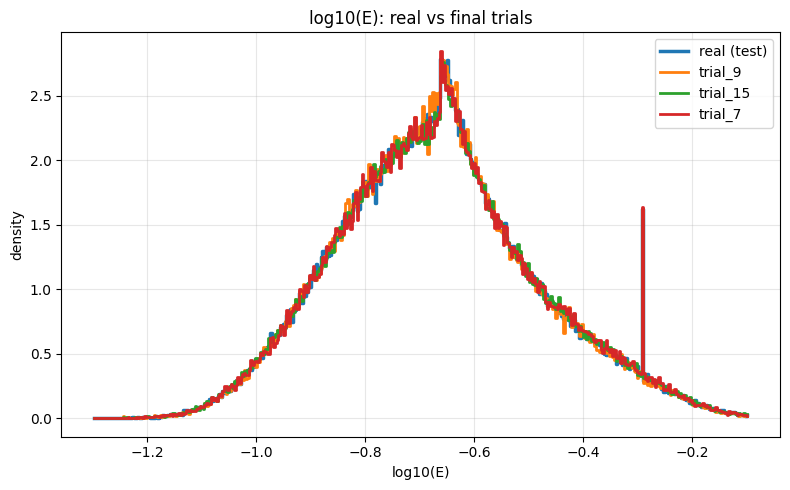

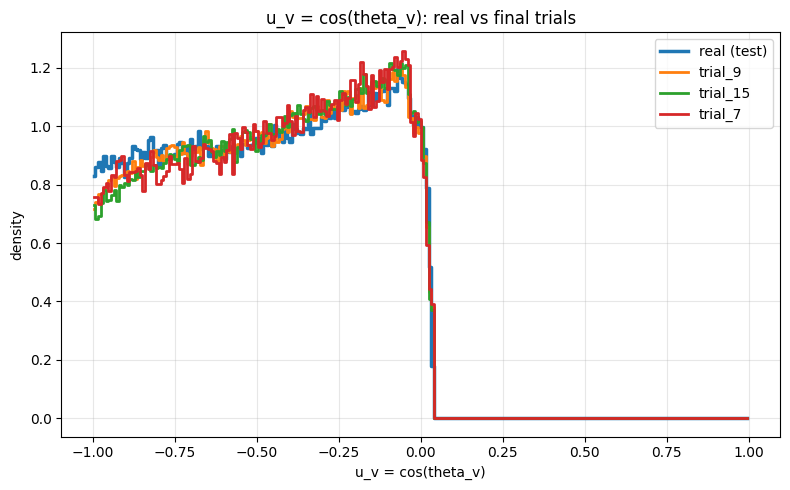

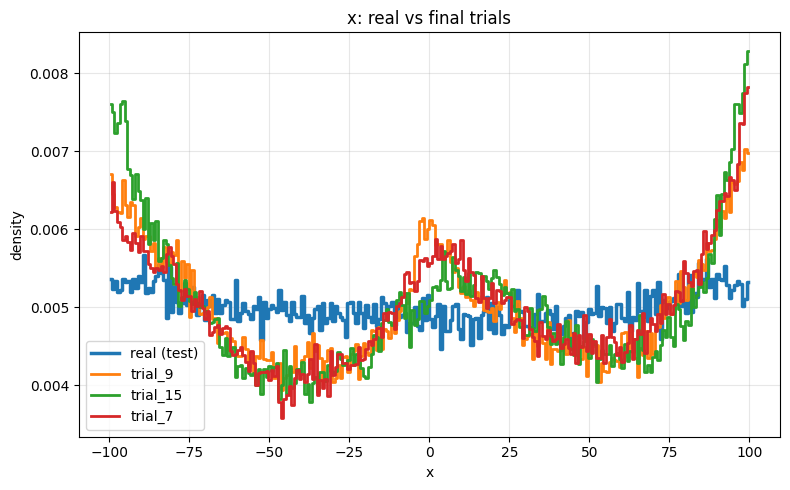

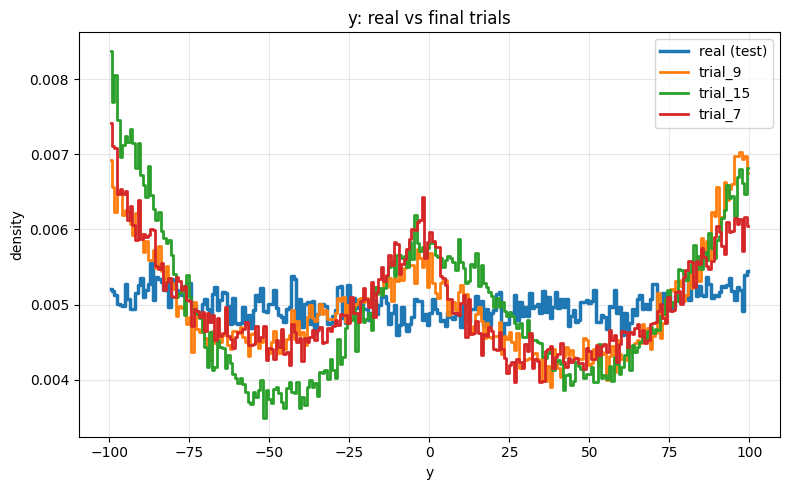

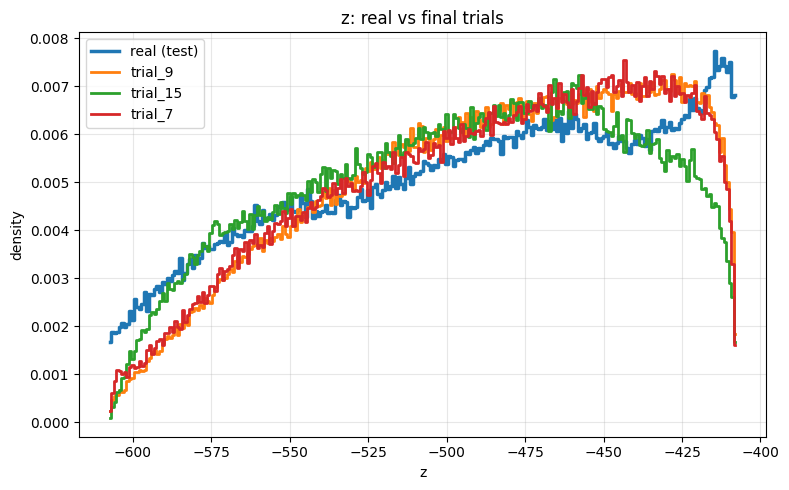

...

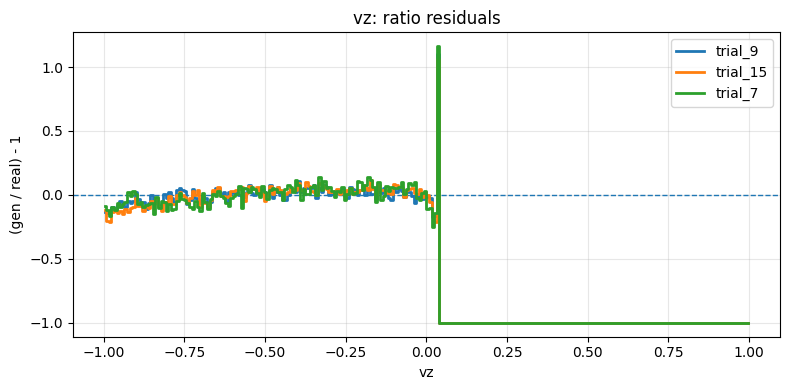

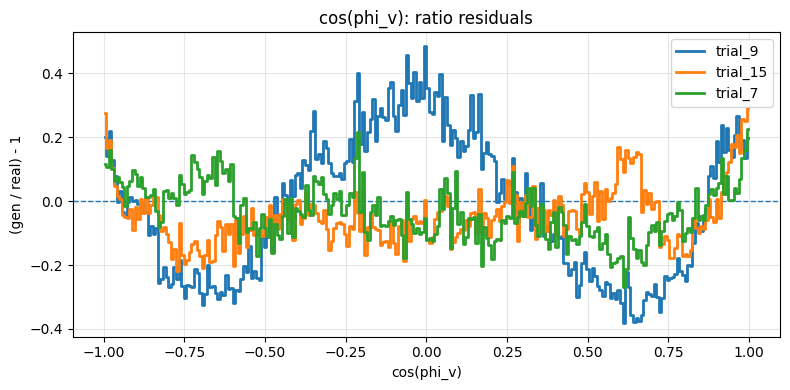

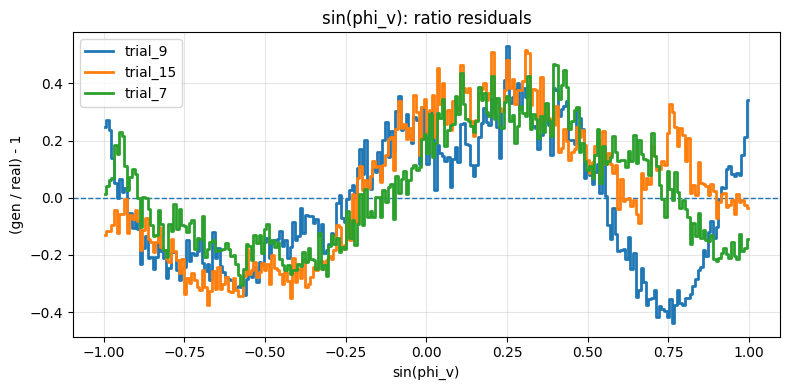

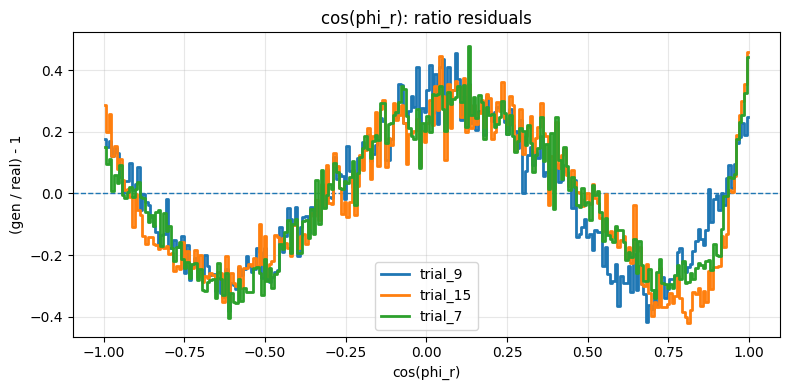

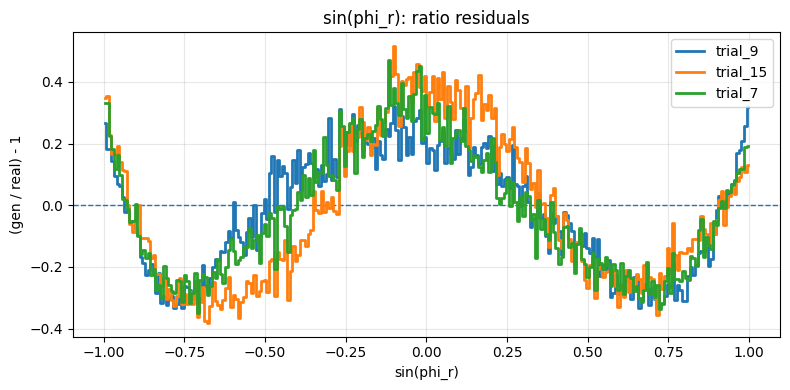

In [187]:
# ==========================================================
# Overlay plots: real vs all 3 final trials - v1.5
# ==========================================================

def overlay_hist_real_vs_trials(
    real,
    trial_dict,
    name,
    bins=200,
    range_=None,
    density=True
):
    plt.figure(figsize=(8, 5))

    # Real data
    hist_real, edges = np.histogram(real, bins=bins, range=range_, density=density)
    centers = 0.5 * (edges[:-1] + edges[1:])
    plt.step(centers, hist_real, where="mid", linewidth=2.5, label="real (test)")

    # Trial data
    for model_name, arr in trial_dict.items():
        hist_gen, _ = np.histogram(arr, bins=edges, density=density)
        plt.step(centers, hist_gen, where="mid", linewidth=2, label=model_name)

    plt.xlabel(name)
    plt.ylabel("density")
    plt.title(f"{name}: real vs final trials")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


def overlay_ratio_minus_one(
    real,
    trial_dict,
    name,
    bins=200,
    range_=None,
    eps=1e-12
):
    hist_real, edges = np.histogram(real, bins=bins, range=range_, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])

    plt.figure(figsize=(8, 4))
    plt.axhline(0.0, linestyle="--", linewidth=1)

    for model_name, arr in trial_dict.items():
        hist_gen, _ = np.histogram(arr, bins=edges, density=True)
        ratio_m1 = hist_gen / np.maximum(hist_real, eps) - 1.0
        plt.step(centers, ratio_m1, where="mid", linewidth=2, label=model_name)

    plt.xlabel(name)
    plt.ylabel("(gen / real) - 1")
    plt.title(f"{name}: ratio residuals")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# ----------------------------------------------------------
# Prepare generated variables by trial
# ----------------------------------------------------------
trial_vars = {}
for model_name, res in final_eval.items():
    trial_vars[model_name] = res["generated"]

# ----------------------------------------------------------
# Variable list to compare
# ----------------------------------------------------------
vars_to_plot = [
    ("logE",   "log10(E)",        None,    400),
    ("u_v",    "u_v = cos(theta_v)", (-1, 1), 250),

    ("x",      "x",               None,    250),
    ("y",      "y",               None,    250),
    ("z",      "z",               None,    250),

    ("vx",     "vx",              (-1, 1), 250),
    ("vy",     "vy",              (-1, 1), 250),
    ("vz",     "vz",              (-1, 1), 250),

    # Very useful for diagnosing phi_v behavior directly
    ("cphi_v", "cos(phi_v)",      (-1, 1), 250),
    ("sphi_v", "sin(phi_v)",      (-1, 1), 250),

    # Optional: also inspect position angle branch directly
    ("cphi_r", "cos(phi_r)",      (-1, 1), 250),
    ("sphi_r", "sin(phi_r)",      (-1, 1), 250),
]

# ----------------------------------------------------------
# Main overlay plots
# ----------------------------------------------------------
for key, label, range_, bins in vars_to_plot:
    overlay_hist_real_vs_trials(
        real=REAL_TEST[key],
        trial_dict={name: trial_vars[name][key] for name in trial_vars},
        name=label,
        bins=bins,
        range_=range_,
    )

# ----------------------------------------------------------
# Residual ratio plots
# ----------------------------------------------------------
for key, label, range_, bins in vars_to_plot:
    overlay_ratio_minus_one(
        real=REAL_TEST[key],
        trial_dict={name: trial_vars[name][key] for name in trial_vars},
        name=label,
        bins=bins,
        range_=range_,
    )

In [188]:
# ==========================================================
# Compact final comparison table - v1.5
# ==========================================================

rows = []
for model_name in final_runs:
    rows.append({
        "model": model_name,
        "stage2_score": TOP3_TRIALS[model_name]["score_stage2"],
        "stage3_score": final_eval[model_name]["score_details"]["final_score"],
        "best_val_loss": final_runs[model_name]["best_val_loss"],
        "epochs_ran": final_runs[model_name]["n_epochs_ran"],
        "train_time_sec": final_runs[model_name]["train_time_sec"],

        # Physics distances
        "d_logE": final_eval[model_name]["score_details"]["d_logE"],
        "d_u_v": final_eval[model_name]["score_details"]["d_u_v"],
        "d_x": final_eval[model_name]["score_details"]["d_x"],
        "d_y": final_eval[model_name]["score_details"]["d_y"],
        "d_z": final_eval[model_name]["score_details"]["d_z"],
        "d_vx": final_eval[model_name]["score_details"]["d_vx"],
        "d_vy": final_eval[model_name]["score_details"]["d_vy"],
        "d_vz": final_eval[model_name]["score_details"]["d_vz"],

        # Spike penalties
        "p_uv": final_eval[model_name]["score_details"]["p_uv"],
        "p_x": final_eval[model_name]["score_details"]["p_x"],
        "p_y": final_eval[model_name]["score_details"]["p_y"],
        "p_z": final_eval[model_name]["score_details"]["p_z"],
    })

df_stage3_compare = (
    pd.DataFrame(rows)
    .sort_values("stage3_score")
    .reset_index(drop=True)
)

display(df_stage3_compare)

,model,stage2_score,stage3_score,best_val_loss,epochs_ran,train_time_sec,d_logE,d_u_v,d_x,d_y,d_z,d_vx,d_vy,d_vz,p_uv,p_x,p_y,p_z
0,trial_15,8.612839,15.648181,1.930398,60,1694.975721,0.001826,0.013099,2.275426,2.517588,4.534728,0.028339,0.057230,0.013099,0.0,0.000199,0.000845,0.0
1,trial_9,8.242554,16.022134,1.899671,60,1491.550138,0.001486,0.007068,1.664796,1.708810,5.953739,0.018663,0.022261,0.007068,0.0,0.001022,0.000498,0.0
2,trial_7,9.098956,16.317982,1.845123,60,1781.813539,0.001566,0.012144,2.518846,1.927844,5.320599,0.024820,0.034241,0.012144,0.0,0.000689,0.001006,0.0


#### OLD TRAINING

Here below are the cells used in single training which can be later used for fine tuning.

In [148]:
# ==========================================================
# Instantiate the new model and run a first single training
# ==========================================================

n_types = int(cond_train.shape[1])

model = CVAE_CatEnergy_CatUV(
    n_types=n_types,
    n_energy_bins=n_energy_bins,
    n_uv_bins=U_V_NBINS_EFF,
    uv_bin_edges=u_v_bins,

    latent_dim=8, # we can start with a smaller latent space for a quick test (latent_dim=12 is overkill)
    hidden=(128, 128, 64, 64, 64), # previous version had (128, 128, 64, 64, 64) but we can start with fewer layers for a quick test
    beta=0.1,
    type_weights=type_weights,

    # Gaussian head control (only for s_r now)
    min_log_sigma=-6.0,
    max_log_sigma=1.5,

    # Regularization
    lambda_sigma=2e-3,
    sigma_target=-2.5,
    lambda_phi=2e-2, # brought back from 3e-2 to 2e-2 to balance with the new categorical heads and prevent it from dominating the early training
    lambda_phi_r=2e-2,

    # Reconstruction weights
    w_energy=0.8,   # categorical energy head, reduced from 1.0 to 0.8 to allow more focus on other variables
    w_sr=1.1,       # Gaussian s_r head
    w_uv=1.1,       # categorical u_v head, reduced from 1.2 to 1.1 to balance with the energy head and encourage better overall learning of the direction distribution
    w_phi_r=1.4,    # position angular head
    w_phi_v=1.1,    # direction angular head
    w_ur = 0.01,

    # Geometric losses
    w_xy=0.005, # reduced from 0.01 to prevent it from dominating the early training before the model has learned a reasonable position representation
    w_vxy = 0.025, # new weight for the velocity xy-loss, added to encourage learning the correct direction distribution in the xy-plane which is crucial for the physics score and can be challenging for the model to capture with only the angular losses

    phi_v_ang_weight = 1.0,
    phi_v_mse_weight = 0.6,

    # Sphere geometry used in xy-loss
    sphere_R=R,

    # New controls for u_v categorical modeling
    sample_uv_uniform_inside_bin=True,
)

model.compile(
    optimizer=keras.optimizers.Adam(2e-4)
)


callbacks = [
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=8,
        restore_best_weights=True,
        verbose=1
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=6,
        min_lr=1e-5,
        verbose=1
    ),
]

In [149]:

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=60,
    callbacks=callbacks,
    verbose=1
)


Epoch 1/60


320/320 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - energy_ce: 5.8981 - kl: 2.8054 - loss: 6.5741 - nll: 39.0444 - phi_r_mse: 0.8772 - phi_r_reg: 0.0196 - phi_reg: 0.0197 - phi_v_ang: 0.7952 - phi_v_loss: 1.7495 - phi_v_mse: 1.5904 - rec: 6.2380 - sigma_reg: 0.0161 - sr_nll: 1.0287 - u_r_mse: 0.9084 - uv_ce: 4.8521 - vxy_mse: 1.1481 - xy_mse: 4933.3711 - val_energy_ce: 5.7649 - val_kl: 4.5793 - val_loss: 3.3511 - val_nll: 17.7233 - val_phi_r_mse: 0.7141 - val_phi_r_reg: 0.0190 - val_phi_reg: 0.0195 - val_phi_v_ang: 0.6988 - val_phi_v_loss: 1.5373 - val_phi_v_mse: 1.3975 - val_rec: 2.8397 - val_sigma_reg: 0.0150 - val_sr_nll: 0.7395 - val_u_r_mse: 0.8098 - val_uv_ce: 4.8520 - val_vxy_mse: 0.9848 - val_xy_mse: 847.4396 - learning_rate: 2.0000e-04
Epoch 2/60
320/320 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - energy_ce: 5.7624 - kl: 3.9719 - loss: 3.1061 - nll: 16.7118 - phi_r_mse: 0.2874 - phi_r_reg: 0.0092 - phi_reg: 0.0119 - phi_v_ang: 0.6983 - phi_v_loss: 1.5362 - phi_v_mse: 1.3965 - rec: 2.6730 - 


Available history keys:
['energy_ce', 'kl', 'loss', 'nll', 'phi_r_mse', 'phi_r_reg', 'phi_reg', 'phi_v_ang', 'phi_v_loss', 'phi_v_mse', 'rec', 'sigma_reg', 'sr_nll', 'u_r_mse', 'uv_ce', 'val_energy_ce', 'val_kl', 'val_loss', 'val_nll', 'val_phi_r_mse', 'val_phi_r_reg', 'val_phi_reg', 'val_phi_v_ang', 'val_phi_v_loss', 'val_phi_v_mse', 'val_rec', 'val_sigma_reg', 'val_sr_nll', 'val_u_r_mse', 'val_uv_ce', 'val_vxy_mse', 'val_xy_mse', 'vxy_mse', 'xy_mse', 'learning_rate']


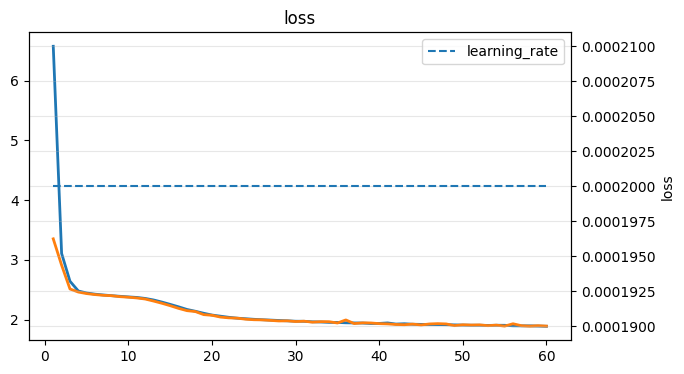

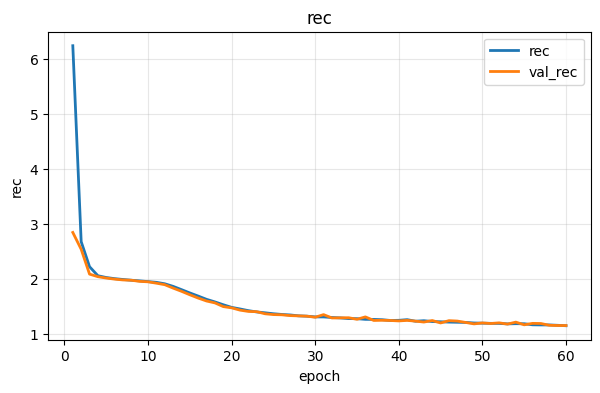

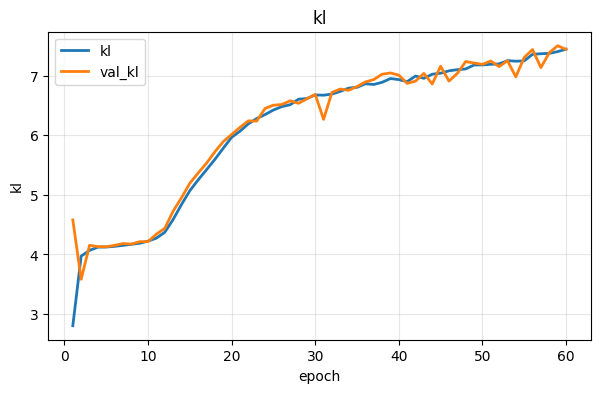

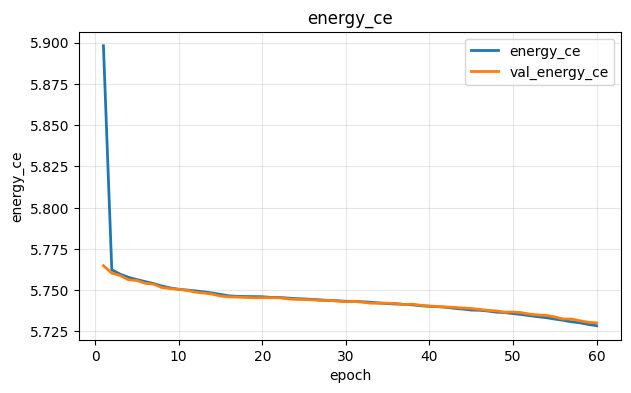

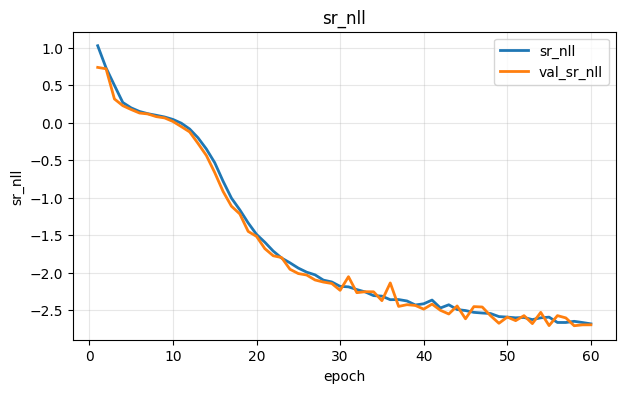

...

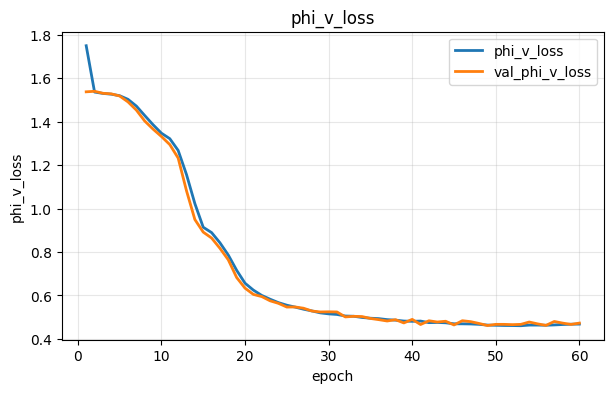

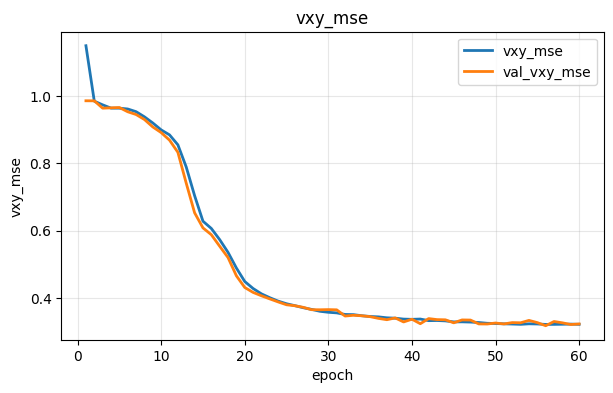

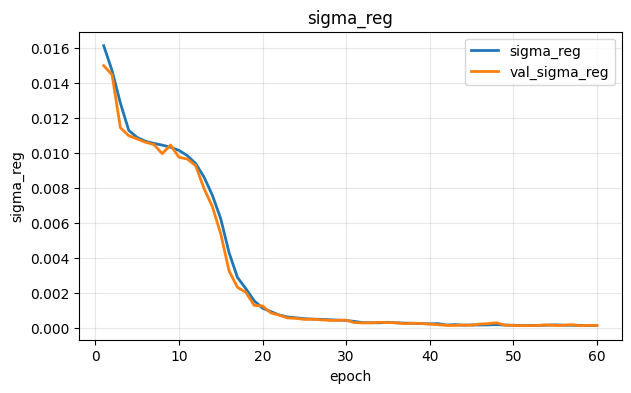

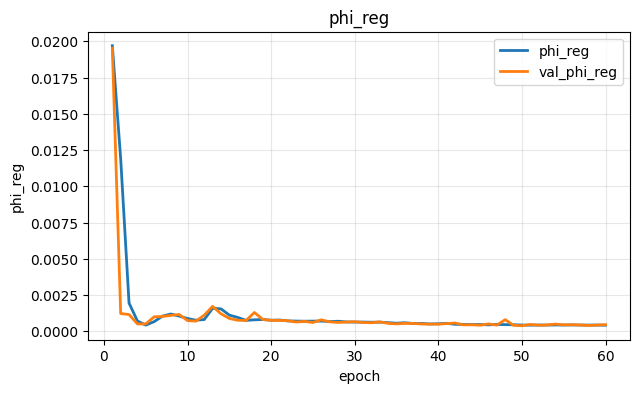

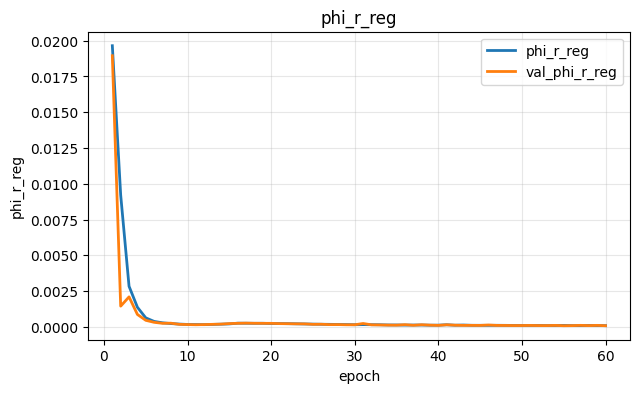

In [150]:
def plot_history(history, keys=None, show_available=True):
    h = history.history

    if show_available:
        print("\nAvailable history keys:")
        print(list(h.keys()))

    # ==========================================================
    # Default metrics for CVAE_CatEnergy_CatUV
    # Updated for:
    # - phi_v angular loss
    # - combined phi_v loss
    # - reconstructed directional Cartesian loss (vx, vy)
    # ==========================================================
    if keys is None:
        keys = [
            "loss",
            "rec",
            "kl",

            # energy
            "energy_ce",

            # position
            "sr_nll",
            "phi_r_mse",
            "xy_mse",
            "u_r_mse",

            # direction
            "uv_ce",
            "phi_v_mse",
            "phi_v_ang",
            "phi_v_loss",
            "vxy_mse",

            # regularizers
            "sigma_reg",
            "phi_reg",
            "phi_r_reg",
        ]

    # ==========================================================
    # Number of epochs
    # ==========================================================
    if "loss" in h:
        n_ep = len(h["loss"])
    else:
        n_ep = len(next(iter(h.values())))

    epochs = np.arange(1, n_ep + 1)
    has_lr = ("learning_rate" in h)

    # ==========================================================
    # Plotting
    # ==========================================================
    for k in keys:

        if k not in h:
            continue

        plt.figure(figsize=(7, 4))

        plt.plot(
            epochs,
            h[k],
            label=k,
            linewidth=2
        )

        val_k = "val_" + k
        if val_k in h:
            plt.plot(
                epochs,
                h[val_k],
                label=val_k,
                linewidth=2
            )

        # Show learning rate only on the loss plot
        if k == "loss" and has_lr:
            ax1 = plt.gca()
            ax2 = ax1.twinx()

            ax2.plot(
                epochs,
                h["learning_rate"],
                linestyle="--",
                label="learning_rate"
            )

            ax2.set_ylabel("learning_rate")
            ax2.legend(loc="upper right")

        plt.xlabel("epoch")
        plt.ylabel(k)
        plt.title(k)
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()


# ==========================================================
# Standard usage
# ==========================================================
plot_history(history)

## Training with GEEANNT Package

### Model v 0.6.0 CVAE_CatEnergy_CatUV without adaptive training

In [ ]:
# Optional but recommended
ge.initialize_environment(seed=42, cpu_only=True, quiet=True)

n_types = int(cond_train.shape[1])

model = ge.CVAE_CatEnergy_CatUV(
    n_types=n_types,
    n_energy_bins=n_energy_bins,
    n_uv_bins=U_V_NBINS_EFF,
    uv_bin_edges=u_v_bins,

    latent_dim=8,
    hidden=(128, 128, 64, 64, 64),
    beta=0.1,
    type_weights=type_weights,

    min_log_sigma=-6.0,
    max_log_sigma=1.5,

    lambda_sigma=2e-3,
    sigma_target=-2.5,
    lambda_phi=2e-2,
    lambda_phi_r=2e-2,

    w_energy=0.8,
    w_sr=1.1,
    w_uv=1.1,
    w_phi_r=1.4,
    w_phi_v=1.1,
    w_ur=0.01,

    w_xy=0.005,
    w_vxy=0.025,

    phi_v_ang_weight=1.0,
    phi_v_mse_weight=0.6,

    sphere_R=R,
    sample_uv_uniform_inside_bin=True,
)

ge.compile_model(model, learning_rate=2e-4)

callbacks = ge.build_default_callbacks(
    monitor="val_loss",
    early_patience=8,
    lr_patience=6,
    factor=0.5,
    min_lr=1e-5,
    verbose=1,
)

ge.print_model_structure(model)


===== GEEANNT MODEL STRUCTURE =====
latent_dim = 8
n_types = 2
n_energy_bins = 512
n_uv_bins = 128

--- Encoder ---


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 647)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_28 (Dense)    │ (None, 128)       │     82,944 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_26      │ (None, 128)       │          0 │ dense_28[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_29 (Dense)    │ (None, 128)       │     16,512 │ leaky_re_lu_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_27      │ (None, 128)       │          0 │ dense_29[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_30 (Dense)    │ (None, 64)        │      8,256 │ leaky_re_lu_27[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_28      │ (None, 64)        │          0 │ dense_30[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_31 (Dense)    │ (None, 64)        │      4,160 │ leaky_re_lu_28[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_29      │ (None, 64)        │          0 │ dense_31[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 64)        │      4,160 │ leaky_re_lu_29[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_30      │ (None, 64)        │          0 │ dense_32[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 8)         │        520 │ leaky_re_lu_30[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_logvar (Dense)    │ (None, 8)         │        520 │ leaky_re_lu_30[0… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 117,072 (457.31 KB)

 Trainable params: 117,072 (457.31 KB)

 Non-trainable params: 0 (0.00 B)


--- Shared decoder backbone ---


Model: "decoder_backbone"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 128)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,856 (132.25 KB)

 Trainable params: 33,856 (132.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Energy branch ---


Model: "energy_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_38 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- Position branch ---


Model: "position_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- Direction branch ---


Model: "direction_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_43 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- s_r head ---


Model: "sr_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_46 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- u_v head ---


Model: "uv_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- phi_r head ---


Model: "phi_r_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_50 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- phi_v head ---


Model: "phi_v_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_53 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = ge.fit_model(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=60,
    callbacks=callbacks,
    verbose=1,
)

Epoch 1/80
320/320 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - energy_ce: 5.7508 - kl: 4.6937 - loss: 2.2800 - nll: 11.3190 - phi_r_mse: 0.0245 - phi_r_reg: 2.8249e-04 - phi_reg: 7.5220e-04 - phi_v_ang: 0.2413 - phi_v_loss: 0.5309 - phi_v_mse: 0.4827 - rec: 1.7991 - sigma_reg: 0.0106 - sr_nll: 0.1309 - u_r_mse: 0.6792 - uv_ce: 4.7774 - vxy_mse: 0.3733 - xy_mse: 136.9374 - val_energy_ce: 5.7504 - val_kl: 4.7233 - val_loss: 2.2778 - val_nll: 11.2807 - val_phi_r_mse: 0.0240 - val_phi_r_reg: 2.5225e-04 - val_phi_reg: 7.1709e-04 - val_phi_v_ang: 0.2338 - val_phi_v_loss: 0.5144 - val_phi_v_mse: 0.4676 - val_rec: 1.7940 - val_sigma_reg: 0.0104 - val_sr_nll: 0.1193 - val_u_r_mse: 0.6694 - val_uv_ce: 4.7747 - val_vxy_mse: 0.3633 - val_xy_mse: 136.3648 - learning_rate: 2.0000e-04
Epoch 2/80
320/320 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step - energy_ce: 5.7504 - kl: 4.7177 - loss: 2.2705 - nll: 11.2497 - phi_r_mse: 0.0237 - phi_r_reg: 2.3863e-04 - phi_reg: 6.4940e-04 - phi_v_ang: 0.2317 - phi_v_loss: 0.5098 


Available history keys:
['energy_ce', 'kl', 'loss', 'nll', 'phi_r_mse', 'phi_r_reg', 'phi_reg', 'phi_v_ang', 'phi_v_loss', 'phi_v_mse', 'rec', 'sigma_reg', 'sr_nll', 'u_r_mse', 'uv_ce', 'val_energy_ce', 'val_kl', 'val_loss', 'val_nll', 'val_phi_r_mse', 'val_phi_r_reg', 'val_phi_reg', 'val_phi_v_ang', 'val_phi_v_loss', 'val_phi_v_mse', 'val_rec', 'val_sigma_reg', 'val_sr_nll', 'val_u_r_mse', 'val_uv_ce', 'val_vxy_mse', 'val_xy_mse', 'vxy_mse', 'xy_mse', 'learning_rate']


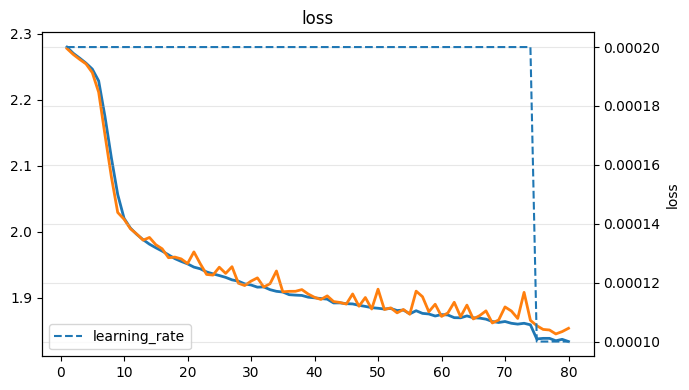

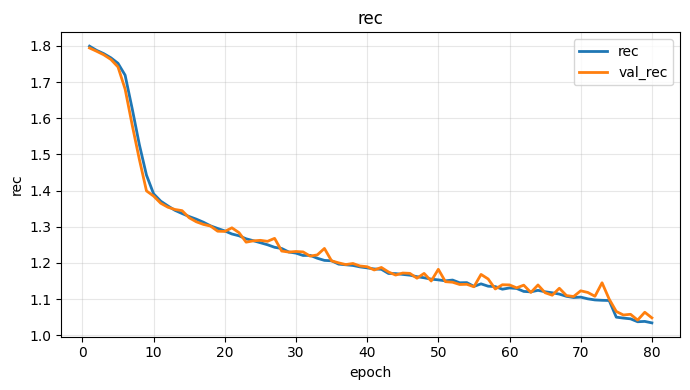

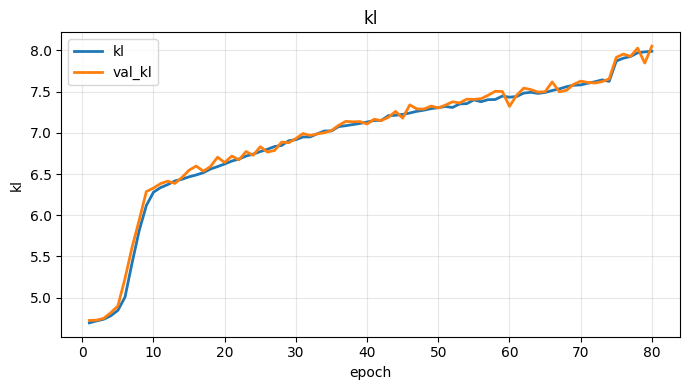

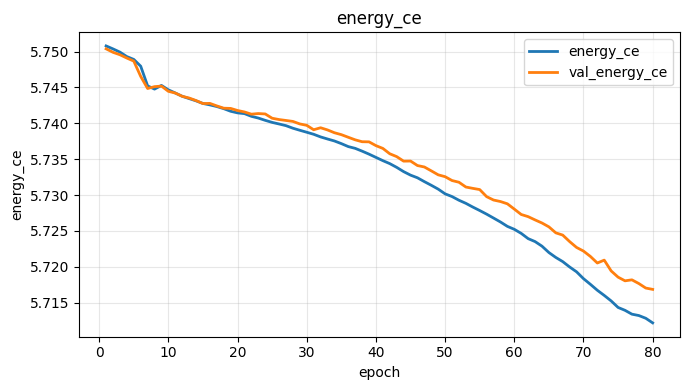

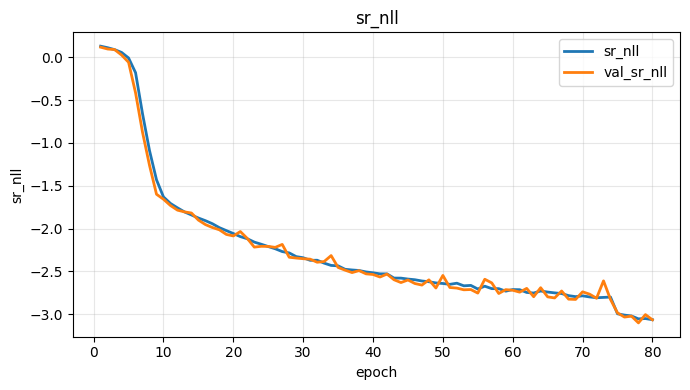

...

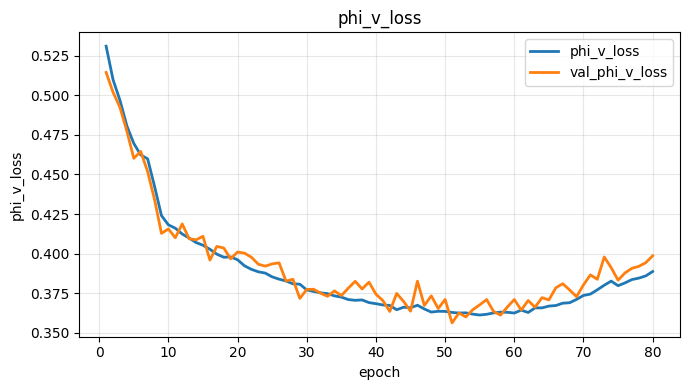

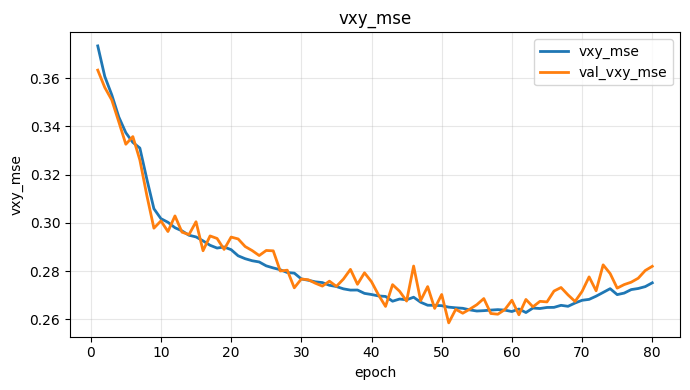

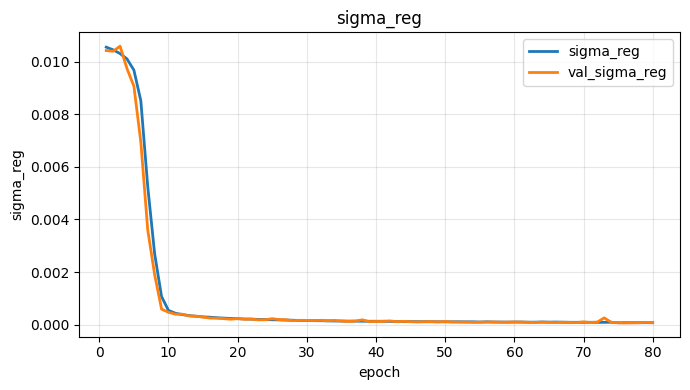

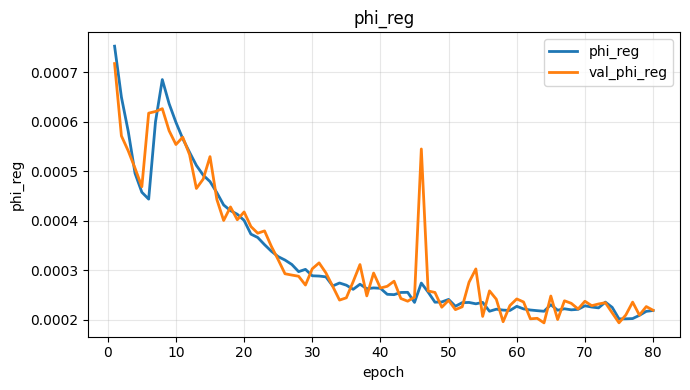

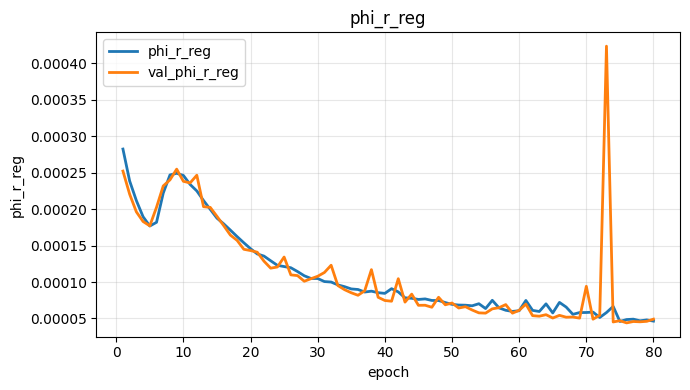

In [18]:
ge.plot_history(history)

### Model v 0.6.1 CVAE_CatEnergy_CatUV_TaskAdaptive

In [12]:
# ==========================================================
# Configuration for later saving and reference
# ==========================================================


model_config = {
    "model_class": "CVAE_CatEnergy_CatUV_TaskAdaptive",
    "n_types": n_types,
    "n_energy_bins": n_energy_bins,
    "n_uv_bins": U_V_NBINS_EFF,
    "latent_dim": 8,
    "hidden": [128, 128, 64, 64, 64],
    "beta": 0.1,
    "w_energy": 0.8,
    "w_sr": 1.1,
    "w_uv": 1.1,
    "w_phi_r": 1.4,
    "w_phi_v": 1.1,
    "w_xy": 0.005,
    "w_vxy": 0.025,
    "w_ur": 0.01,
    "sphere_R": R,
}

preprocessing_metadata = {
    "s_r_mean": s_r_mean,
    "s_r_std": s_r_std,
    "energy_bins": energy_bins,
    "u_v_bins": u_v_bins,
    "u_v_centers": u_v_centers,
    "type_probs": type_probs,
    "idx_to_type": idx_to_type,
    "n_types": n_types,
    "energy_binning_mode": feature_pack["energy_config"]["mode"],
}


In [16]:
# Optional but recommended
ge.initialize_environment(seed=42, cpu_only=True, quiet=True)

n_types = int(cond_train.shape[1])

model = ge.CVAE_CatEnergy_CatUV_TaskAdaptive(
    n_types=n_types,
    n_energy_bins=n_energy_bins,
    n_uv_bins=U_V_NBINS_EFF,
    uv_bin_edges=u_v_bins,

    latent_dim=model_config["latent_dim"],
    hidden=model_config["hidden"],
    beta=model_config["beta"],
    type_weights=type_weights,

    min_log_sigma=-6.0,
    max_log_sigma=1.5,

    lambda_sigma=2e-3,
    sigma_target=-2.5,
    lambda_phi=2e-2,
    lambda_phi_r=2e-2,

    w_energy=model_config["w_energy"],
    w_sr=model_config["w_sr"],
    w_uv=model_config["w_uv"],
    w_phi_r=model_config["w_phi_r"],
    w_phi_v=model_config["w_phi_v"],
    w_ur=model_config["w_ur"],

    w_xy=model_config["w_xy"],
    w_vxy=model_config["w_vxy"],

    phi_v_ang_weight=1.0,
    phi_v_mse_weight=0.6,

    sphere_R=R,
    sample_uv_uniform_inside_bin=True,
)

ge.compile_model(model, learning_rate=2e-4)

#! Adaptive Callback Configuration

energy_dist_cb = ge.ValidationEnergyDistributionMonitor(
    E_val_raw=E_val_raw,
    energy_bins=energy_bins,
    type_probs=type_probs,
    n_types=n_types,
    n_samples=n_energy_bins * 1000, # large number of samples for stable distribution estimation
    energy_mode="uniform",
    min_real_count=250,
    seed=42,
    every_n_epochs=1,
    verbose=1,
)

adaptive_cb = ge.TaskAdaptiveLossScheduler(
    task_configs={
        "energy": {
            "monitor": "val_energy_quality_score",
            "threshold": 1,
            "patience": 5,
            "min_delta": 0.005,
            "decay_factor": 0.8,
            "min_weight": 0.05,
            "cooldown": 1,
        }
    },
    verbose=1,
)

monitor_cb = ge.TaskAdaptiveTrainingMonitor(
    scheduler=adaptive_cb,
    metrics_to_show=[
        "loss",
        "val_loss",

        "energy_ce",
        "val_energy_ce",
        "val_energy_mean_rel_err",
        "val_energy_max_rel_err",
        "val_energy_p90_rel_err",
        "val_energy_quality_score",
        "val_energy_wdist",

        "uv_ce",
        "val_uv_ce",
        "phi_v_loss",
        "val_phi_v_loss",
        "xy_mse",
        "val_xy_mse",
        "vxy_mse",
        "val_vxy_mse",
    ],
    show_task_weights=True,
    show_scheduler_state=True,
    every_n_epochs=1,
)

callbacks = ge.build_default_callbacks(
    monitor="val_loss",
    early_patience=8,
    lr_patience=6,
    factor=0.5,
    min_lr=1e-5,
    verbose=1,
)

callbacks.append(energy_dist_cb)
callbacks.append(adaptive_cb)
callbacks.append(monitor_cb)


# DUMMY BUILD FOR STRUCTURE INSPECTION
dummy_z = tf.zeros((1, model.latent_dim), dtype=tf.float32)
dummy_cond = tf.zeros((1, n_types), dtype=tf.float32)
_ = model.decode(dummy_z, dummy_cond)

ge.print_model_tree_with_params(model)
#ge.print_model_structure(model)
ge.print_duplicate_trainable_variables(model)


===== GEEANNT MODEL TREE (WITH PARAMS) =====
CVAE_CatEnergy_CatUV_TaskAdaptive
│
├── Encoder [trainable] (total=84304, trainable=84304, non_trainable=0)
│   ├── input: [y_cont, E_onehot, uv_onehot, cond]
│   ├── z_mean
│   └── z_logvar
│
├── Decoder stem [trainable] (total=704, trainable=704, non_trainable=0)
│   └── light shared representation
│
├── Energy branch (short path) [trainable] (total=5472, trainable=5472, non_trainable=0)
│   └── energy_logits_head [trainable] (total=12544, trainable=12544, non_trainable=0)
│
├── Decoder deep trunk [trainable] (total=33088, trainable=33088, non_trainable=0)
│   └── deep shared representation
│   ├── Position branch [trainable] (total=33088, trainable=33088, non_trainable=0)
│   │   ├── sr_head [trainable] (total=16576, trainable=16576, non_trainable=0)
│   │   │   ├── sr_mu_head [trainable] (total=65, trainable=65, non_trainable=0)
│   │   │   └── sr_logsigma_head [trainable] (total=65, trainable=65, non_trainable=0)
│   │   └── phi_r_head

In [14]:
ge.print_model_structure(model)


===== GEEANNT MODEL STRUCTURE =====
Model class   = CVAE_CatEnergy_CatUV_TaskAdaptive
latent_dim    = 8
n_types       = 2
n_energy_bins = 256
n_uv_bins     = 128

--- Encoder ---


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 391)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     50,176 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128)       │          0 │ dense[0][0]       │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 128)       │     16,512 │ leaky_re_lu[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 128)       │          0 │ dense_1[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │      8,256 │ leaky_re_lu_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 64)        │          0 │ dense_2[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 64)        │      4,160 │ leaky_re_lu_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 64)        │          0 │ dense_3[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64)        │      4,160 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 64)        │          0 │ dense_4[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 8)         │        520 │ leaky_re_lu_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_logvar (Dense)    │ (None, 8)         │        520 │ leaky_re_lu_4[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 84,304 (329.31 KB)

 Trainable params: 84,304 (329.31 KB)

 Non-trainable params: 0 (0.00 B)


--- Decoder stem ---


Model: "decoder_stem"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 704 (2.75 KB)

 Trainable params: 704 (2.75 KB)

 Non-trainable params: 0 (0.00 B)


--- Decoder deep trunk ---


Model: "decoder_deep_trunk"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Energy branch ---


Model: "energy_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 48)             │         3,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 48)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 48)             │         2,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 48)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,472 (21.38 KB)

 Trainable params: 5,472 (21.38 KB)

 Non-trainable params: 0 (0.00 B)


--- Position branch ---


Model: "position_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_11 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_11 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_12 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_13 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Direction branch ---


Model: "direction_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_14 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- s_r head ---


Model: "sr_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_17 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,576 (64.75 KB)

 Trainable params: 16,576 (64.75 KB)

 Non-trainable params: 0 (0.00 B)


--- u_v head ---


Model: "uv_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,576 (64.75 KB)

 Trainable params: 16,576 (64.75 KB)

 Non-trainable params: 0 (0.00 B)


--- phi_r head ---


Model: "phi_r_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,706 (65.26 KB)

 Trainable params: 16,706 (65.26 KB)

 Non-trainable params: 0 (0.00 B)


--- phi_v head ---


Model: "phi_v_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,706 (65.26 KB)

 Trainable params: 16,706 (65.26 KB)

 Non-trainable params: 0 (0.00 B)


--- energy_logits_head ---
<Dense name=energy_logits, built=True>

--- sr_mu_head ---
<Dense name=sr_mu, built=True>

--- sr_logsigma_head ---
<Dense name=sr_logsigma, built=True>

--- uv_logits_head ---
<Dense name=uv_logits, built=True>

--- Task / loss weights ---
  energy : 0.8
      sr : 1.1
      uv : 1.1
   phi_r : 1.4
   phi_v : 1.1
      xy : 0.005
     vxy : 0.025
      ur : 0.01


In [15]:
history = ge.fit_model(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=40,
    callbacks=callbacks,
    verbose=1,
)

Epoch 1/40
320/320 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - energy_ce: 5.3891 - kl: 1.0627 - loss: 9.8881 - nll: 61.0737 - phi_r_mse: 0.9297 - phi_r_reg: 0.0197 - phi_reg: 0.0198 - phi_v_ang: 0.8662 - phi_v_loss: 1.9056 - phi_v_mse: 1.7324 - rec: 9.7276 - sigma_reg: 0.0148 - sr_nll: 0.9665 - u_r_mse: 0.8290 - uv_ce: 4.8521 - vxy_mse: 1.2708 - xy_mse: 9384.8303
[ValidationEnergyDistributionMonitor] Epoch 1: mean_rel_err=0.098733, max_rel_err=0.447368, p90_rel_err=0.202084, quality_score=1.789474, valid_bins=174, val_energy_wdist=0.116726

[TrainingMonitor] Epoch 1
  lr = 2.000000e-04
  Metrics:
                loss : 6.586596
            val_loss : 3.309813
           energy_ce : 5.240944
       val_energy_ce : 5.079725
    val_energy_mean_rel_err : 0.098733
    val_energy_max_rel_err : 0.447368
    val_energy_p90_rel_err : 0.202084
    val_energy_quality_score : 1.789474
    val_energy_wdist : 0.116726
               uv_ce : 4.851911
           val_uv_ce : 4.851715
          phi_v_loss : 1.


Available history keys:
['energy_ce', 'kl', 'loss', 'nll', 'phi_r_mse', 'phi_r_reg', 'phi_reg', 'phi_v_ang', 'phi_v_loss', 'phi_v_mse', 'rec', 'sigma_reg', 'sr_nll', 'u_r_mse', 'uv_ce', 'val_energy_ce', 'val_kl', 'val_loss', 'val_nll', 'val_phi_r_mse', 'val_phi_r_reg', 'val_phi_reg', 'val_phi_v_ang', 'val_phi_v_loss', 'val_phi_v_mse', 'val_rec', 'val_sigma_reg', 'val_sr_nll', 'val_u_r_mse', 'val_uv_ce', 'val_vxy_mse', 'val_xy_mse', 'vxy_mse', 'xy_mse', 'learning_rate', 'val_energy_mean_rel_err', 'val_energy_max_rel_err', 'val_energy_p90_rel_err', 'val_energy_quality_score', 'val_energy_n_valid_bins', 'val_energy_valid_bin_fraction', 'val_energy_hist_err', 'val_energy_wdist']


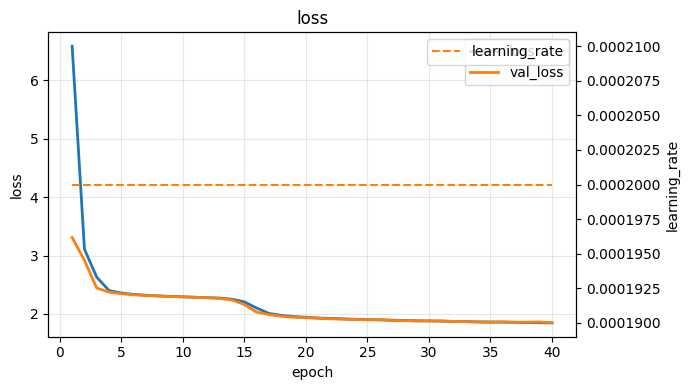

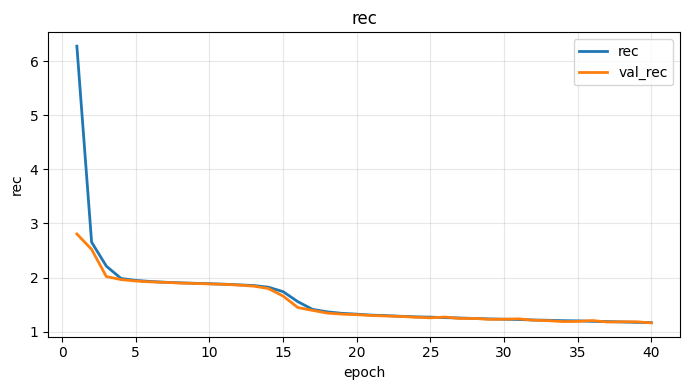

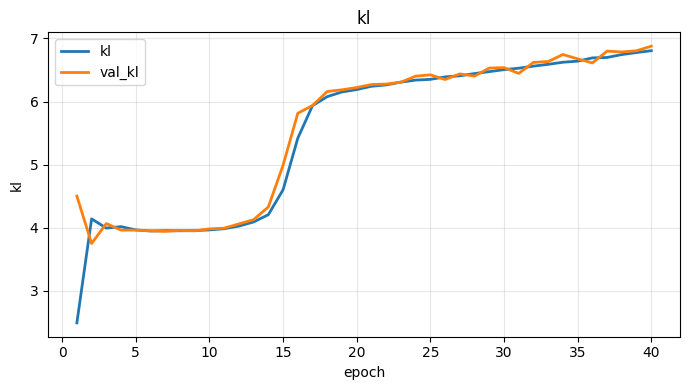

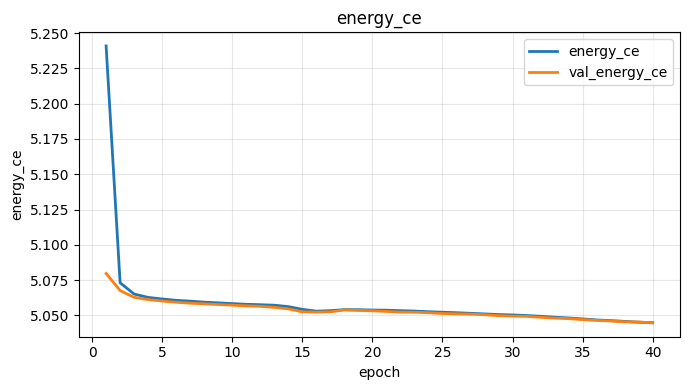

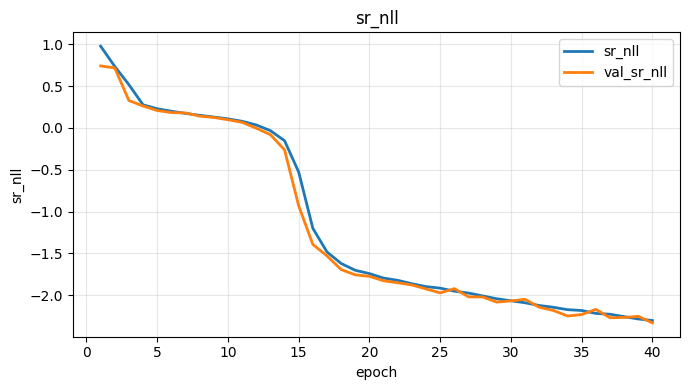

...

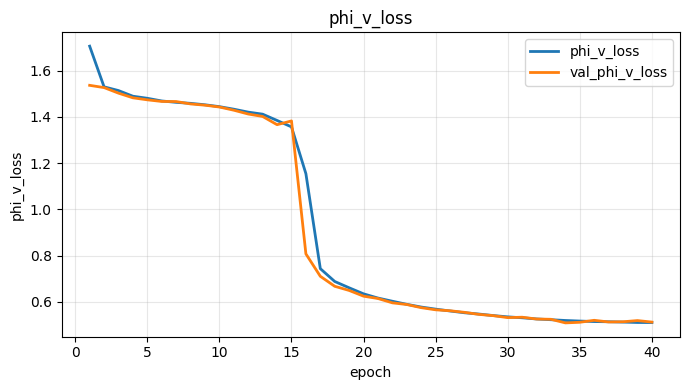

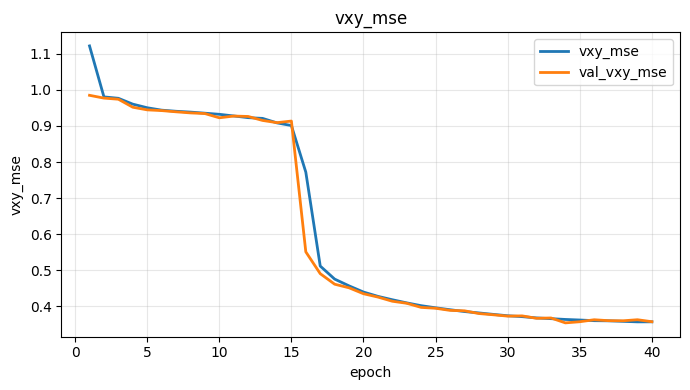

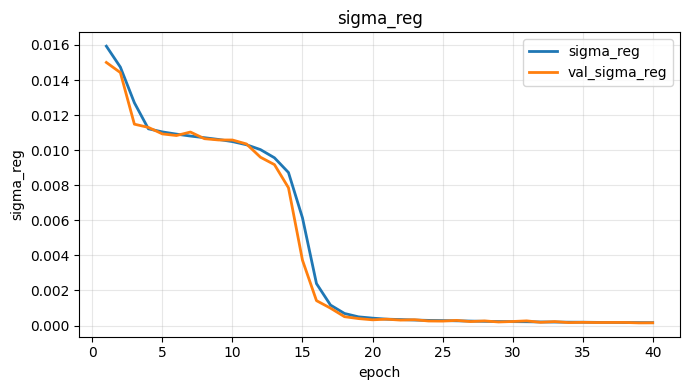

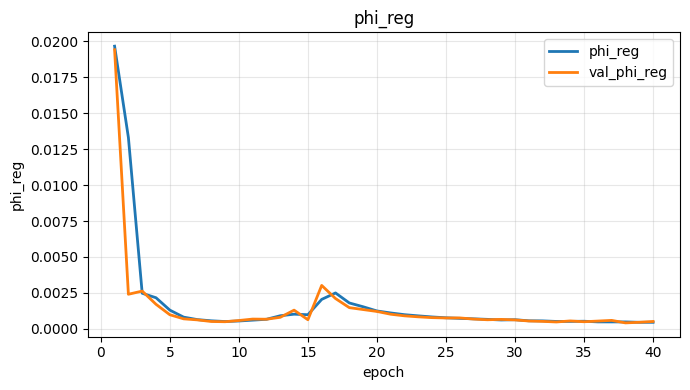

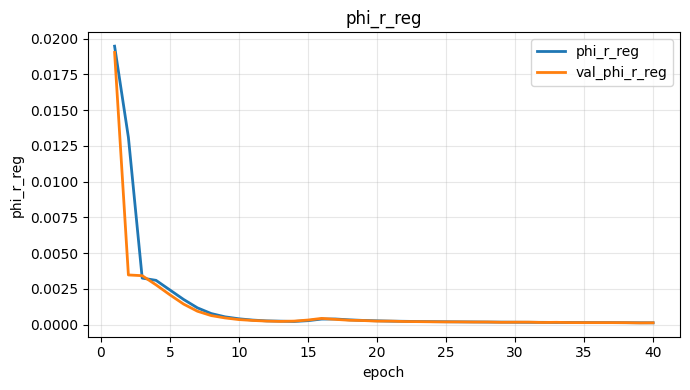

In [16]:
ge.plot_history(history)

In [22]:
checkpoint_info = ge.save_training_checkpoint(
    model=model,
    checkpoint_dir="checkpoints/task_adaptive_run_005",
    checkpoint_name="task_adaptive",
    epoch=40,
    history=history,
    model_config=model_config,
    preprocessing_metadata=preprocessing_metadata,
    training_metadata={
        "epochs_requested": 40,
        "learning_rate": 2e-4,
        "seed": 42,
    },
    callbacks=callbacks,
    notes="Checkpoint after task-adaptive energy training.",
)

## Generation and Validation

In [13]:
### SKIP MODEL TRAINING AND DIRECTLY LOAD A TRAINED MODEL FOR GENETATION AND EVALUATION

# ==========================================================
# Configuration for later saving and reference
# ==========================================================


model_config = {
    "model_class": "CVAE_CatEnergy_CatUV_TaskAdaptive",
    "n_types": n_types,
    "n_energy_bins": n_energy_bins,
    "n_uv_bins": U_V_NBINS_EFF,
    "latent_dim": 8,
    "hidden": [128, 128, 64, 64, 64],
    "beta": 0.1,
    "w_energy": 0.8,
    "w_sr": 1.1,
    "w_uv": 1.1,
    "w_phi_r": 1.4,
    "w_phi_v": 1.1,
    "w_xy": 0.005,
    "w_vxy": 0.025,
    "w_ur": 0.01,
    "sphere_R": R,
}

preprocessing_metadata = {
    "s_r_mean": s_r_mean,
    "s_r_std": s_r_std,
    "energy_bins": energy_bins,
    "u_v_bins": u_v_bins,
    "u_v_centers": u_v_centers,
    "type_probs": type_probs,
    "idx_to_type": idx_to_type,
    "n_types": n_types,
    "energy_binning_mode": feature_pack["energy_config"]["mode"],
}

# ==========================================================

model = ge.load_task_adaptive_model_for_generation(
    save_dir="trained_models/task_adaptive_energy_run_005",
    model_name="task_adaptive_cvae_energy",
    model_config=model_config,
    energy_bins=energy_bins,
    u_v_bins=u_v_bins,
    n_types=n_types,
    type_weights=type_weights,
    radius=R,
    compile_model_fn=None,   # non serve per generare
    verbose=1,
)

Loaded task-adaptive model.
Weights: trained_models/task_adaptive_energy_run_005/task_adaptive_cvae_energy.weights.h5
Task weights: trained_models/task_adaptive_energy_run_005/task_adaptive_cvae_energy_task_weights.json
Current task weights: {'energy': 0.2097152000000001, 'sr': 1.1, 'uv': 1.1, 'phi_r': 1.4, 'phi_v': 1.1, 'xy': 0.005, 'vxy': 0.025, 'ur': 0.01}


In [14]:
NGEN = len(X_cont_test)

gen_raw = ge.generate_latent_outputs(
    model=model,
    n_samples=NGEN,
    type_probs=type_probs,   # <-- probabilità vere
    n_types=n_types,
    idx_to_type=idx_to_type,
)

gen_feat = ge.reconstruct_generated_features(
    gen_raw,
    s_r_mean=s_r_mean,
    s_r_std=s_r_std,
    energy_bins=energy_bins,
    u_v_bins=u_v_bins,
    energy_mode="uniform",
)

gen_phys = ge.reconstruct_generated_physics(
    gen_feat,
    center=(0.0, 0.0, -507.66),
    radius=100.0,
)

real_phys = ge.reconstruct_real_test_physics(
    X_cont_test=X_cont_test,       # <-- unscaled
    E_test_raw=E_test_raw,         # <-- energia fisica
    u_v_test_raw=u_v_test_raw,     # <-- u_v continuo reale
    u_v_bins=u_v_bins,
    center=(0.0, 0.0, -507.66),
    radius=100.0,
)

ge.report_generated_constraints(gen_phys, radius=100.0)

scores = ge.compute_wasserstein_scores(real_phys, gen_phys)
print(scores)

--- CONSTRAINT CHECKS ---

Sphere constraint:
r_gen: mean 99.99999954922602 std 7.930228152898538e-06 min 99.99996971616967 max 100.00003735417755
mean |r-R| = 6.139454087349821e-06

Direction norm:
||v||: mean 1.0 std 1.3474344e-08 min 0.9999999 max 1.0000001
mean ||v||-1| = 1.8066327e-09

Unit circle checks:
phi_r norm: mean 1.0 std 3.478648e-08 min 0.9999998 max 1.0000001
phi_v norm: mean 1.0 std 3.586772e-08 min 0.9999998 max 1.0000001

Physical variables:
E_gen: min 0.050115217 max 0.7998388
u_r_gen min/max: -0.9994519 0.99987817
u_v_gen min/max: -0.9999919 0.039452747
fraction u_v_gen > 0: 0.028727745798656282
{'logE': 0.002849276592129026, 'x': 2.8451906588882223, 'y': 3.7998201982787854, 'z': 5.501204093987628, 'u_v': 0.017912073369209424, 'cphi_v': 0.03312250058113084, 'sphi_v': 0.06807086889802226, 'vx': 0.04245368793843286, 'vy': 0.024696204942836582, 'vz': 0.017912066086585725}


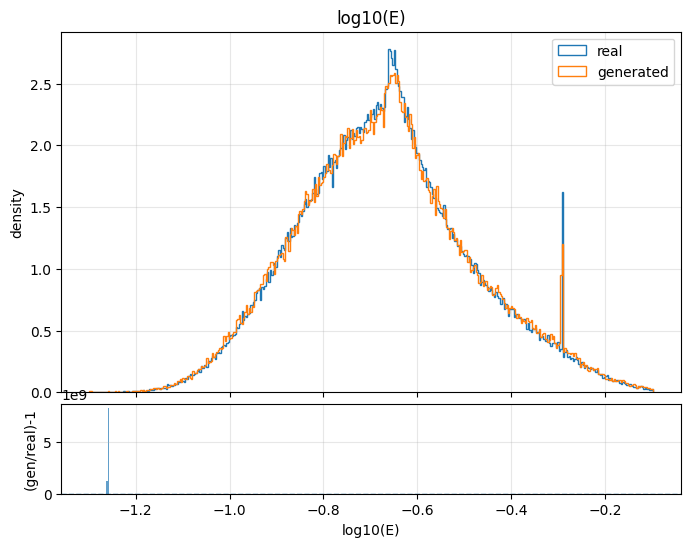

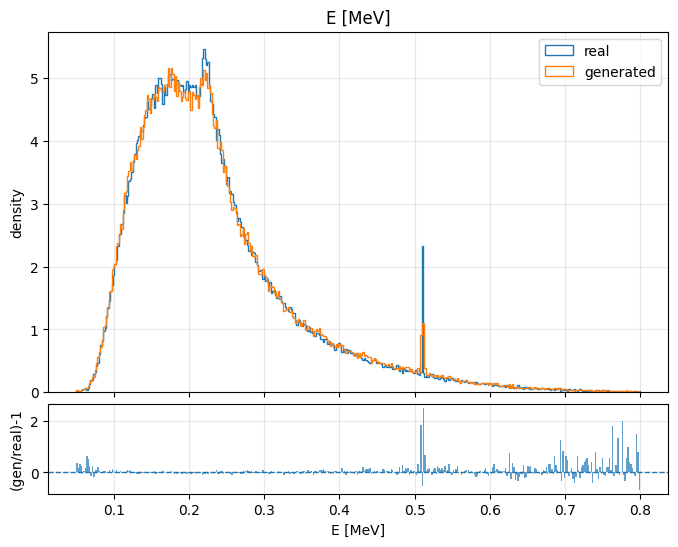

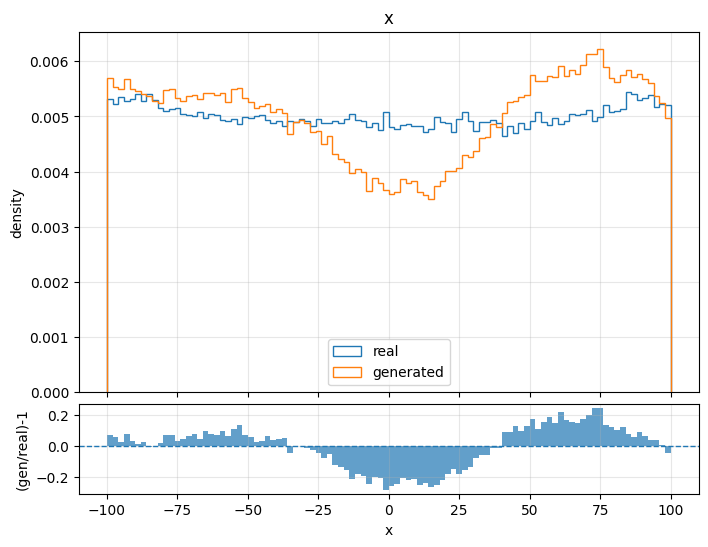

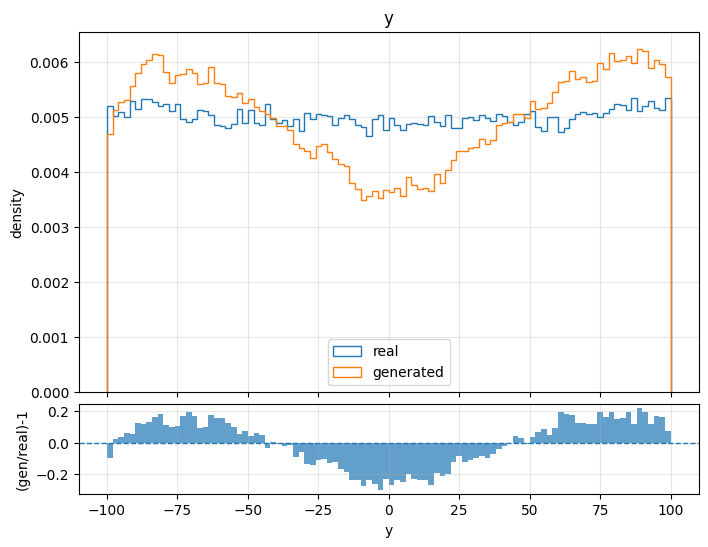

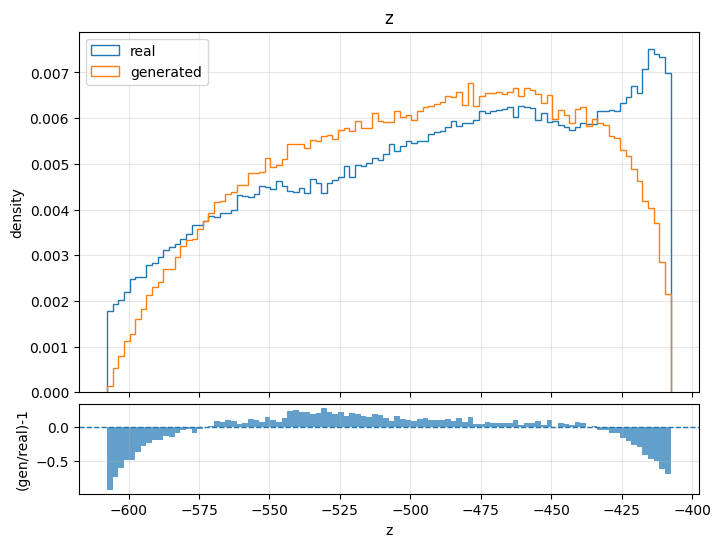

...

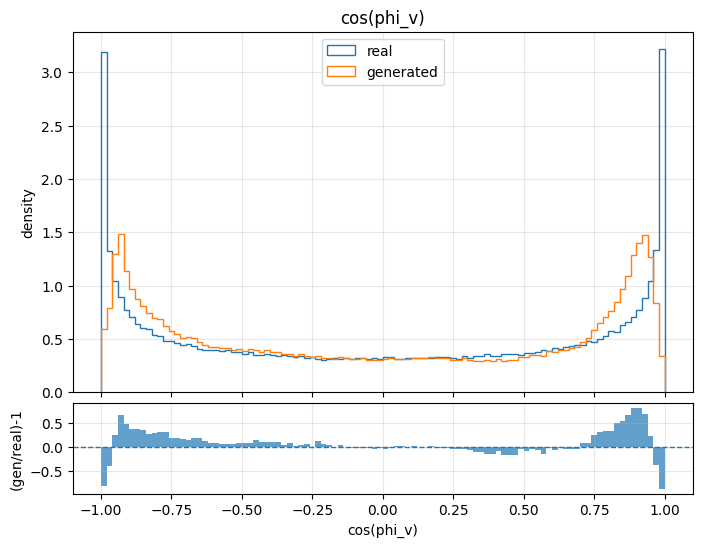

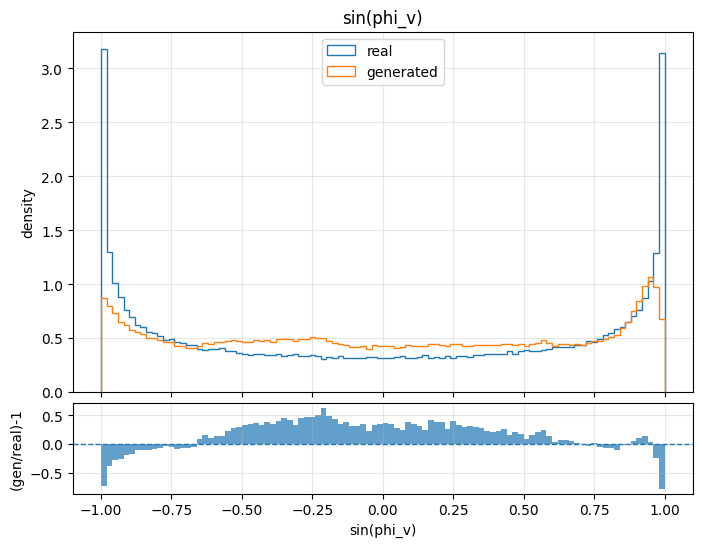

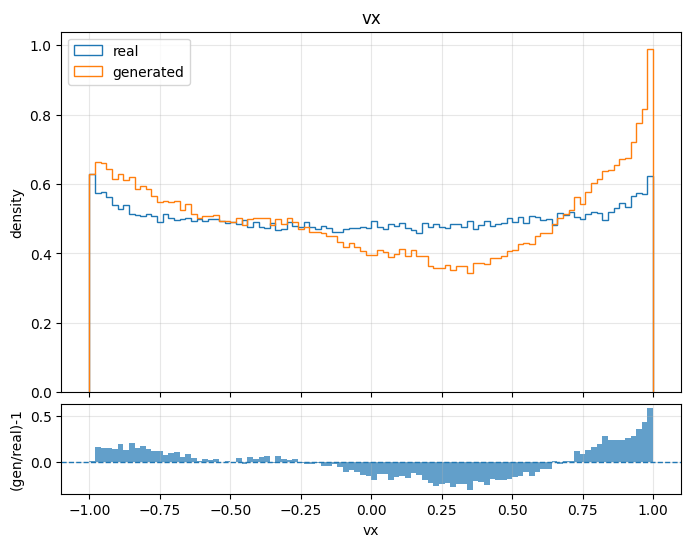

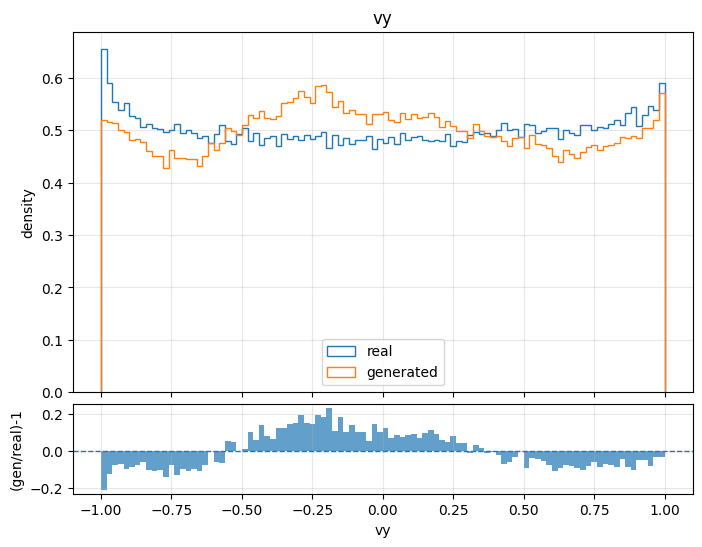

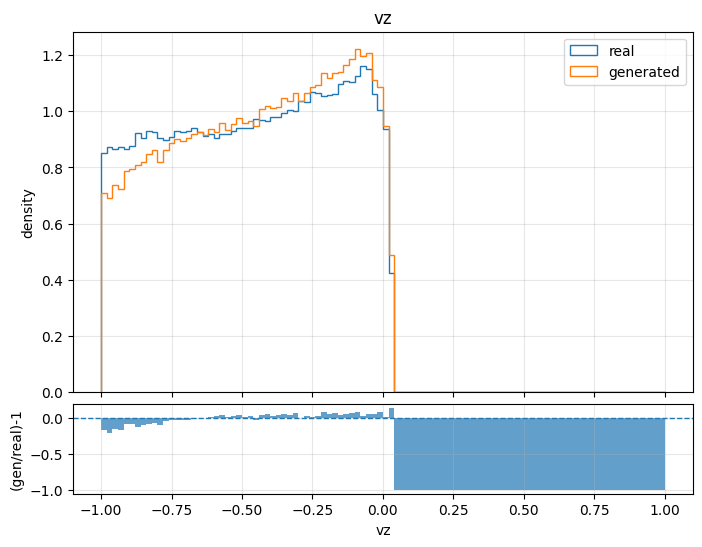


--- RANGE CHECK ---
logE real/gen: -1.2985218187136052 -0.0971983716800442 | -1.3000304 -0.096997544
u_v  real/gen: -0.99997324 0.03945439 | -0.9999919 0.039452747

Position:
x real/gen: -99.99881 99.999695 | -99.9999 99.9984
y real/gen: -99.99989 99.99974 | -99.999916 99.99939
z real/gen: -607.65607 -407.6601 | -607.6052 -407.67218

Direction:
cphi_v real/gen: -1.0 1.0 | -1.2578781 1.1700253
sphi_v real/gen: -1.0 1.0 | -1.4059062 1.2698519
vx real/gen: -0.9999941 0.9999922 | -0.99999875 0.99999994
vy real/gen: -0.99999374 0.9999845 | -0.9999966 0.99998856
vz real/gen: -0.99997324 0.03945439 | -0.9999919 0.039452747

--- COS/SIN NORM CHECK ---
phi_r real/gen: 1.0 0.98769623
phi_v real/gen: 1.0 0.953781


In [15]:
uv_plot_range = (
    min(real_phys["u_v_real"].min(), gen_phys["u_v_gen"].min()),
    max(real_phys["u_v_real"].max(), gen_phys["u_v_gen"].max())
)
ge.set_plot_theme("light")
ge.compare_hist_with_residuals(real_phys["logE_real"], gen_phys["logE_gen"], "log10(E)", bins=400)
ge.compare_hist_with_residuals(real_phys["E_real"], gen_phys["E_gen"], "E [MeV]", bins=400)

ge.compare_hist_with_residuals(real_phys["x_real"], gen_phys["x_gen"], "x", ratio_clip=5, bins=100)
ge.compare_hist_with_residuals(real_phys["y_real"], gen_phys["y_gen"], "y", ratio_clip=5, bins=100)
ge.compare_hist_with_residuals(real_phys["z_real"], gen_phys["z_gen"], "z", ratio_clip=5, bins=100)

ge.compare_hist_with_residuals(real_phys["u_v_real"], gen_phys["u_v_gen"], "u_v", range_=uv_plot_range, ratio_clip=5, bins=100)
ge.compare_hist_with_residuals(real_phys["cphi_v_real"], gen_phys["cphi_v_gen"], "cos(phi_v)", range_=(-1, 1), ratio_clip=5, bins=100)
ge.compare_hist_with_residuals(real_phys["sphi_v_real"], gen_phys["sphi_v_gen"], "sin(phi_v)", range_=(-1, 1), ratio_clip=5, bins=100)

ge.compare_hist_with_residuals(real_phys["vx_real"], gen_phys["vx_gen"], "vx", range_=(-1, 1), ratio_clip=5, bins=100)
ge.compare_hist_with_residuals(real_phys["vy_real"], gen_phys["vy_gen"], "vy", range_=(-1, 1), ratio_clip=5, bins=100)
ge.compare_hist_with_residuals(real_phys["vz_real"], gen_phys["vz_gen"], "vz", range_=(-1, 1), ratio_clip=5, bins=100)

ge.report_final_ranges(real_phys, gen_phys)
ge.report_norm_checks(real_phys, gen_phys)

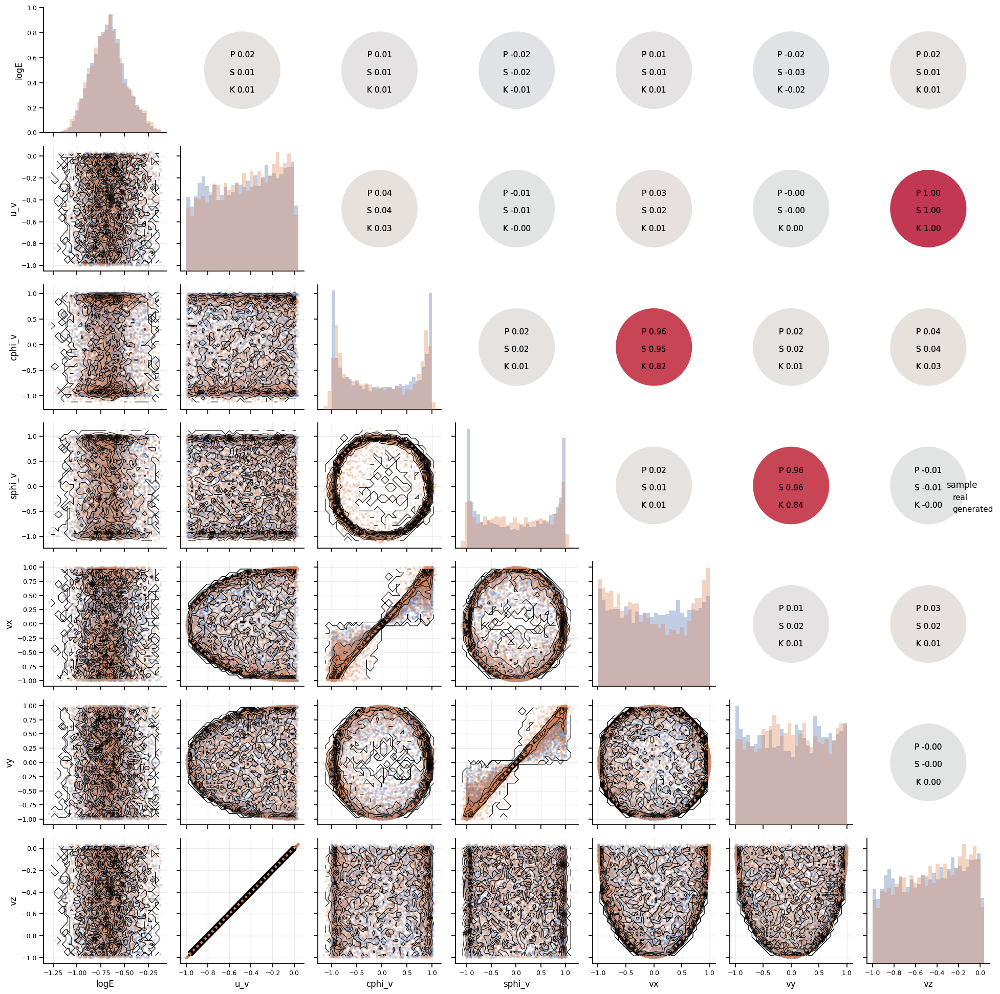

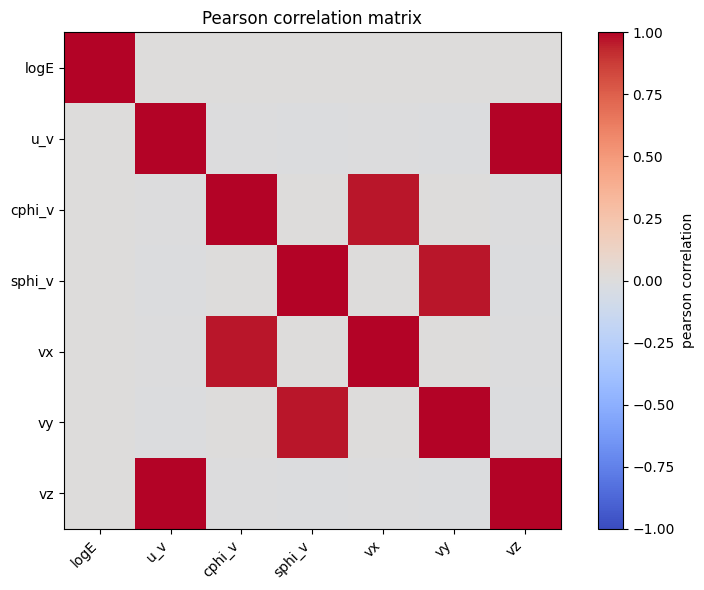

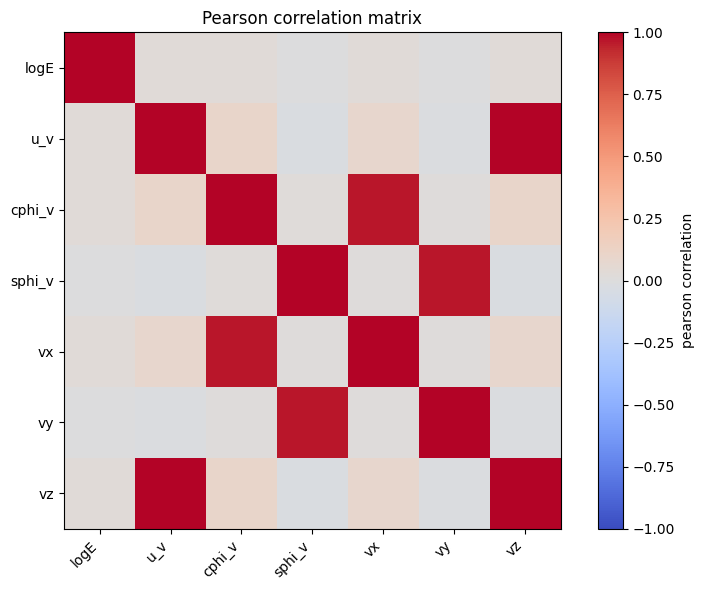

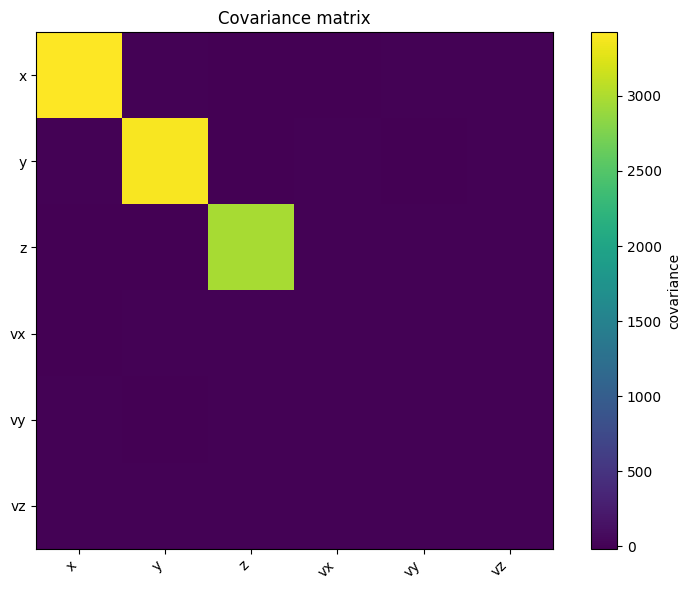

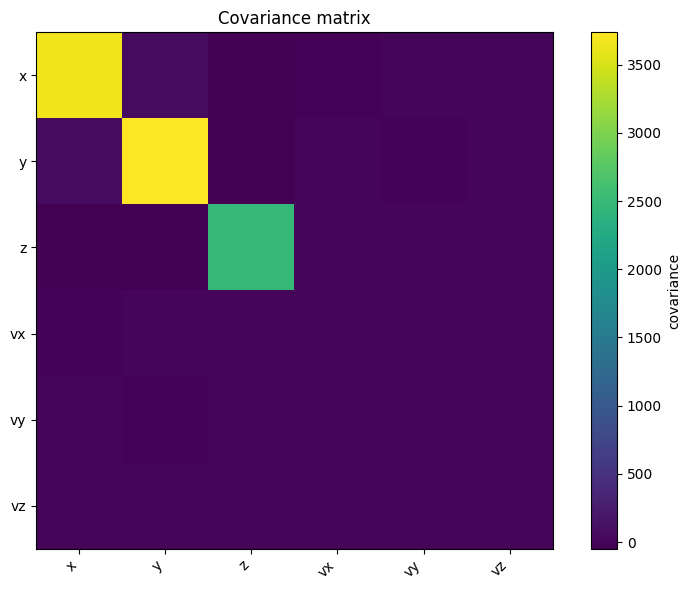

,x,y,z,vx,vy,vz
x,3654.805384,64.382223,-20.032416,-13.613079,-0.666469,-0.277584
y,64.382223,3735.956250,-47.831577,-0.387625,-17.651229,0.050526
z,-20.032416,-47.831577,2478.346667,0.519143,0.117966,-2.610455
vx,-13.613079,-0.387625,0.519143,0.391997,0.004377,0.015545
vy,-0.666469,-17.651229,0.117966,0.004377,0.323297,-0.003143
vz,-0.277584,0.050526,-2.610455,0.015545,-0.003143,0.085146


In [15]:
df_real_plot, df_gen_plot, df_compare = ge.build_real_generated_featureframes(real_phys, gen_phys)

ge.plot_pairgrid_physics(
    df_compare,
    cols=["logE", "u_v", "cphi_v", "sphi_v", "vx", "vy", "vz"],
    class_col="sample",
    sample_size=8000,
    lower_mode="scatter_contour",
)

ge.plot_correlation_matrix(
    df_real_plot,
    ["logE", "u_v", "cphi_v", "sphi_v", "vx", "vy", "vz"],
    method="pearson",
)

ge.plot_correlation_matrix(
    df_gen_plot,
    ["logE", "u_v", "cphi_v", "sphi_v", "vx", "vy", "vz"],
    method="pearson",
)

ge.plot_covariance_matrix(
    df_real_plot,
    ["x", "y", "z", "vx", "vy", "vz"],
)

ge.plot_covariance_matrix(
    df_gen_plot,
    ["x", "y", "z", "vx", "vy", "vz"],
)

In [20]:
df_real_plot, df_gen_plot, df_compare = ge.build_real_generated_featureframes(
    real_phys,
    gen_phys
)

corr_cols_compare = [
    "logE",
    "s_r",
    "u_v",
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_pairgrid_physics(
    df_compare,
    cols=corr_cols_compare,
    class_col="sample",      # real vs generated
    sample_size=8000,
    lower_mode="scatter",
    bins=30,
    contour_levels=8,
    figsize_scale=2.4,
)

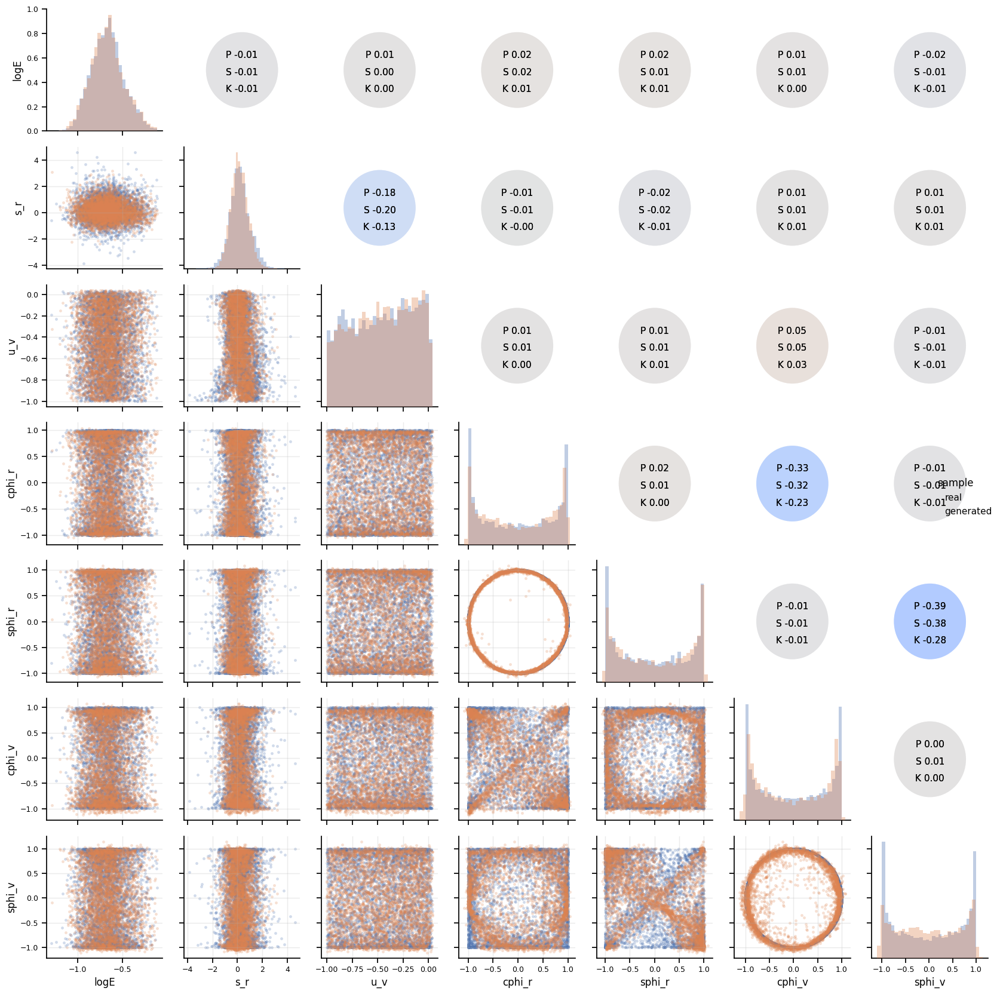

In [21]:
plt.show()

## Saving Model

In [23]:
# ==========================================================
# Final model saving with metadata - v0.6.1
# ==========================================================

save_info = ge.save_final_trained_model(
    model=model,
    save_dir="trained_models/task_adaptive_energy_run_005",
    model_name="task_adaptive_cvae_energy",
    history=history,
    model_config=model_config,
    preprocessing_metadata=preprocessing_metadata,
    training_metadata={
        "epochs_requested": 40,
        "learning_rate": 2e-4,
        "seed": 42,
    },
    #evaluation_metadata=evaluation_metadata,
    callbacks=callbacks,
    notes="Final model. Energy task adaptively down-weighted using validation energy distribution metric.",
)

Saved final trained model to: trained_models/task_adaptive_energy_run_005


In [16]:
ge.save_detector_table(
    gen_phys,
    filepath = "./checkpoints/generated_particles/generated_particles_run005.txt"
)

Saved detector table to: ./checkpoints/generated_particles/generated_particles_run005.txt
Rows saved: 280565
Columns: ['ParticleName', 'Energy', 'X', 'Y', 'Z', 'Vx', 'Vy', 'Vz']


,ParticleName,Energy,X,Y,Z,Vx,Vy,Vz
0,gamma,0.372631,22.266296,-66.741013,-436.597717,-0.587907,0.530236,-0.610913
1,gamma,0.137187,70.133125,-22.537733,-440.033142,0.983339,0.162240,-0.081997
2,gamma,0.118687,-88.730530,29.851686,-542.813538,0.780520,-0.227227,-0.582371
3,gamma,0.224146,54.294277,-36.351582,-431.958649,0.094628,0.315862,-0.944075
4,gamma,0.170033,98.331024,-12.008483,-493.992310,-0.549858,0.653579,-0.520087
...,...,...,...,...,...,...,...,...
280560,gamma,0.149738,98.535011,-15.996491,-513.573120,0.974233,0.090233,-0.206709
280561,gamma,0.155776,-76.811607,59.785694,-484.733032,0.260619,-0.280982,-0.923649
280562,gamma,0.255030,-41.846745,88.131439,-529.607666,0.417895,-0.703352,-0.575030
280563,gamma,0.313273,43.416828,90.017204,-504.213013,0.514510,-0.857452,0.007511
